# A Novel Kernel-Based Approach For Uneven length Symbolic Data: A Case Study for Establishing Type 2 Diabetes Risk


### LOOCV on SVM 



In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.svm import SVC
from util_log import *
from util_ker import *

In [2]:
#destop
#df_BOW = pd.read_csv('/Users/osita/Documents/GitHub/EHR/LogRegressProj/SBag_of_words.csv', header=None)
#df_BIN = pd.read_csv('/Users/osita/Documents/GitHub/EHR/LogRegressProj/SBinaryCount.csv', header=None)

In [3]:
df_BOW = pd.read_csv(r'C:\\Users\\NN133\\Documents\\GitHub\\LogRegressProj\\SBag_of_words.csv', header=None)
df_BIN = pd.read_csv(r'C:\\Users\\NN133\\Documents\\GitHub\\LogRegressProj\\SBinaryCount.csv', header=None)

In [4]:
#labelloc = '/Users/osita/Documents/GitHub/EHR/LogRegressProj/ytr.csv'
labelloc = 'C:\\Users\\NN133\\Documents\\GitHub\\LogRegressProj\\ytr.csv'
label = pd.read_csv(labelloc, header=None)

In [5]:
#Change the -ve label from -1 to 0
label.replace({-1:0}, inplace=True)

In [6]:
#Extract the labels
ytr = label.values
ytr.shape

(158, 1)

In [7]:
#Extract the Data
BOW = df_BOW.values
BIN = df_BIN.values

print(f'--> Size of BoW features --- {BOW.shape}')
print(f'--> Size of BIN features --- {BIN.shape}')

--> Size of BoW features --- (158, 3054)
--> Size of BIN features --- (158, 3054)


## Set kernel parameters

In [8]:
#Set kernel parameters
params = {}
params['linear']  = [1]
params['H_poly']  = [0.5,2,3,4]
params['poly']    = [0.5,2,3,4]
params['rbf']     = [0.006,0.007,0.008,0.00987,0.01,0.0125,0.033, 0.0458, 0.05,0.05897, 0.00000000000125,0.000000125,0.00000125,0.00001,0.001,0.0023,0.005,0.007,0.00987,0.01,0.0125,0.033,0.1,1,2,3,4,5,7.5,12.5,125,1250,123500000]
params['erbf']    = [0.006,0.007,0.008,0.00987,0.01,0.0125,0.033, 0.0458, 0.05,0.05897, 0.00000000000125,0.000000125,0.00000125,0.00001,0.001,0.0023,0.005,0.007,0.00987,0.01,0.0125,0.033,0.1,1,2,3,4,5,7.5,12.5,125,1250,123500000]
params['laplace'] = [0.006,0.007,0.008,0.00987,0.01,0.0125,0.033, 0.0458, 0.05,0.05897, 0.00000000000125,0.000000125,0.00000125,0.00001,0.001,0.0023,0.005,0.007,0.00987,0.01,0.0125,0.033,0.1,1,2,3,4,5,7.5,12.5,125,1250,123500000]

## Linear Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.570 (0.495)
--> The total of 158 predicted with only 90 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  35
Actual label is False while we predicted False -  True Negatve   =  55
Actual label is False while we predicted True  -  False Positive =  31
Actual label is True while we predicted False  -  False Negative =  37


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 56.96 % was achieved
--> Sensitity of 0.49 was achieved
--> Specificity of 0.64 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.51 false negative rate was achieved
--> 0.36 false positve rate (fallout) was achieved
--> Negative predictive value of 0.6
--> Recall value 0f 0.49 achieved
--> The precision vaue of 0.53 achieved
--> An Fscore of 0.51 achieved


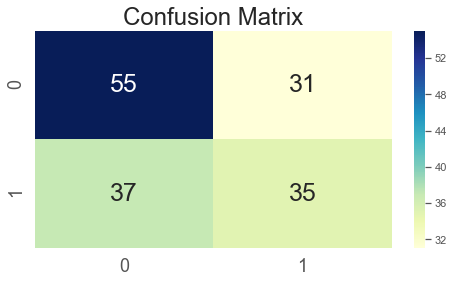

In [9]:
#Fit Cross validation model 
kernel = ['linear']
OUT_linear = fitkernelLOOCV(BOW, ytr, kernel, params)

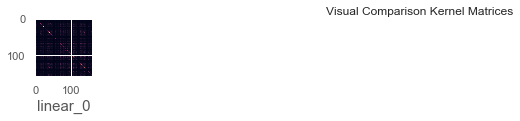

In [10]:
#Analyse performance results
PerfEva_linear, KerAna_linear, CVPerf_linear, CVvalus_linear  = Analyse_ResultsLOOCV(OUT_linear)

In [11]:
#Extract performance evaluation
PerfEva_linear

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
linear_0,66,92,56.96,0.49,0.64,0.42,0.58,0.51,0.36,0.6,0.49,0.53,0.51


In [12]:
PerfEva_linear[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
linear_0,0.51,56.96,0.49,0.64


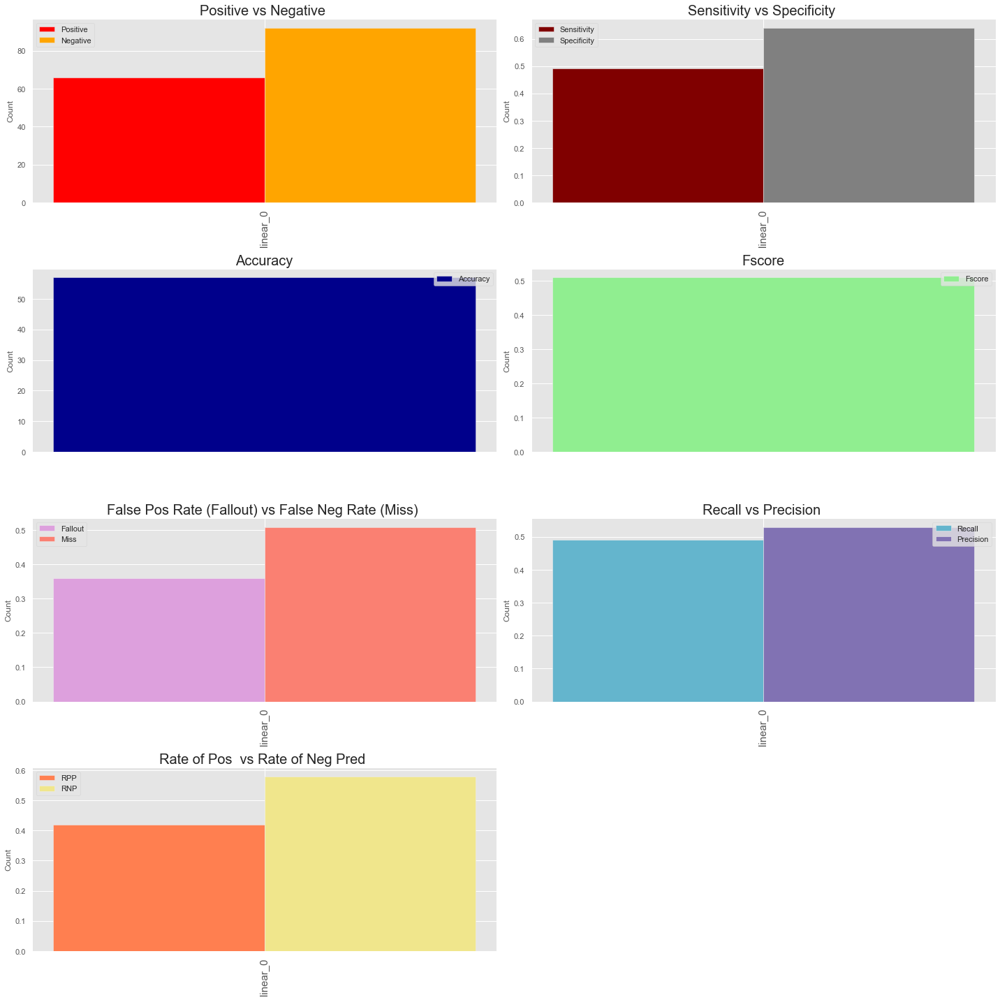

In [13]:
#visualize results
plotResult(PerfEva_linear)

In [14]:
#Extract best performing parameter
id_linear = PerfEva_linear.reset_index().Fscore.argmax()
max_Params_linear = params[kernel[0]][id_linear]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_linear.Fscore[id_linear]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_linear.Accu[id_linear]}')

Best Fscore obtained with linear kernel   - > 0.51
Best Accuracy obtained with linear kernel - > 56.96


In [15]:
#Best result showing the specific kernel
BestRes_linear = pd.DataFrame(PerfEva_linear.iloc[id_linear,:]).T
#index with ref to specific kernel removed. 
BestRes_linear = BestRes_linear.reset_index().drop(['index'], axis =1)
BestRes_linear

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,66.0,92.0,56.96,0.49,0.64,0.42,0.58,0.51,0.36,0.6,0.49,0.53,0.51


In [16]:
BestRes_linear[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.51,56.96,0.49,0.64


In [17]:
#Perf mean score and std
CVPerf_linear.round(4)

,mean score,std
linear_0,0.5696,0.4951


In [18]:
#Extract best score mean/std
Bestscore_linear = pd.DataFrame(CVPerf_linear.iloc[id_linear,:]).T.round(2)
Bestscore_linear = Bestscore_linear.reset_index().drop(['index'], axis =1)
Bestscore_linear

,mean score,std
0,0.57,0.5


In [19]:
#Kernel performance
KerAna_linear

,train_kernel_time,diag_Dominance,is_PSD
linear_0,0.00351048,False,True


In [20]:
#Extract best score mean/std
BestAnalysis_linear = pd.DataFrame(KerAna_linear.iloc[id_linear,:]).T
BestAnalysis_linear = BestAnalysis_linear.reset_index().drop(['index'], axis =1)
BestAnalysis_linear

,train_kernel_time,diag_Dominance,is_PSD
0,0.00351048,False,True


## Poly Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.462 (0.499)
--> The total of 158 predicted with only 73 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  26
Actual label is False while we predicted False -  True Negatve   =  47
Actual label is False while we predicted True  -  False Positive =  40
Actual label is True while we predicted False  -  False Negative =  45


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 46.2 % was achieved
--> Sensitity of 0.37 was achieved
--> Specificity of 0.54 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.63 false negative rate was achieved
--> 0.46 false positve rate (fallout) was achieved
--> Negative predictive value of 0.51
--> Recall value 0f 0.37 achieved
--> The precision vaue of 0.39 achieved
--> An Fscore of 0.38 achieved


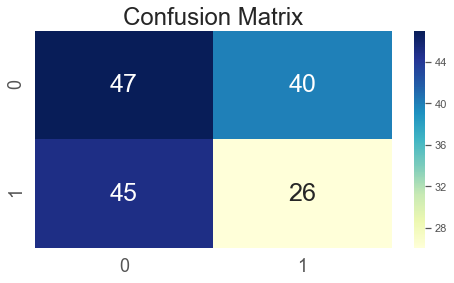

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.601 (0.490)
--> The total of 158 predicted with only 95 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  41
Actual label is False while we predicted False -  True Negatve   =  54
Actual label is False while we predicted True  -  False Positive =  25
Actual label is True while we predicted False  -  False Negative =  38


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 60.13 % was achieved
--> Sensitity of 0.52 was achieved
--> Specificity of 0.68 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.48 false negative rate was achieved
--> 0.32 false positve rate (fallout) was achieved
--> Negative predictive value of 0.59
--> Recall value 0f 0.52 achieved
--> The precision vaue of 0.62 achieved
--> An Fscore of 0.5

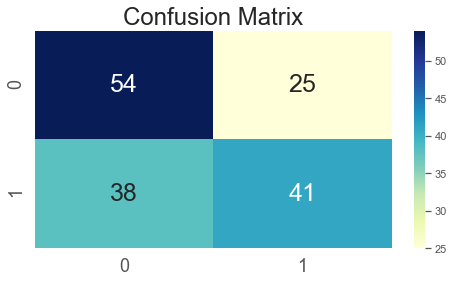

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.620 (0.485)
--> The total of 158 predicted with only 98 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  49
Actual label is False while we predicted False -  True Negatve   =  49
Actual label is False while we predicted True  -  False Positive =  17
Actual label is True while we predicted False  -  False Negative =  43


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 62.03 % was achieved
--> Sensitity of 0.53 was achieved
--> Specificity of 0.74 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.47 false negative rate was achieved
--> 0.26 false positve rate (fallout) was achieved
--> Negative predictive value of 0.53
--> Recall value 0f 0.53 achieved
--> The precision vaue of 0.74 achieved
--> An Fscore of 0.6

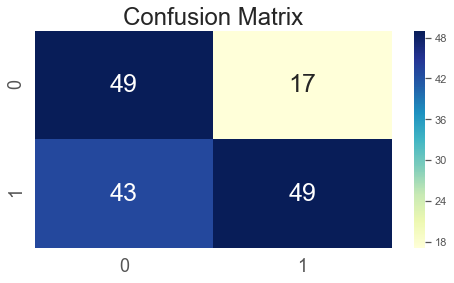

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.595 (0.491)
--> The total of 158 predicted with only 94 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  51
Actual label is False while we predicted False -  True Negatve   =  43
Actual label is False while we predicted True  -  False Positive =  15
Actual label is True while we predicted False  -  False Negative =  49


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 59.49 % was achieved
--> Sensitity of 0.51 was achieved
--> Specificity of 0.74 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.49 false negative rate was achieved
--> 0.26 false positve rate (fallout) was achieved
--> Negative predictive value of 0.47
--> Recall value 0f 0.51 achieved
--> The precision vaue of 0.77 achieved
--> An Fscore of 0.6

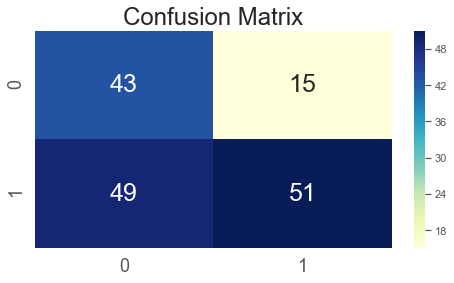

In [21]:
#Fit Cross validation model 
kernel = ['poly']
OUT_poly = fitkernelLOOCV(BOW, ytr, kernel, params)

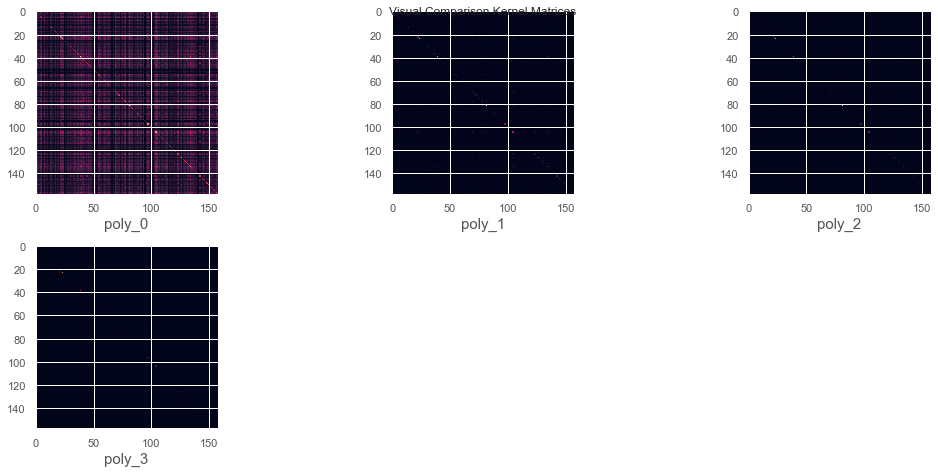

In [22]:
#Analyse performance results
PerfEva_poly, KerAna_poly, CVPerf_poly, CVvalus_poly  = Analyse_ResultsLOOCV(OUT_poly)

In [23]:
#Extract performance evaluation
PerfEva_poly

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
poly_0,66,92,46.20,0.37,0.54,0.42,0.58,0.63,0.46,0.51,0.37,0.39,0.38
poly_1,66,92,60.13,0.52,0.68,0.42,0.58,0.48,0.32,0.59,0.52,0.62,0.57
poly_2,66,92,62.03,0.53,0.74,0.42,0.58,0.47,0.26,0.53,0.53,0.74,0.62
poly_3,66,92,59.49,0.51,0.74,0.42,0.58,0.49,0.26,0.47,0.51,0.77,0.61


In [24]:
PerfEva_poly[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
poly_0,0.38,46.20,0.37,0.54
poly_1,0.57,60.13,0.52,0.68
poly_2,0.62,62.03,0.53,0.74
poly_3,0.61,59.49,0.51,0.74


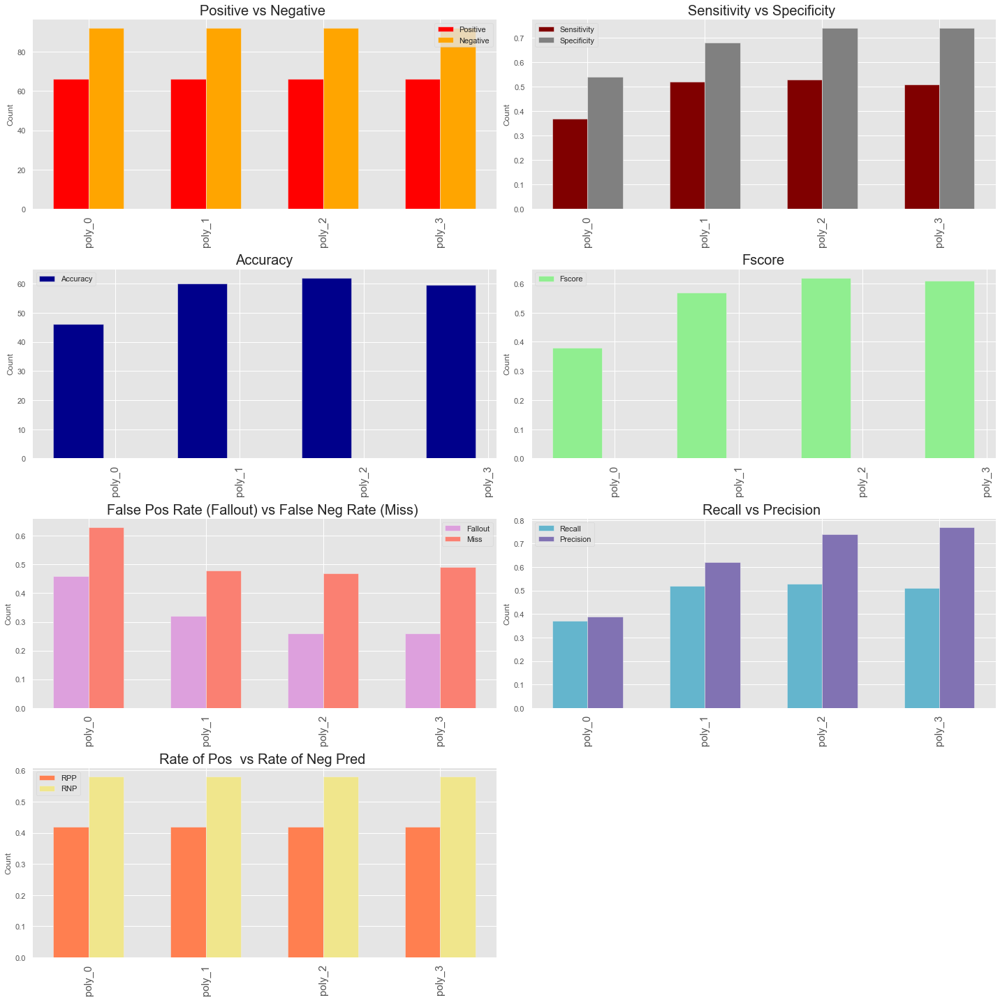

In [25]:
#visualize results
plotResult(PerfEva_poly)

In [26]:
#Extract best performing parameter
id_poly = PerfEva_poly.reset_index().Fscore.argmax()
max_Params_poly = params[kernel[0]][id_poly]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_poly.Fscore[id_poly]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_poly.Accu[id_poly]}')

Best Fscore obtained with poly kernel   - > 0.62
Best Accuracy obtained with poly kernel - > 62.03


In [27]:
#Best result showing the specific kernel
BestRes_poly = pd.DataFrame(PerfEva_poly.iloc[id_poly,:]).T
#index with ref to specific kernel removed. 
BestRes_poly = BestRes_poly.reset_index().drop(['index'], axis =1)
BestRes_poly

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,66.0,92.0,62.03,0.53,0.74,0.42,0.58,0.47,0.26,0.53,0.53,0.74,0.62


In [28]:
BestRes_poly[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.62,62.03,0.53,0.74


In [29]:
#Perf mean score and std
CVPerf_poly.round(2)

,mean score,std
poly_0,0.46,0.50
poly_1,0.60,0.49
poly_2,0.62,0.49
poly_3,0.59,0.49


In [30]:
#Extract best score mean/std
Bestscore_poly = pd.DataFrame(CVPerf_poly.iloc[id_poly,:]).T.round(2)
Bestscore_poly = Bestscore_poly.reset_index().drop(['index'], axis =1)
Bestscore_poly

,mean score,std
0,0.62,0.49


In [31]:
#Kernel performance
KerAna_poly

,train_kernel_time,diag_Dominance,is_PSD
poly_0,0.00350952,False,True
poly_1,0.0045135,False,True
poly_2,0.00551486,False,True
poly_3,0.00501299,False,True


In [32]:
#Extract best score mean/std
BestAnalysis_poly = pd.DataFrame(KerAna_poly.iloc[id_poly,:]).T
BestAnalysis_poly = BestAnalysis_poly.reset_index().drop(['index'], axis =1)
BestAnalysis_poly

,train_kernel_time,diag_Dominance,is_PSD
0,0.00551486,False,True


## H_Poly Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.475 (0.499)
--> The total of 158 predicted with only 75 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  26
Actual label is False while we predicted False -  True Negatve   =  49
Actual label is False while we predicted True  -  False Positive =  40
Actual label is True while we predicted False  -  False Negative =  43


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 47.47 % was achieved
--> Sensitity of 0.38 was achieved
--> Specificity of 0.55 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.62 false negative rate was achieved
--> 0.45 false positve rate (fallout) was achieved
--> Negative predictive value of 0.53
--> Recall value 0f 0.38 achieved
--> The precision vaue of 0.39 achieved
--> An Fscore of 0.38 achieved


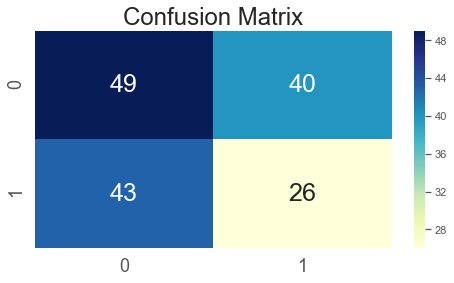

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.601 (0.490)
--> The total of 158 predicted with only 95 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  41
Actual label is False while we predicted False -  True Negatve   =  54
Actual label is False while we predicted True  -  False Positive =  25
Actual label is True while we predicted False  -  False Negative =  38


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 60.13 % was achieved
--> Sensitity of 0.52 was achieved
--> Specificity of 0.68 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.48 false negative rate was achieved
--> 0.32 false positve rate (fallout) was achieved
--> Negative predictive value of 0.59
--> Recall value 0f 0.52 achieved
--> The precision vaue of 0.62 achieved
--> An Fscore of 0.5

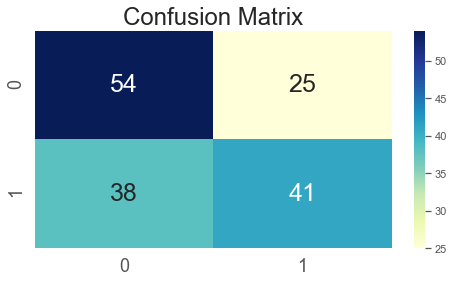

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.620 (0.485)
--> The total of 158 predicted with only 98 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  49
Actual label is False while we predicted False -  True Negatve   =  49
Actual label is False while we predicted True  -  False Positive =  17
Actual label is True while we predicted False  -  False Negative =  43


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 62.03 % was achieved
--> Sensitity of 0.53 was achieved
--> Specificity of 0.74 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.47 false negative rate was achieved
--> 0.26 false positve rate (fallout) was achieved
--> Negative predictive value of 0.53
--> Recall value 0f 0.53 achieved
--> The precision vaue of 0.74 achieved
--> An Fscore of 0.6

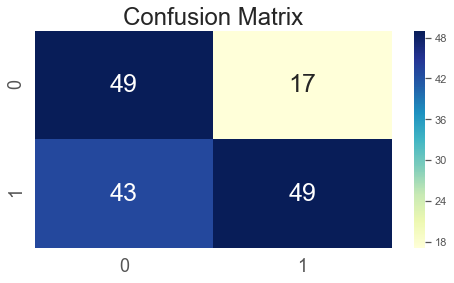

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.595 (0.491)
--> The total of 158 predicted with only 94 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  51
Actual label is False while we predicted False -  True Negatve   =  43
Actual label is False while we predicted True  -  False Positive =  15
Actual label is True while we predicted False  -  False Negative =  49


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 59.49 % was achieved
--> Sensitity of 0.51 was achieved
--> Specificity of 0.74 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.49 false negative rate was achieved
--> 0.26 false positve rate (fallout) was achieved
--> Negative predictive value of 0.47
--> Recall value 0f 0.51 achieved
--> The precision vaue of 0.77 achieved
--> An Fscore of 0.6

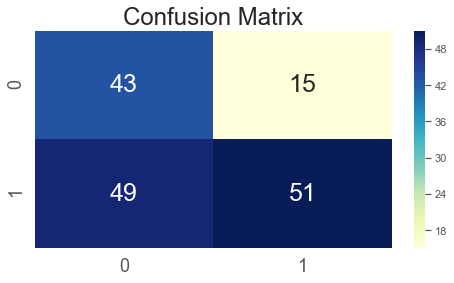

In [33]:
#Fit Cross validation model 
kernel = ['H_poly']
OUT_H_poly = fitkernelLOOCV(BOW, ytr, kernel, params)

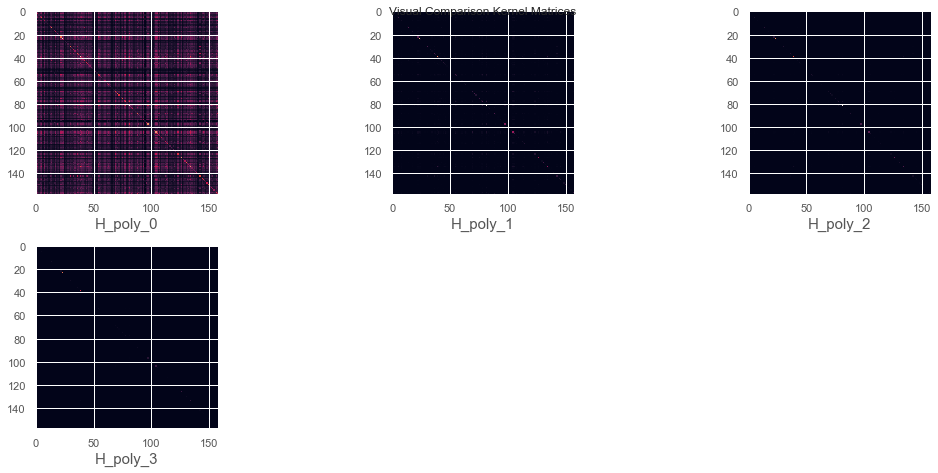

In [34]:
#Analyse performance results
PerfEva_H_poly, KerAna_H_poly, CVPerf_H_poly, CVvalus_H_poly  = Analyse_ResultsLOOCV(OUT_H_poly)

In [35]:
#Extract performance evaluation
PerfEva_H_poly

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
H_poly_0,66,92,47.47,0.38,0.55,0.42,0.58,0.62,0.45,0.53,0.38,0.39,0.38
H_poly_1,66,92,60.13,0.52,0.68,0.42,0.58,0.48,0.32,0.59,0.52,0.62,0.57
H_poly_2,66,92,62.03,0.53,0.74,0.42,0.58,0.47,0.26,0.53,0.53,0.74,0.62
H_poly_3,66,92,59.49,0.51,0.74,0.42,0.58,0.49,0.26,0.47,0.51,0.77,0.61


In [36]:
PerfEva_H_poly[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
H_poly_0,0.38,47.47,0.38,0.55
H_poly_1,0.57,60.13,0.52,0.68
H_poly_2,0.62,62.03,0.53,0.74
H_poly_3,0.61,59.49,0.51,0.74


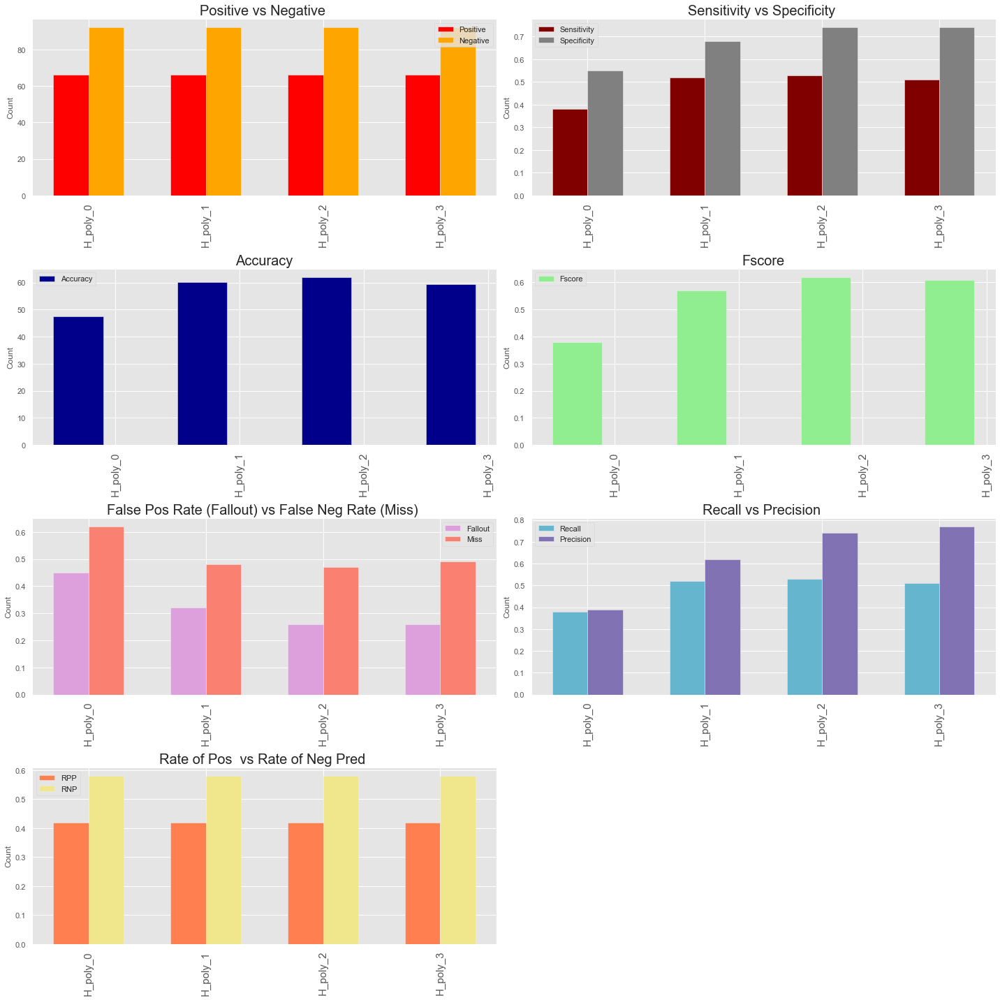

In [37]:
#visualize results
plotResult(PerfEva_H_poly)

In [38]:
#Extract best performing parameter
id_H_poly = PerfEva_H_poly.reset_index().Fscore.argmax()
max_Params_H_poly = params[kernel[0]][id_H_poly]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_H_poly.Fscore[id_H_poly]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_H_poly.Accu[id_H_poly]}')

Best Fscore obtained with H_poly kernel   - > 0.62
Best Accuracy obtained with H_poly kernel - > 62.03


In [39]:
#Best result showing the specific kernel
BestRes_H_poly = pd.DataFrame(PerfEva_H_poly.iloc[id_H_poly,:]).T
#index with ref to specific kernel removed. 
BestRes_H_poly = BestRes_H_poly.reset_index().drop(['index'], axis =1)
BestRes_H_poly

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,66.0,92.0,62.03,0.53,0.74,0.42,0.58,0.47,0.26,0.53,0.53,0.74,0.62


In [40]:
BestRes_H_poly[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.62,62.03,0.53,0.74


In [41]:
#Perf mean score and std
CVPerf_H_poly.round(2)

,mean score,std
H_poly_0,0.47,0.50
H_poly_1,0.60,0.49
H_poly_2,0.62,0.49
H_poly_3,0.59,0.49


In [42]:
#Extract best score mean/std
Bestscore_H_poly = pd.DataFrame(CVPerf_H_poly.iloc[id_H_poly,:]).T.round(2)
Bestscore_H_poly = Bestscore_H_poly.reset_index().drop(['index'], axis =1)
Bestscore_H_poly

,mean score,std
0,0.62,0.49


In [43]:
#Kernel performance
KerAna_H_poly

,train_kernel_time,diag_Dominance,is_PSD
H_poly_0,0.00300884,False,True
H_poly_1,0.00451255,False,True
H_poly_2,0.00551391,False,True
H_poly_3,0.00501299,False,True


In [44]:
#Extract best score mean/std
BestAnalysis_H_poly = pd.DataFrame(KerAna_H_poly.iloc[id_H_poly,:]).T
BestAnalysis_H_poly = BestAnalysis_H_poly.reset_index().drop(['index'], axis =1)
BestAnalysis_H_poly

,train_kernel_time,diag_Dominance,is_PSD
0,0.00551391,False,True


## RBF Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.576 (0.494)
--> The total of 158 predicted with only 91 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  91
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  1

Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 57.59 % was achieved
--> Sensitity of 0.0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 1.0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achieved
--> Negative predictive value of 0.99
--> Recall value 0f 0.0 achieved
--> The precision vaue of 0.0 achieved
--> An Fscor

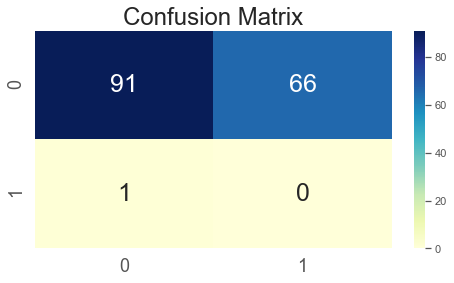

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.589 (0.492)
--> The total of 158 predicted with only 93 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  5
Actual label is False while we predicted False -  True Negatve   =  88
Actual label is False while we predicted True  -  False Positive =  61
Actual label is True while we predicted False  -  False Negative =  4


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.86 % was achieved
--> Sensitity of 0.56 was achieved
--> Specificity of 0.59 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.44 false negative rate was achieved
--> 0.41 false positve rate (fallout) was achieved
--> Negative predictive value of 0.96
--> Recall value 0f 0.56 achieved
--> The precision vaue of 0.08 achieved
--> An Fscore of 0.14 achieved


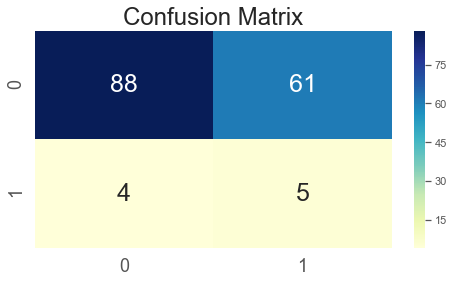

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.608 (0.488)
--> The total of 158 predicted with only 96 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  8
Actual label is False while we predicted False -  True Negatve   =  88
Actual label is False while we predicted True  -  False Positive =  58
Actual label is True while we predicted False  -  False Negative =  4


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 60.76 % was achieved
--> Sensitity of 0.67 was achieved
--> Specificity of 0.6 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.33 false negative rate was achieved
--> 0.4 false positve rate (fallout) was achieved
--> Negative predictive value of 0.96
--> Recall value 0f 0.67 achieved
--> The precision vaue of 0.12 achieved
--> An Fscore of 0.2 achieved


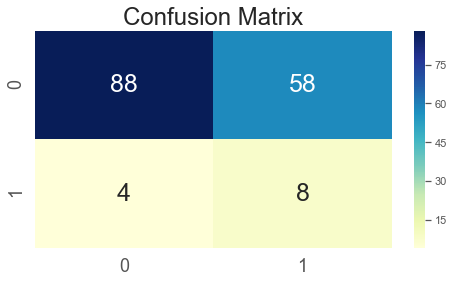

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.614 (0.487)
--> The total of 158 predicted with only 97 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  9
Actual label is False while we predicted False -  True Negatve   =  88
Actual label is False while we predicted True  -  False Positive =  57
Actual label is True while we predicted False  -  False Negative =  4


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 61.39 % was achieved
--> Sensitity of 0.69 was achieved
--> Specificity of 0.61 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.31 false negative rate was achieved
--> 0.39 false positve rate (fallout) was achieved
--> Negative predictive value of 0.96
--> Recall value 0f 0.69 achieved
--> The precision vaue of 0.14 achieved
--> An Fscore of 0.23 

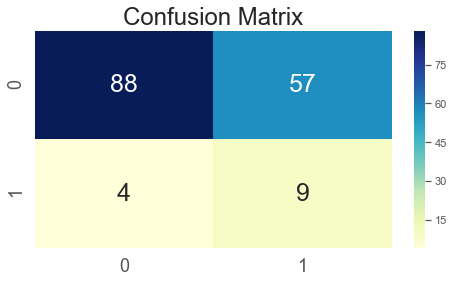

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.620 (0.485)
--> The total of 158 predicted with only 98 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  10
Actual label is False while we predicted False -  True Negatve   =  88
Actual label is False while we predicted True  -  False Positive =  56
Actual label is True while we predicted False  -  False Negative =  4


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 62.03 % was achieved
--> Sensitity of 0.71 was achieved
--> Specificity of 0.61 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.29 false negative rate was achieved
--> 0.39 false positve rate (fallout) was achieved
--> Negative predictive value of 0.96
--> Recall value 0f 0.71 achieved
--> The precision vaue of 0.15 achieved
--> An Fscore of 0.25

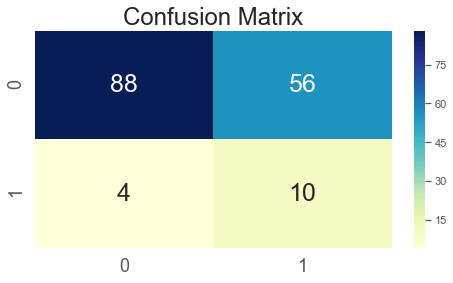

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.608 (0.488)
--> The total of 158 predicted with only 96 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  9
Actual label is False while we predicted False -  True Negatve   =  87
Actual label is False while we predicted True  -  False Positive =  57
Actual label is True while we predicted False  -  False Negative =  5


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 60.76 % was achieved
--> Sensitity of 0.64 was achieved
--> Specificity of 0.6 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.36 false negative rate was achieved
--> 0.4 false positve rate (fallout) was achieved
--> Negative predictive value of 0.95
--> Recall value 0f 0.64 achieved
--> The precision vaue of 0.14 achieved
--> An Fscore of 0.23 ac

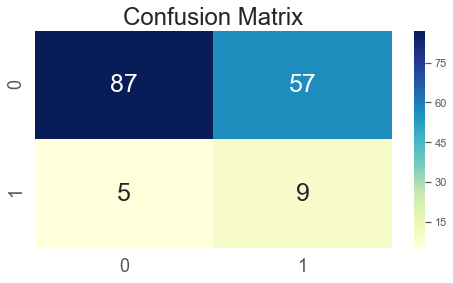

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.589 (0.492)
--> The total of 158 predicted with only 93 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  5
Actual label is False while we predicted False -  True Negatve   =  88
Actual label is False while we predicted True  -  False Positive =  61
Actual label is True while we predicted False  -  False Negative =  4


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.86 % was achieved
--> Sensitity of 0.56 was achieved
--> Specificity of 0.59 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.44 false negative rate was achieved
--> 0.41 false positve rate (fallout) was achieved
--> Negative predictive value of 0.96
--> Recall value 0f 0.56 achieved
--> The precision vaue of 0.08 achieved
--> An Fscore of 0.14 

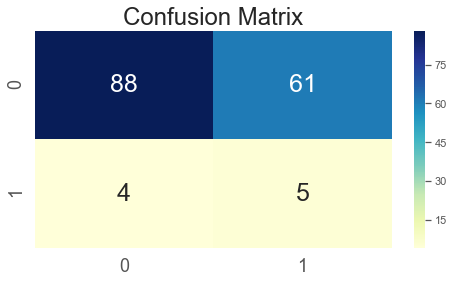

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.589 (0.492)
--> The total of 158 predicted with only 93 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  4
Actual label is False while we predicted False -  True Negatve   =  89
Actual label is False while we predicted True  -  False Positive =  62
Actual label is True while we predicted False  -  False Negative =  3


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.86 % was achieved
--> Sensitity of 0.57 was achieved
--> Specificity of 0.59 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.43 false negative rate was achieved
--> 0.41 false positve rate (fallout) was achieved
--> Negative predictive value of 0.97
--> Recall value 0f 0.57 achieved
--> The precision vaue of 0.06 achieved
--> An Fscore of 0.11 

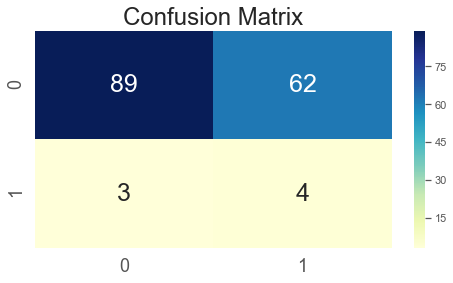

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.589 (0.492)
--> The total of 158 predicted with only 93 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  4
Actual label is False while we predicted False -  True Negatve   =  89
Actual label is False while we predicted True  -  False Positive =  62
Actual label is True while we predicted False  -  False Negative =  3


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.86 % was achieved
--> Sensitity of 0.57 was achieved
--> Specificity of 0.59 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.43 false negative rate was achieved
--> 0.41 false positve rate (fallout) was achieved
--> Negative predictive value of 0.97
--> Recall value 0f 0.57 achieved
--> The precision vaue of 0.06 achieved
--> An Fscore of 0.11 

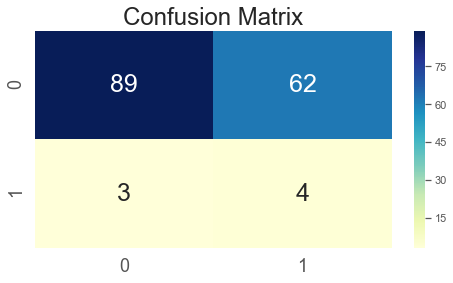

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.589 (0.492)
--> The total of 158 predicted with only 93 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  2
Actual label is False while we predicted False -  True Negatve   =  91
Actual label is False while we predicted True  -  False Positive =  64
Actual label is True while we predicted False  -  False Negative =  1


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.86 % was achieved
--> Sensitity of 0.67 was achieved
--> Specificity of 0.59 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.33 false negative rate was achieved
--> 0.41 false positve rate (fallout) was achieved
--> Negative predictive value of 0.99
--> Recall value 0f 0.67 achieved
--> The precision vaue of 0.03 achieved
--> An Fscore of 0.06 

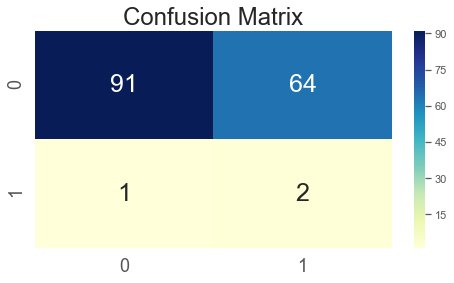

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

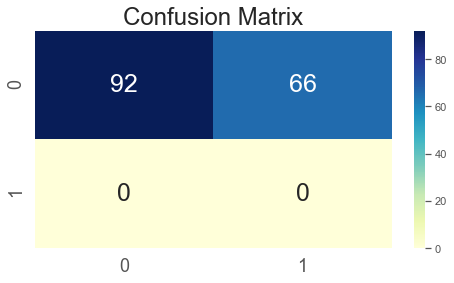

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

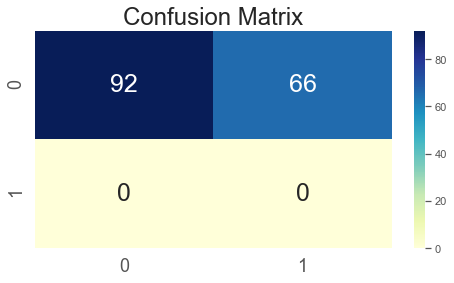

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

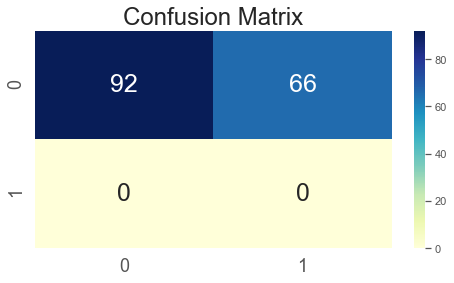

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

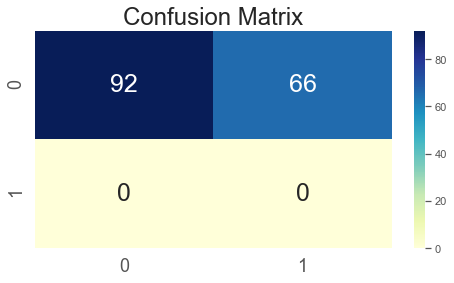

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

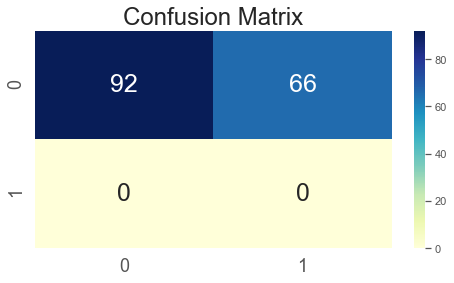

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

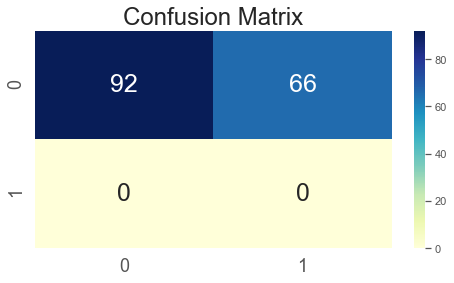

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

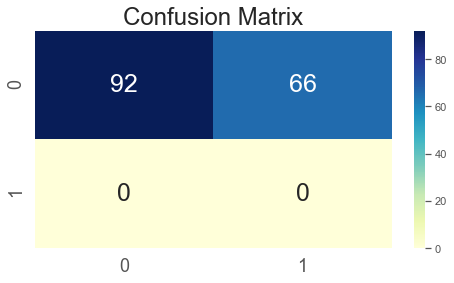

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.589 (0.492)
--> The total of 158 predicted with only 93 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  5
Actual label is False while we predicted False -  True Negatve   =  88
Actual label is False while we predicted True  -  False Positive =  61
Actual label is True while we predicted False  -  False Negative =  4


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.86 % was achieved
--> Sensitity of 0.56 was achieved
--> Specificity of 0.59 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.44 false negative rate was achieved
--> 0.41 false positve rate (fallout) was achieved
--> Negative predictive value of 0.96
--> Recall value 0f 0.56 achieved
--> The precision vaue of 0.08 achieved
--> An Fscore of 0.14 achieved


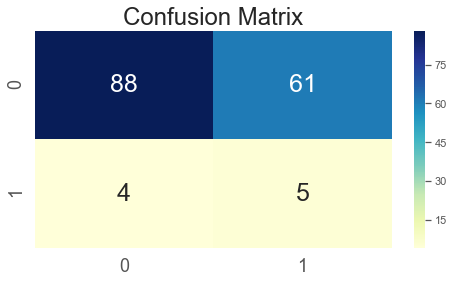

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.614 (0.487)
--> The total of 158 predicted with only 97 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  9
Actual label is False while we predicted False -  True Negatve   =  88
Actual label is False while we predicted True  -  False Positive =  57
Actual label is True while we predicted False  -  False Negative =  4


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 61.39 % was achieved
--> Sensitity of 0.69 was achieved
--> Specificity of 0.61 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.31 false negative rate was achieved
--> 0.39 false positve rate (fallout) was achieved
--> Negative predictive value of 0.96
--> Recall value 0f 0.69 achieved
--> The precision vaue of 0.14 achieved
--> An Fscore of 0.23 

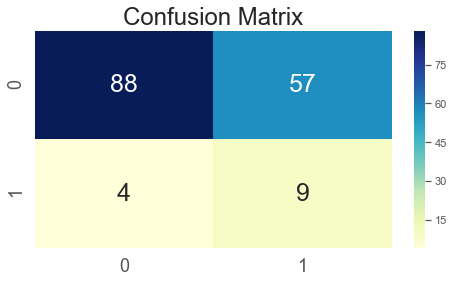

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.620 (0.485)
--> The total of 158 predicted with only 98 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  10
Actual label is False while we predicted False -  True Negatve   =  88
Actual label is False while we predicted True  -  False Positive =  56
Actual label is True while we predicted False  -  False Negative =  4


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 62.03 % was achieved
--> Sensitity of 0.71 was achieved
--> Specificity of 0.61 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.29 false negative rate was achieved
--> 0.39 false positve rate (fallout) was achieved
--> Negative predictive value of 0.96
--> Recall value 0f 0.71 achieved
--> The precision vaue of 0.15 achieved
--> An Fscore of 0.25

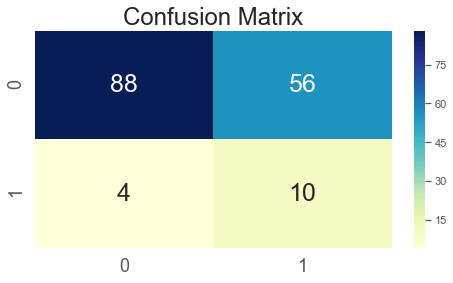

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.608 (0.488)
--> The total of 158 predicted with only 96 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  9
Actual label is False while we predicted False -  True Negatve   =  87
Actual label is False while we predicted True  -  False Positive =  57
Actual label is True while we predicted False  -  False Negative =  5


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 60.76 % was achieved
--> Sensitity of 0.64 was achieved
--> Specificity of 0.6 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.36 false negative rate was achieved
--> 0.4 false positve rate (fallout) was achieved
--> Negative predictive value of 0.95
--> Recall value 0f 0.64 achieved
--> The precision vaue of 0.14 achieved
--> An Fscore of 0.23 ac

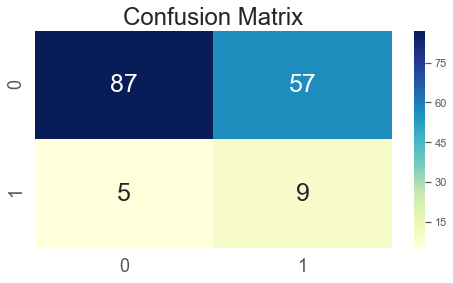

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.589 (0.492)
--> The total of 158 predicted with only 93 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  5
Actual label is False while we predicted False -  True Negatve   =  88
Actual label is False while we predicted True  -  False Positive =  61
Actual label is True while we predicted False  -  False Negative =  4


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.86 % was achieved
--> Sensitity of 0.56 was achieved
--> Specificity of 0.59 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.44 false negative rate was achieved
--> 0.41 false positve rate (fallout) was achieved
--> Negative predictive value of 0.96
--> Recall value 0f 0.56 achieved
--> The precision vaue of 0.08 achieved
--> An Fscore of 0.14 

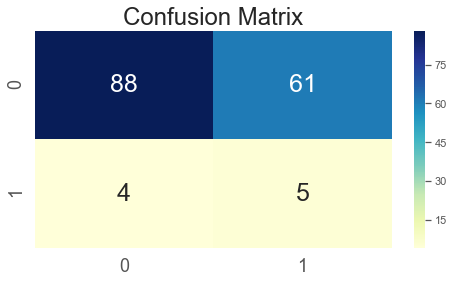

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

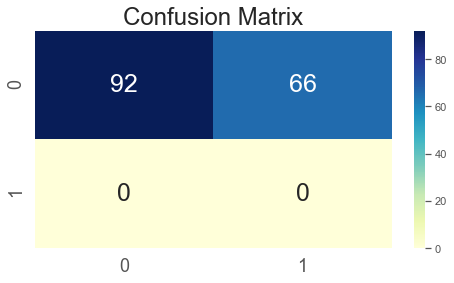

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

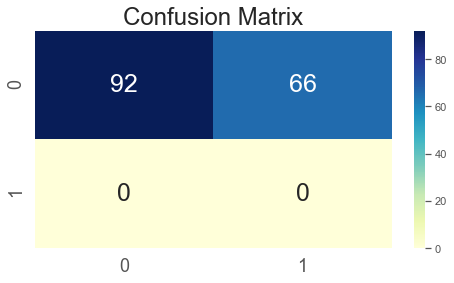

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

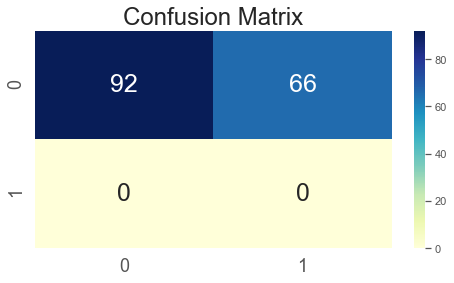

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

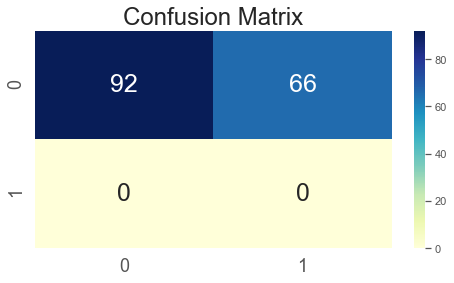

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

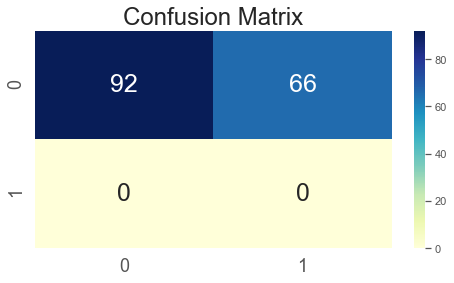

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

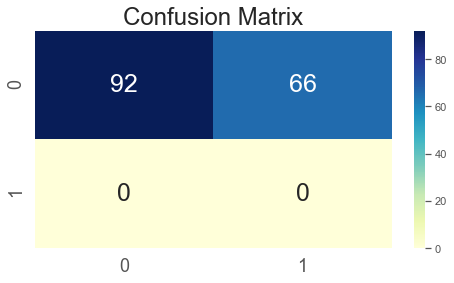

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

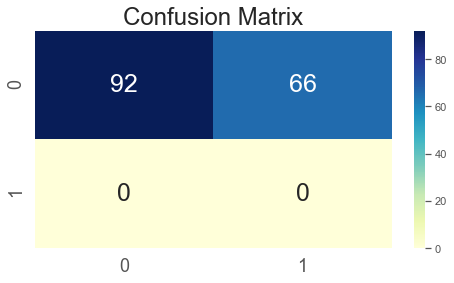

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

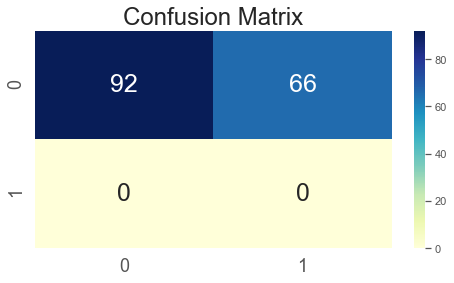

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

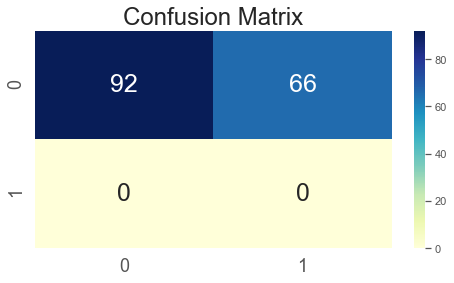

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

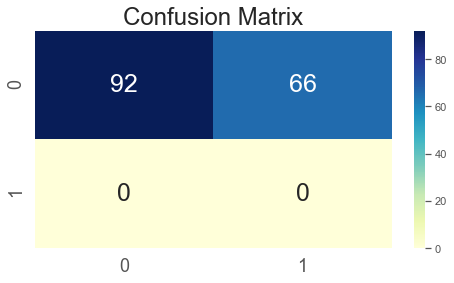

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

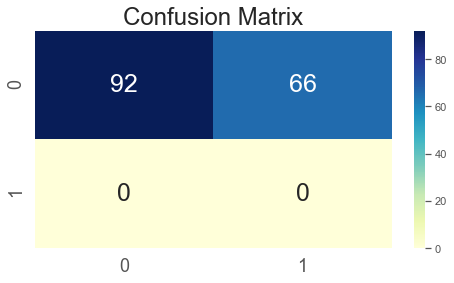

In [45]:
#Fit Cross validation model 
kernel = ['rbf']
OUT_rbf = fitkernelLOOCV(BOW, ytr, kernel, params)

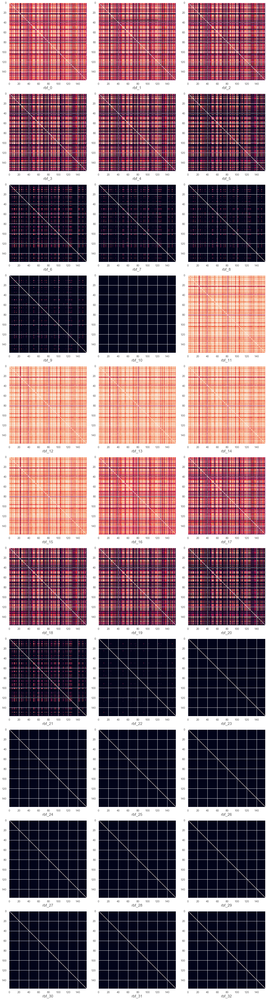

In [46]:
#Analyse performance results
PerfEva_rbf, KerAna_rbf, CVPerf_rbf, CVvalus_rbf  = Analyse_ResultsLOOCV(OUT_rbf)

In [47]:
#Extract performance evaluation
PerfEva_rbf

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
rbf_0,66,92,57.59,0.00,0.58,0.42,0.58,1.00,0.42,0.99,0.00,0.00,0.00
rbf_1,66,92,58.86,0.56,0.59,0.42,0.58,0.44,0.41,0.96,0.56,0.08,0.14
rbf_2,66,92,60.76,0.67,0.60,0.42,0.58,0.33,0.40,0.96,0.67,0.12,0.20
rbf_3,66,92,61.39,0.69,0.61,0.42,0.58,0.31,0.39,0.96,0.69,0.14,0.23
rbf_4,66,92,62.03,0.71,0.61,0.42,0.58,0.29,0.39,0.96,0.71,0.15,0.25
rbf_5,66,92,60.76,0.64,0.60,0.42,0.58,0.36,0.40,0.95,0.64,0.14,0.23
rbf_6,66,92,58.86,0.56,0.59,0.42,0.58,0.44,0.41,0.96,0.56,0.08,0.14
rbf_7,66,92,58.86,0.57,0.59,0.42,0.58,0.43,0.41,0.97,0.57,0.06,0.11
rbf_8,66,92,58.86,0.57,0.59,0.42,0.58,0.43,0.41,0.97,0.57,0.06,0.11
rbf_9,66,92,58.86,0.67,0.59,0.42,0.58,0.33,0.41,0.99,0.67,0.03,0.06


In [48]:
PerfEva_rbf[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
rbf_0,0.00,57.59,0.00,0.58
rbf_1,0.14,58.86,0.56,0.59
rbf_2,0.20,60.76,0.67,0.60
rbf_3,0.23,61.39,0.69,0.61
rbf_4,0.25,62.03,0.71,0.61
rbf_5,0.23,60.76,0.64,0.60
rbf_6,0.14,58.86,0.56,0.59
rbf_7,0.11,58.86,0.57,0.59
rbf_8,0.11,58.86,0.57,0.59
rbf_9,0.06,58.86,0.67,0.59


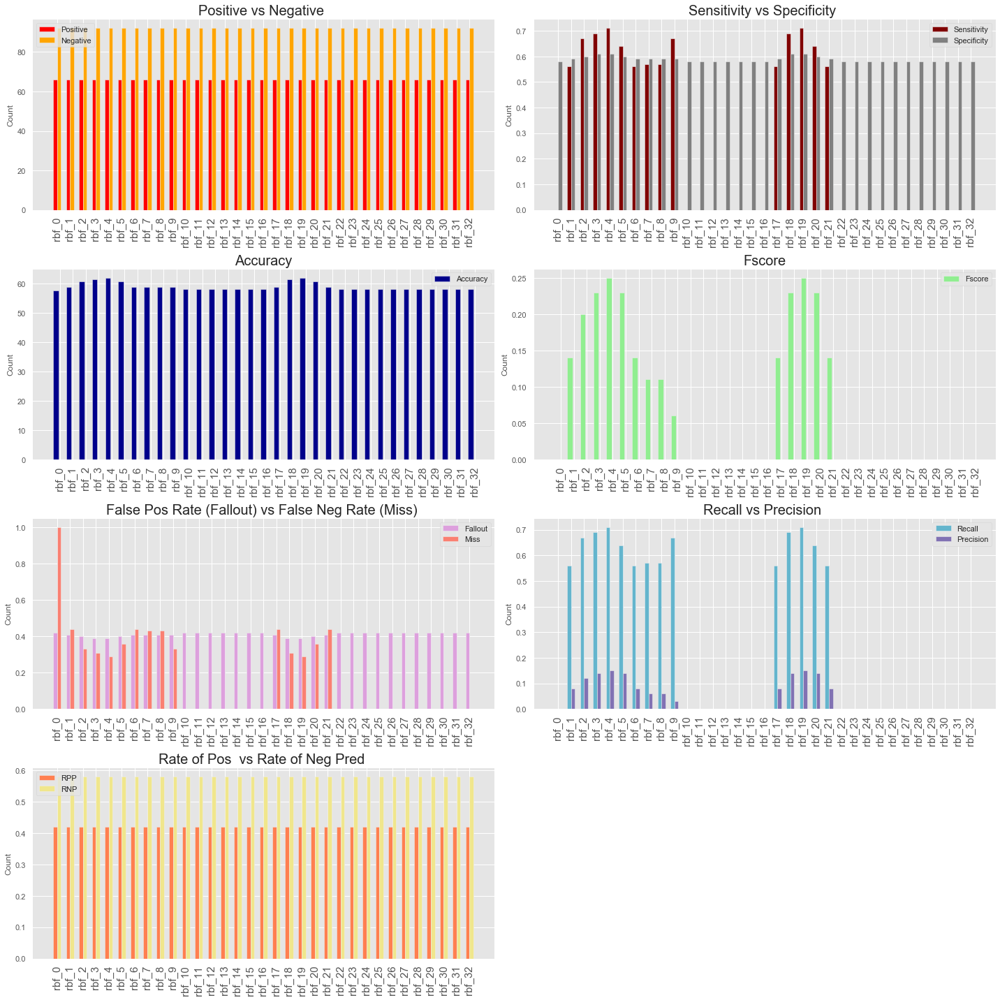

In [49]:
#visualize results
plotResult(PerfEva_rbf)

In [50]:
#Extract best performing parameter
id_rbf = PerfEva_rbf.reset_index().Fscore.argmax()
max_Params_rbf = params[kernel[0]][id_rbf]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_rbf.Fscore[id_rbf]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_rbf.Accu[id_rbf]}')

Best Fscore obtained with rbf kernel   - > 0.25
Best Accuracy obtained with rbf kernel - > 62.03


In [51]:
#Best result showing the specific kernel
BestRes_rbf = pd.DataFrame(PerfEva_rbf.iloc[id_rbf,:]).T
#index with ref to specific kernel removed. 
BestRes_rbf = BestRes_rbf.reset_index().drop(['index'], axis =1)
BestRes_rbf

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,66.0,92.0,62.03,0.71,0.61,0.42,0.58,0.29,0.39,0.96,0.71,0.15,0.25


In [52]:
BestRes_rbf[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.25,62.03,0.71,0.61


In [53]:
#Perf mean score and std
CVPerf_rbf.round(2)

,mean score,std
rbf_0,0.58,0.49
rbf_1,0.59,0.49
rbf_2,0.61,0.49
rbf_3,0.61,0.49
rbf_4,0.62,0.49
rbf_5,0.61,0.49
rbf_6,0.59,0.49
rbf_7,0.59,0.49
rbf_8,0.59,0.49
rbf_9,0.59,0.49


In [54]:
#Extract best score mean/std
Bestscore_rbf = pd.DataFrame(CVPerf_rbf.iloc[id_rbf,:]).T.round(2)
Bestscore_rbf = Bestscore_rbf.reset_index().drop(['index'], axis =1)
Bestscore_rbf

,mean score,std
0,0.62,0.49


In [55]:
#Kernel performance
KerAna_rbf

,train_kernel_time,diag_Dominance,is_PSD
rbf_0,1.87699,False,True
rbf_1,2.04646,False,True
rbf_2,2.09658,False,True
rbf_3,1.8434,False,True
rbf_4,1.90707,False,True
rbf_5,1.85092,False,True
rbf_6,1.81683,False,True
rbf_7,1.88602,False,True
rbf_8,1.98177,False,True
rbf_9,2.01887,False,True


In [56]:
#Extract best score mean/std
BestAnalysis_rbf = pd.DataFrame(KerAna_rbf.iloc[id_rbf,:]).T
BestAnalysis_rbf = BestAnalysis_rbf.reset_index().drop(['index'], axis =1)
BestAnalysis_rbf

,train_kernel_time,diag_Dominance,is_PSD
0,1.90707,False,True


## eRBF Kernel

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

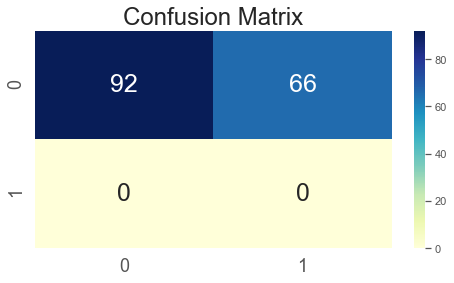

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

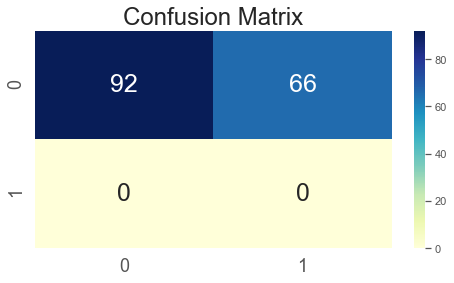

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

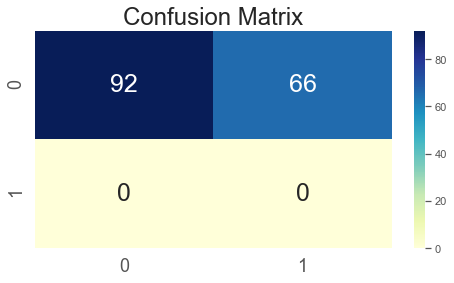

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

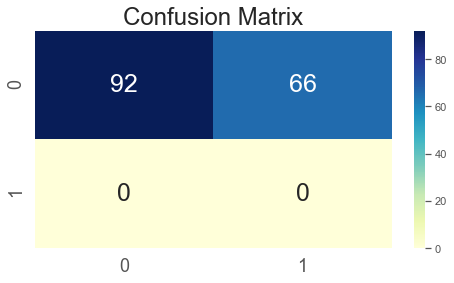

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

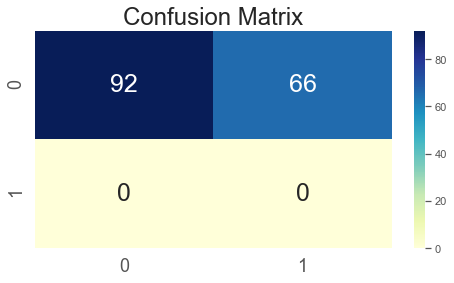

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

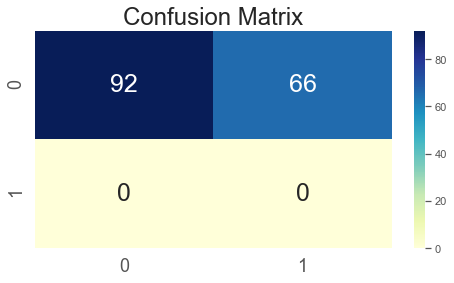

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

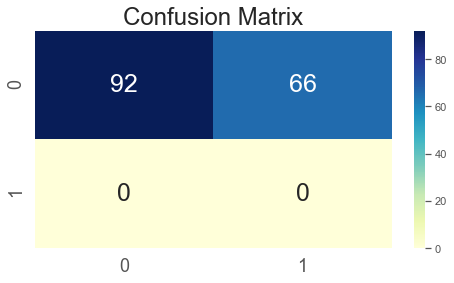

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

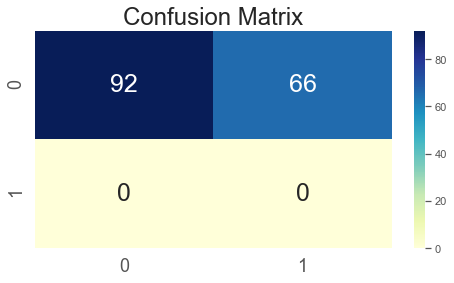

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

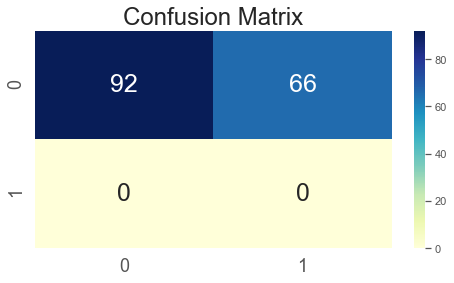

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

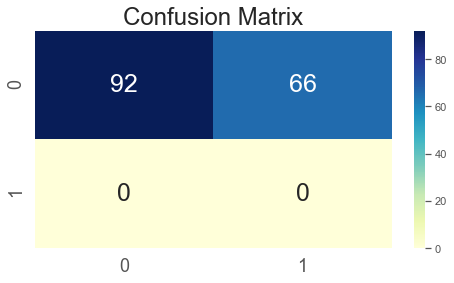

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

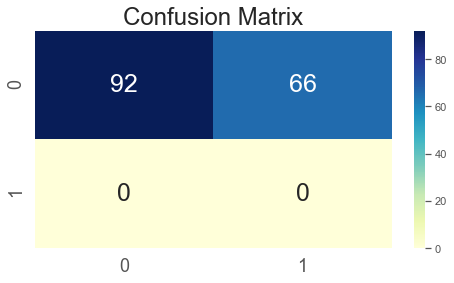

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

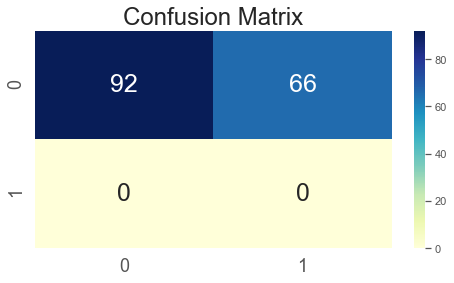

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

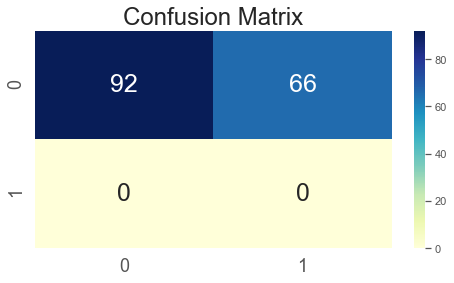

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

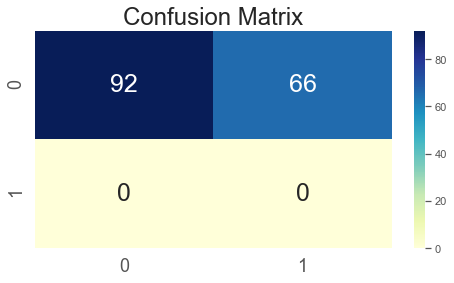

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

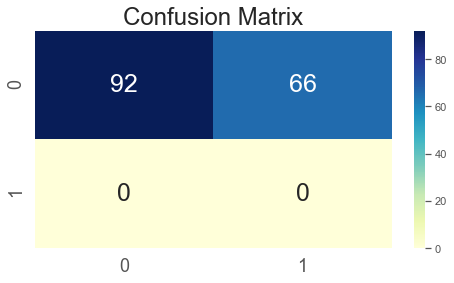

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

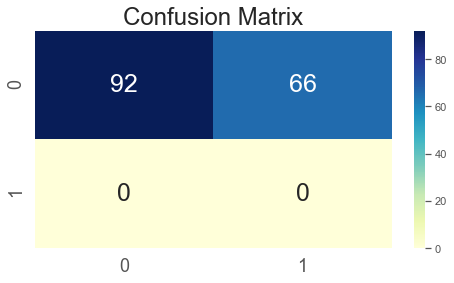

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

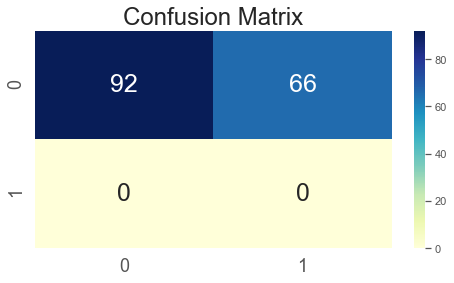

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

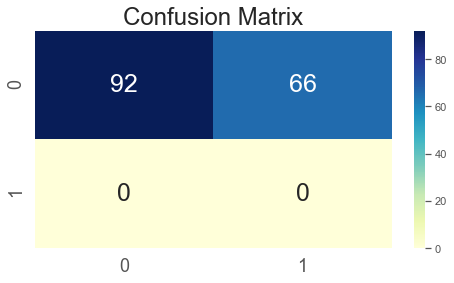

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

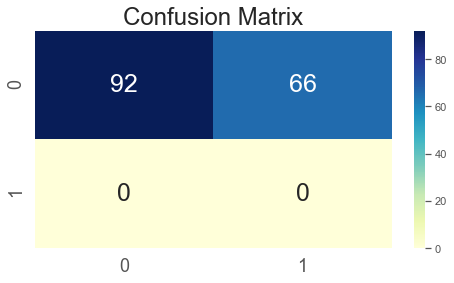

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

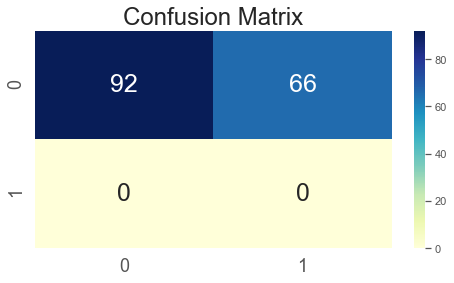

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

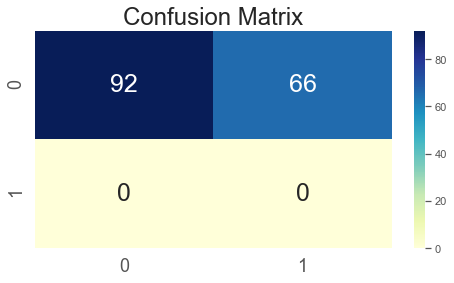

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

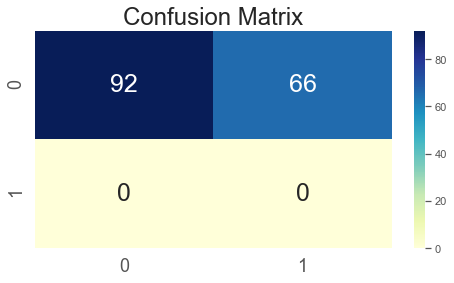

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

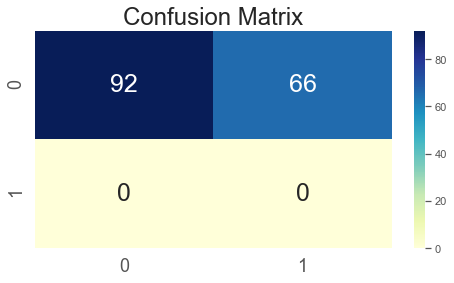

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

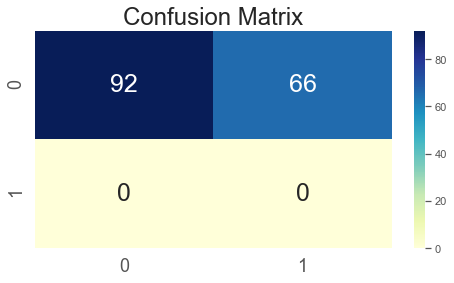

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

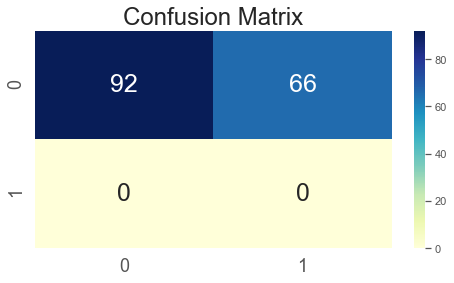

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.576 (0.494)
--> The total of 158 predicted with only 91 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  1
Actual label is False while we predicted False -  True Negatve   =  90
Actual label is False while we predicted True  -  False Positive =  65
Actual label is True while we predicted False  -  False Negative =  2


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 57.59 % was achieved
--> Sensitity of 0.33 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.67 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achieved
--> Negative predictive value of 0.98
--> Recall value 0f 0.33 achieved
--> The precision vaue of 0.02 achieved
--> An Fscore of 0.04 

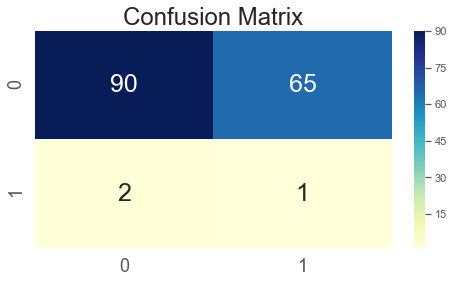

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.589 (0.492)
--> The total of 158 predicted with only 93 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  4
Actual label is False while we predicted False -  True Negatve   =  89
Actual label is False while we predicted True  -  False Positive =  62
Actual label is True while we predicted False  -  False Negative =  3


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.86 % was achieved
--> Sensitity of 0.57 was achieved
--> Specificity of 0.59 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.43 false negative rate was achieved
--> 0.41 false positve rate (fallout) was achieved
--> Negative predictive value of 0.97
--> Recall value 0f 0.57 achieved
--> The precision vaue of 0.06 achieved
--> An Fscore of 0.11 

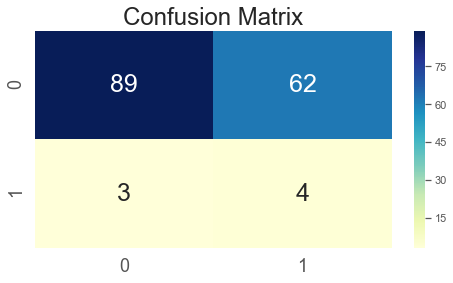

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.608 (0.488)
--> The total of 158 predicted with only 96 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  8
Actual label is False while we predicted False -  True Negatve   =  88
Actual label is False while we predicted True  -  False Positive =  58
Actual label is True while we predicted False  -  False Negative =  4


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 60.76 % was achieved
--> Sensitity of 0.67 was achieved
--> Specificity of 0.6 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.33 false negative rate was achieved
--> 0.4 false positve rate (fallout) was achieved
--> Negative predictive value of 0.96
--> Recall value 0f 0.67 achieved
--> The precision vaue of 0.12 achieved
--> An Fscore of 0.2 ach

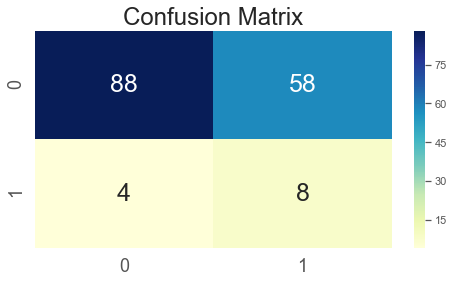

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.576 (0.494)
--> The total of 158 predicted with only 91 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  2
Actual label is False while we predicted False -  True Negatve   =  89
Actual label is False while we predicted True  -  False Positive =  64
Actual label is True while we predicted False  -  False Negative =  3


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 57.59 % was achieved
--> Sensitity of 0.4 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.6 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achieved
--> Negative predictive value of 0.97
--> Recall value 0f 0.4 achieved
--> The precision vaue of 0.03 achieved
--> An Fscore of 0.06 achieved


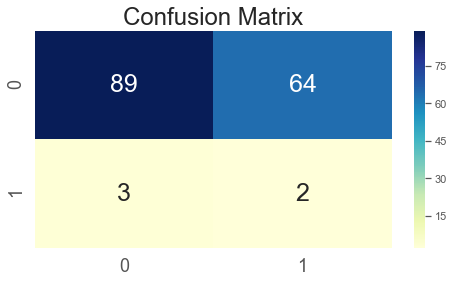

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

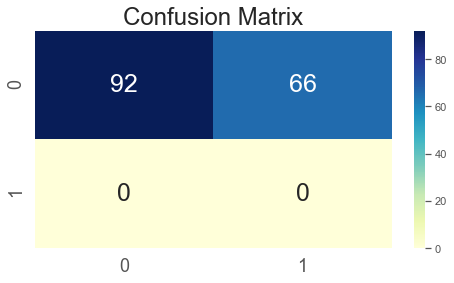

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

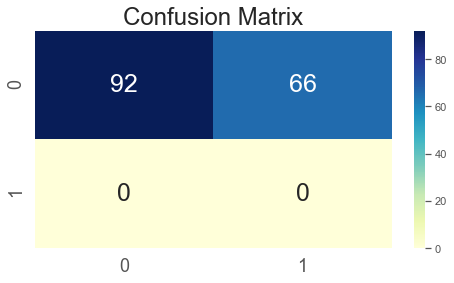

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

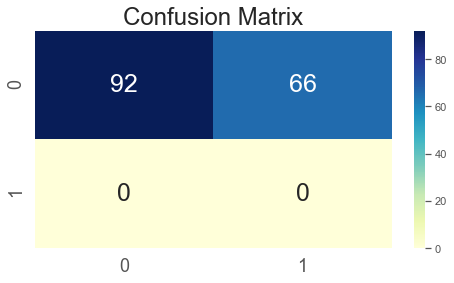

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

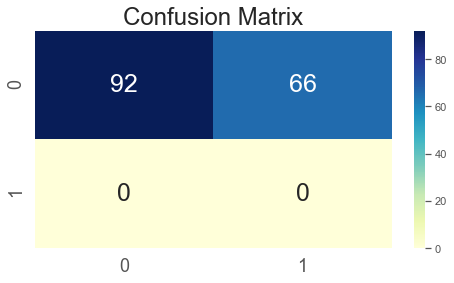

In [57]:
#Fit Cross validation model 
kernel = ['erbf']
OUT_erbf = fitkernelLOOCV(BOW, ytr, kernel, params)

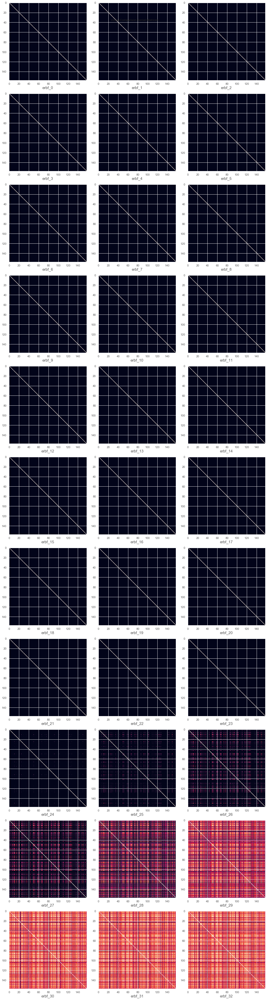

In [58]:
#Analyse performance results
PerfEva_erbf, KerAna_erbf, CVPerf_erbf, CVvalus_erbf  = Analyse_ResultsLOOCV(OUT_erbf)

In [59]:
#Extract performance evaluation
PerfEva_erbf

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
erbf_0,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00
erbf_1,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00
erbf_2,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00
erbf_3,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00
erbf_4,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00
erbf_5,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00
erbf_6,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00
erbf_7,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00
erbf_8,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00
erbf_9,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00


In [60]:
PerfEva_erbf[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
erbf_0,0.00,58.23,0.00,0.58
erbf_1,0.00,58.23,0.00,0.58
erbf_2,0.00,58.23,0.00,0.58
erbf_3,0.00,58.23,0.00,0.58
erbf_4,0.00,58.23,0.00,0.58
erbf_5,0.00,58.23,0.00,0.58
erbf_6,0.00,58.23,0.00,0.58
erbf_7,0.00,58.23,0.00,0.58
erbf_8,0.00,58.23,0.00,0.58
erbf_9,0.00,58.23,0.00,0.58


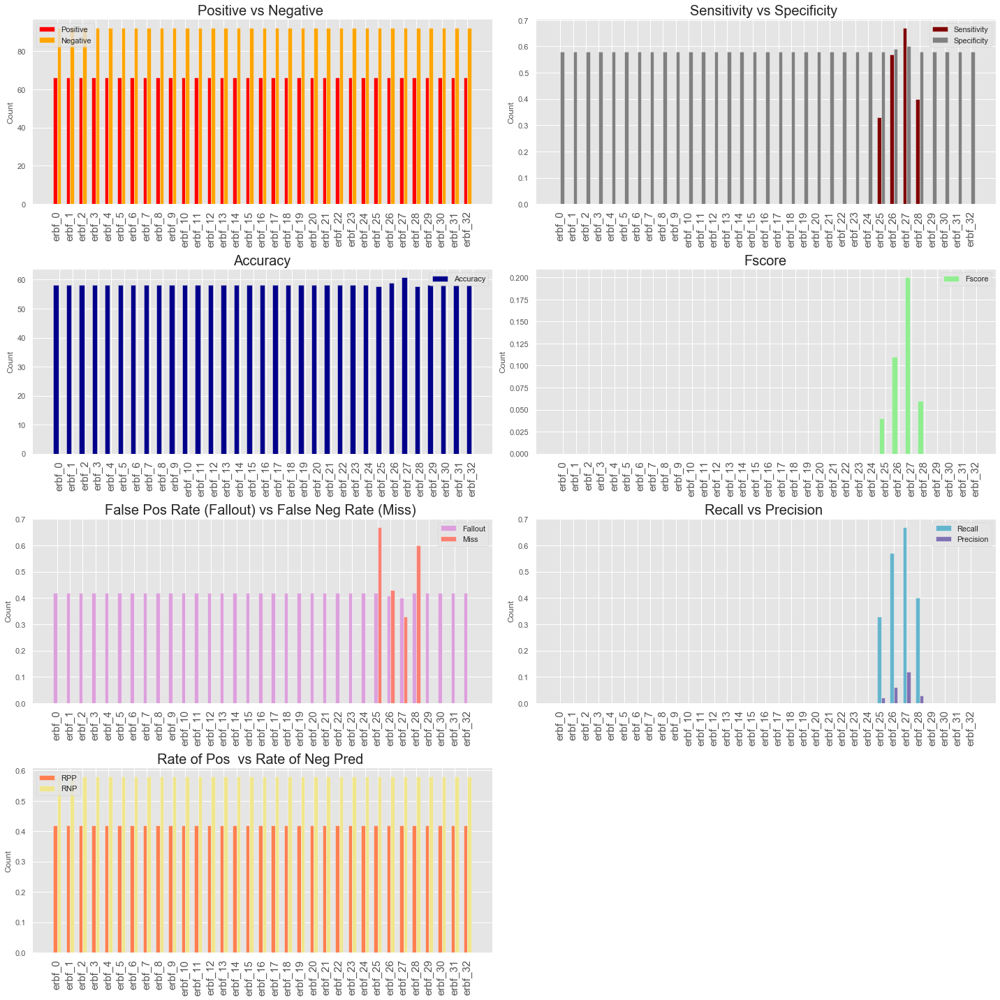

In [61]:
#visualize results
plotResult(PerfEva_erbf)

In [62]:
#Extract best performing parameter
id_erbf = PerfEva_erbf.reset_index().Fscore.argmax()
max_Params_erbf = params[kernel[0]][id_erbf]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_erbf.Fscore[id_erbf]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_erbf.Accu[id_erbf]}')

Best Fscore obtained with erbf kernel   - > 0.2
Best Accuracy obtained with erbf kernel - > 60.76


In [63]:
#Best result showing the specific kernel
BestRes_erbf = pd.DataFrame(PerfEva_erbf.iloc[id_erbf,:]).T
#index with ref to specific kernel removed. 
BestRes_erbf = BestRes_erbf.reset_index().drop(['index'], axis =1)
BestRes_erbf

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,66.0,92.0,60.76,0.67,0.6,0.42,0.58,0.33,0.4,0.96,0.67,0.12,0.2


In [64]:
BestRes_erbf[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.2,60.76,0.67,0.6


In [65]:
#Perf mean score and std
CVPerf_erbf.round(2)

,mean score,std
erbf_0,0.58,0.49
erbf_1,0.58,0.49
erbf_2,0.58,0.49
erbf_3,0.58,0.49
erbf_4,0.58,0.49
erbf_5,0.58,0.49
erbf_6,0.58,0.49
erbf_7,0.58,0.49
erbf_8,0.58,0.49
erbf_9,0.58,0.49


In [66]:
#Extract best score mean/std
Bestscore_erbf = pd.DataFrame(CVPerf_erbf.iloc[id_erbf,:]).T.round(2)
Bestscore_erbf = Bestscore_erbf.reset_index().drop(['index'], axis =1)
Bestscore_erbf

,mean score,std
0,0.61,0.49


In [67]:
#Kernel performance
KerAna_erbf

,train_kernel_time,diag_Dominance,is_PSD
erbf_0,2.01586,False,True
erbf_1,2.03892,False,True
erbf_2,2.069,False,True
erbf_3,2.1793,False,True
erbf_4,2.08354,False,True
erbf_5,2.12315,False,True
erbf_6,2.25349,False,True
erbf_7,1.99031,False,True
erbf_8,1.94267,False,True
erbf_9,2.13769,False,True


In [68]:
#Extract best score mean/std
BestAnalysis_erbf = pd.DataFrame(KerAna_erbf.iloc[id_erbf,:]).T
BestAnalysis_erbf = BestAnalysis_erbf.reset_index().drop(['index'], axis =1)
BestAnalysis_erbf

,train_kernel_time,diag_Dominance,is_PSD
0,2.11162,False,True


## Laplace Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


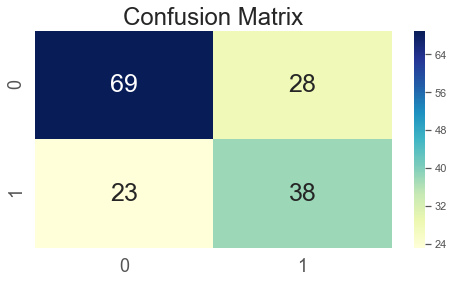

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


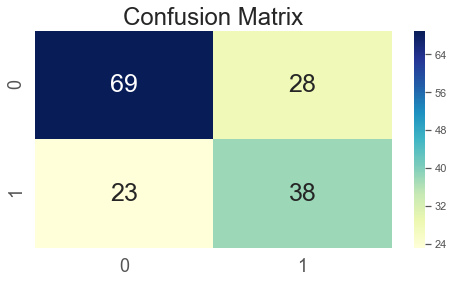

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


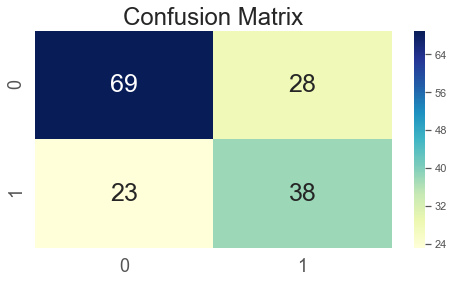

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


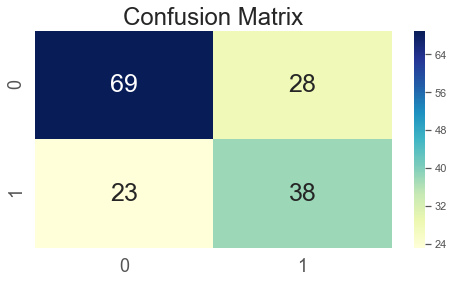

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


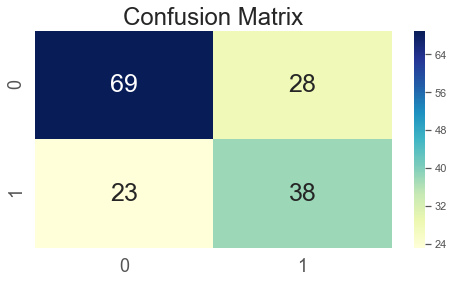

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


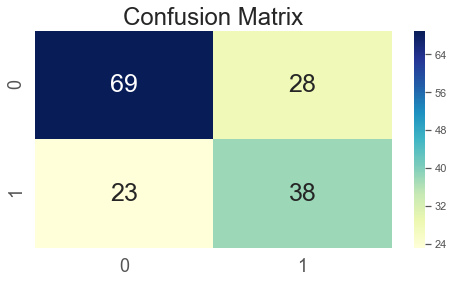

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


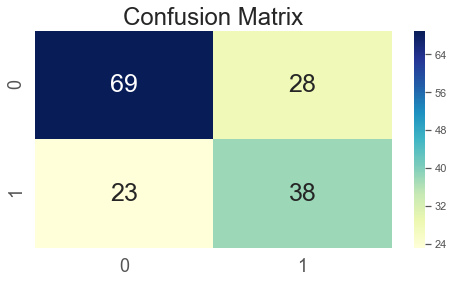

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


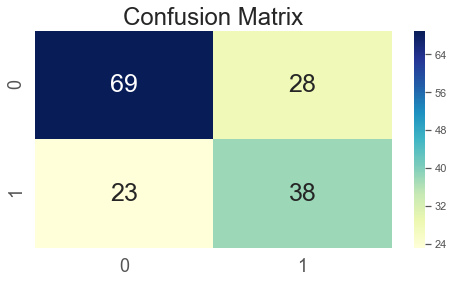

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


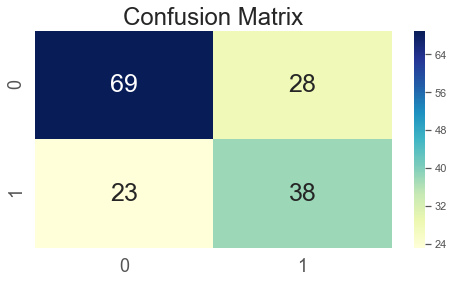

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


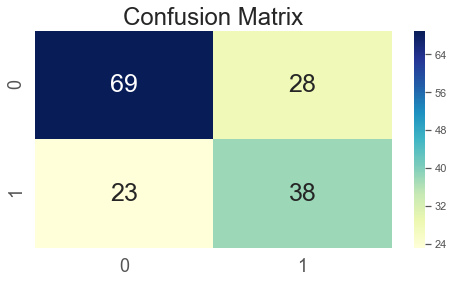

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


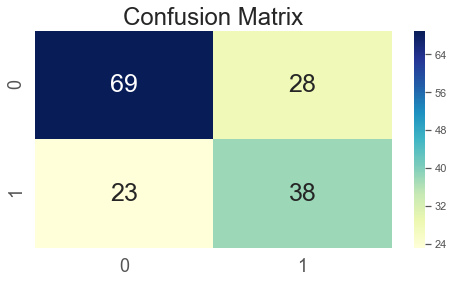

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


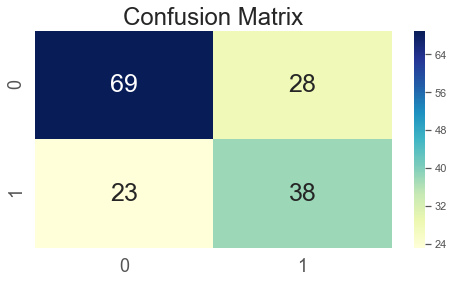

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


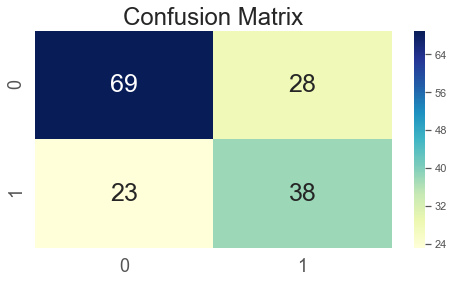

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


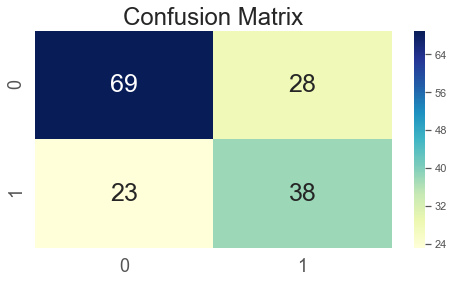

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


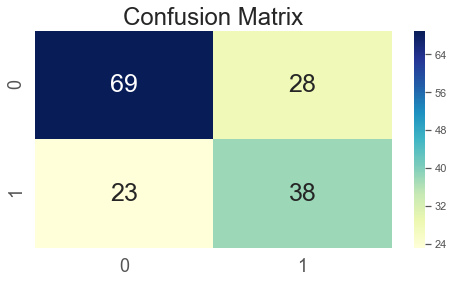

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


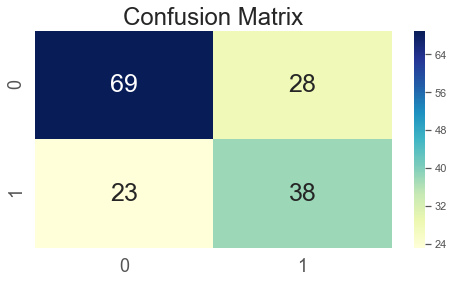

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


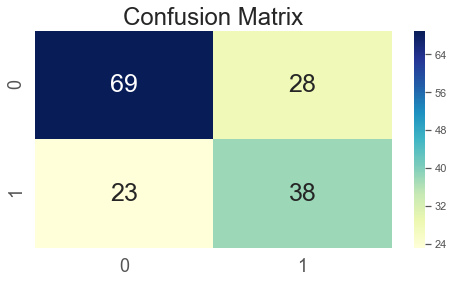

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


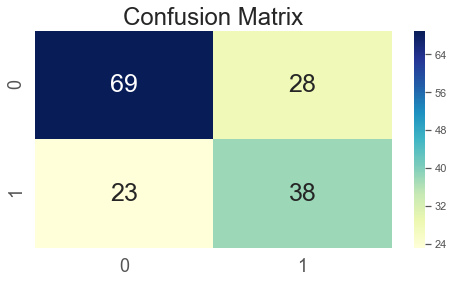

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


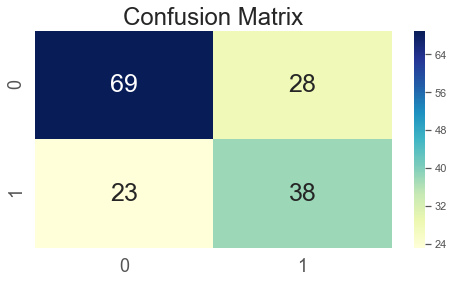

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


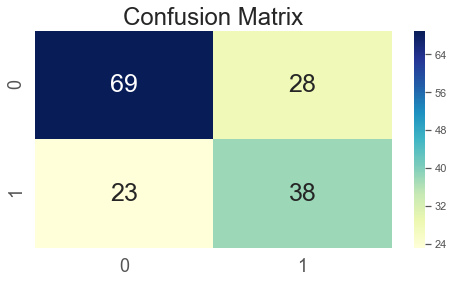

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


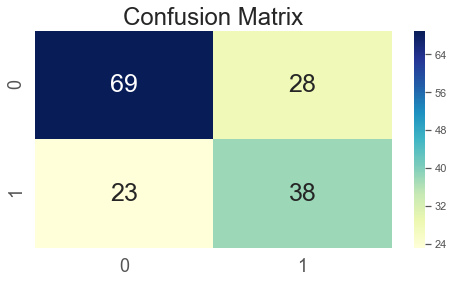

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


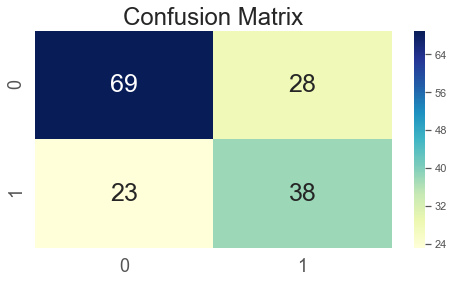

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


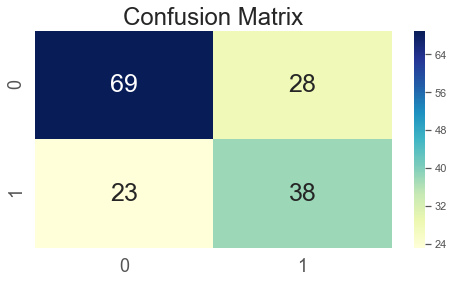

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


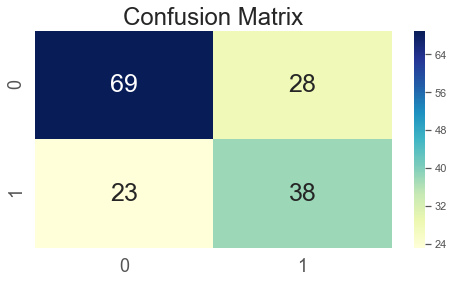

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.696 (0.460)
--> The total of 158 predicted with only 110 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  70
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  22


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 69.62 % was achieved
--> Sensitity of 0.65 was achieved
--> Specificity of 0.73 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.35 false negative rate was achieved
--> 0.27 false positve rate (fallout) was achieved
--> Negative predictive value of 0.76
--> Recall value 0f 0.65 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.63 achieved


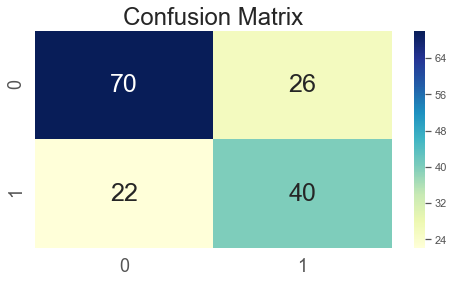

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  39
Actual label is False while we predicted False -  True Negatve   =  68
Actual label is False while we predicted True  -  False Positive =  27
Actual label is True while we predicted False  -  False Negative =  24


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.74
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.59 achieved
--> An Fscore of 0.6 achieved


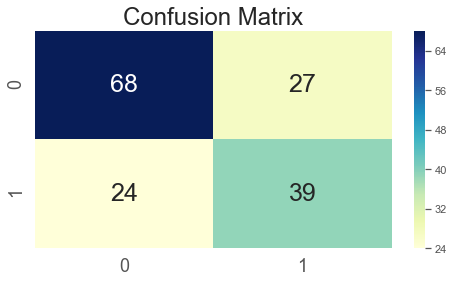

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.684 (0.465)
--> The total of 158 predicted with only 108 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  39
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  27
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 68.35 % was achieved
--> Sensitity of 0.63 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.37 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.63 achieved
--> The precision vaue of 0.59 achieved
--> An Fscore of 0.61 achieved


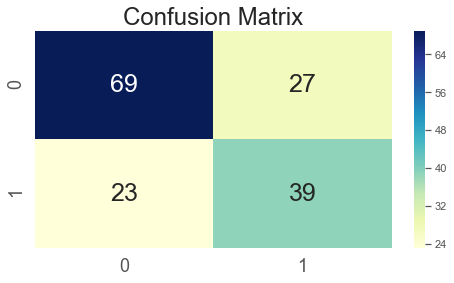

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.690 (0.463)
--> The total of 158 predicted with only 109 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  39
Actual label is False while we predicted False -  True Negatve   =  70
Actual label is False while we predicted True  -  False Positive =  27
Actual label is True while we predicted False  -  False Negative =  22


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 68.99 % was achieved
--> Sensitity of 0.64 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.36 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.76
--> Recall value 0f 0.64 achieved
--> The precision vaue of 0.59 achieved
--> An Fscore of 0.61 achieved


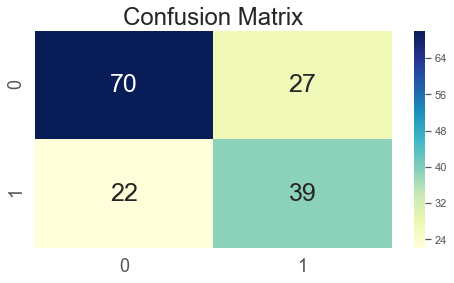

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.696 (0.460)
--> The total of 158 predicted with only 110 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  41
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  25
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 69.62 % was achieved
--> Sensitity of 0.64 was achieved
--> Specificity of 0.73 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.36 false negative rate was achieved
--> 0.27 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.64 achieved
--> The precision vaue of 0.62 achieved
--> An Fscore of 0.63 achieved


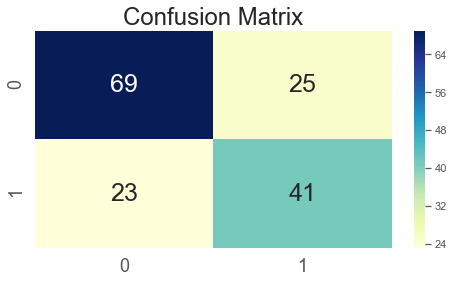

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.684 (0.465)
--> The total of 158 predicted with only 108 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  41
Actual label is False while we predicted False -  True Negatve   =  67
Actual label is False while we predicted True  -  False Positive =  25
Actual label is True while we predicted False  -  False Negative =  25


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 68.35 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.73 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.27 false positve rate (fallout) was achieved
--> Negative predictive value of 0.73
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.62 achieved
--> An Fscore of 0.62 achieved


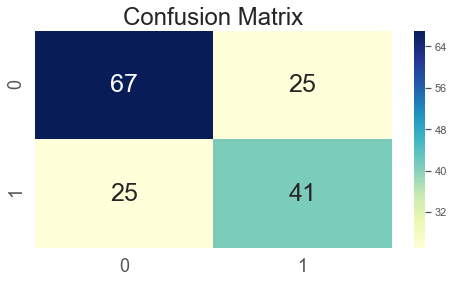

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.703 (0.457)
--> The total of 158 predicted with only 111 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  41
Actual label is False while we predicted False -  True Negatve   =  70
Actual label is False while we predicted True  -  False Positive =  25
Actual label is True while we predicted False  -  False Negative =  22


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 70.25 % was achieved
--> Sensitity of 0.65 was achieved
--> Specificity of 0.74 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.35 false negative rate was achieved
--> 0.26 false positve rate (fallout) was achieved
--> Negative predictive value of 0.76
--> Recall value 0f 0.65 achieved
--> The precision vaue of 0.62 achieved
--> An Fscore of 0.63 achieved


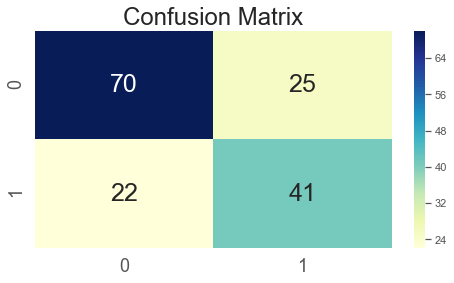

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.589 (0.492)
--> The total of 158 predicted with only 93 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  18
Actual label is False while we predicted False -  True Negatve   =  75
Actual label is False while we predicted True  -  False Positive =  48
Actual label is True while we predicted False  -  False Negative =  17


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.86 % was achieved
--> Sensitity of 0.51 was achieved
--> Specificity of 0.61 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.49 false negative rate was achieved
--> 0.39 false positve rate (fallout) was achieved
--> Negative predictive value of 0.82
--> Recall value 0f 0.51 achieved
--> The precision vaue of 0.27 achieved
--> An Fscore of 0.35 achieved


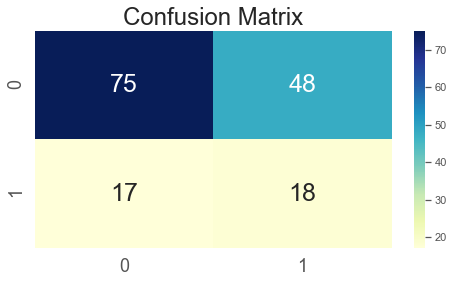

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

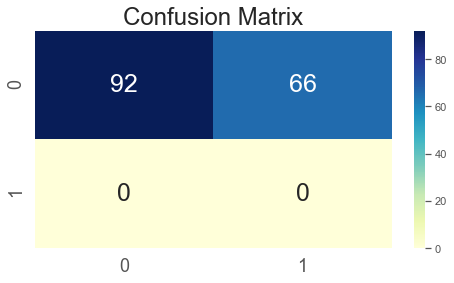

In [69]:
#Fit Cross validation model 
kernel = ['laplace']
OUT_laplace = fitkernelLOOCV(BOW, ytr, kernel, params)

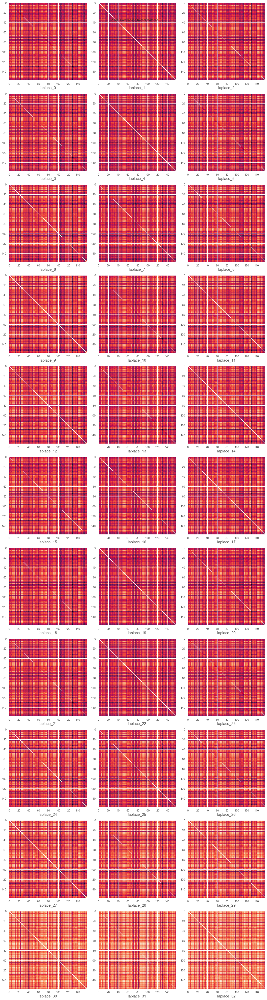

In [70]:
#Analyse performance results
PerfEva_laplace, KerAna_laplace, CVPerf_laplace, CVvalus_laplace  = Analyse_ResultsLOOCV(OUT_laplace)

In [71]:
#Extract performance evaluation
PerfEva_laplace

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
laplace_0,66,92,67.72,0.62,0.71,0.42,0.58,0.38,0.29,0.75,0.62,0.58,0.60
laplace_1,66,92,67.72,0.62,0.71,0.42,0.58,0.38,0.29,0.75,0.62,0.58,0.60
laplace_2,66,92,67.72,0.62,0.71,0.42,0.58,0.38,0.29,0.75,0.62,0.58,0.60
laplace_3,66,92,67.72,0.62,0.71,0.42,0.58,0.38,0.29,0.75,0.62,0.58,0.60
laplace_4,66,92,67.72,0.62,0.71,0.42,0.58,0.38,0.29,0.75,0.62,0.58,0.60
laplace_5,66,92,67.72,0.62,0.71,0.42,0.58,0.38,0.29,0.75,0.62,0.58,0.60
laplace_6,66,92,67.72,0.62,0.71,0.42,0.58,0.38,0.29,0.75,0.62,0.58,0.60
laplace_7,66,92,67.72,0.62,0.71,0.42,0.58,0.38,0.29,0.75,0.62,0.58,0.60
laplace_8,66,92,67.72,0.62,0.71,0.42,0.58,0.38,0.29,0.75,0.62,0.58,0.60
laplace_9,66,92,67.72,0.62,0.71,0.42,0.58,0.38,0.29,0.75,0.62,0.58,0.60


In [72]:
PerfEva_laplace[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
laplace_0,0.60,67.72,0.62,0.71
laplace_1,0.60,67.72,0.62,0.71
laplace_2,0.60,67.72,0.62,0.71
laplace_3,0.60,67.72,0.62,0.71
laplace_4,0.60,67.72,0.62,0.71
laplace_5,0.60,67.72,0.62,0.71
laplace_6,0.60,67.72,0.62,0.71
laplace_7,0.60,67.72,0.62,0.71
laplace_8,0.60,67.72,0.62,0.71
laplace_9,0.60,67.72,0.62,0.71


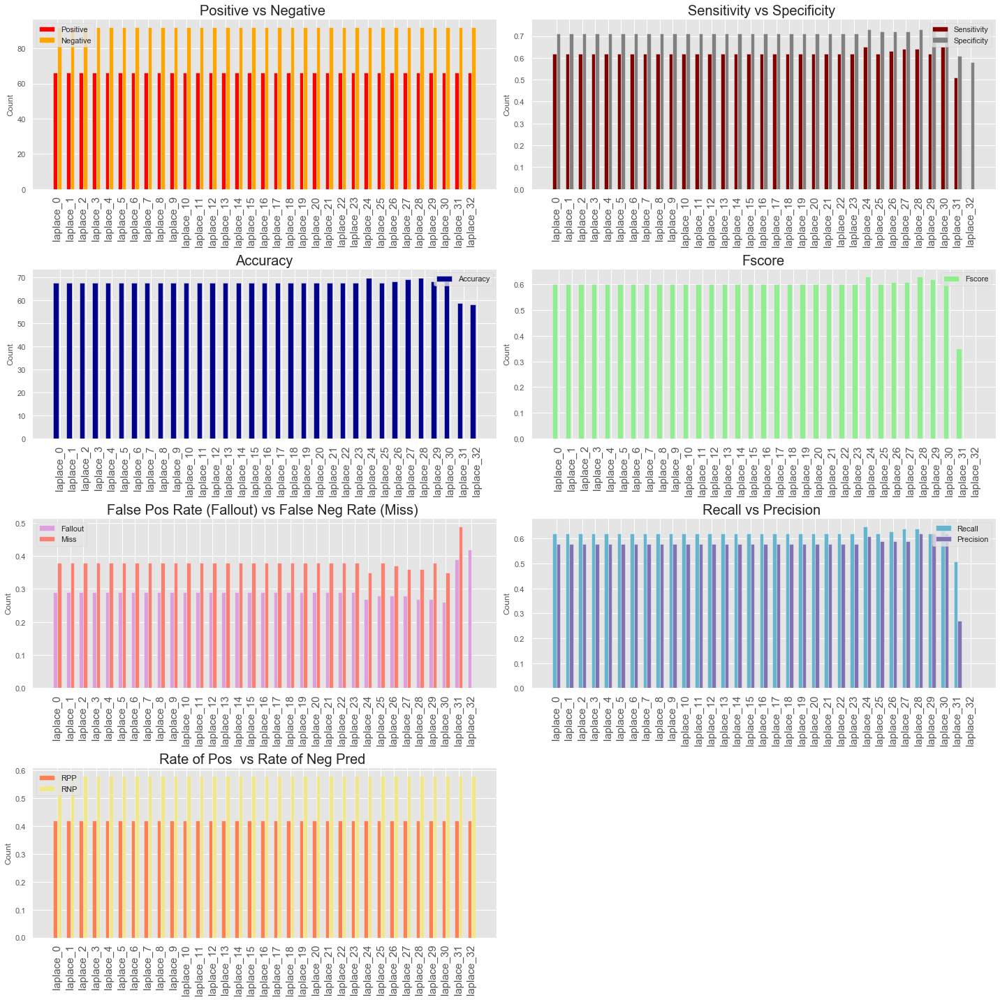

In [73]:
#visualize results
plotResult(PerfEva_laplace)

In [74]:
#Extract best performing parameter
id_laplace = PerfEva_laplace.reset_index().Fscore.argmax()
max_Params_laplace = params[kernel[0]][id_laplace]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_laplace.Fscore[id_laplace]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_laplace.Accu[id_laplace]}')

Best Fscore obtained with laplace kernel   - > 0.63
Best Accuracy obtained with laplace kernel - > 69.62


In [75]:
#Best result showing the specific kernel
BestRes_laplace = pd.DataFrame(PerfEva_laplace.iloc[id_laplace,:]).T
#index with ref to specific kernel removed. 
BestRes_laplace = BestRes_laplace.reset_index().drop(['index'], axis =1)
BestRes_laplace

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,66.0,92.0,69.62,0.65,0.73,0.42,0.58,0.35,0.27,0.76,0.65,0.61,0.63


In [76]:
BestRes_laplace[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.63,69.62,0.65,0.73


In [77]:
#Perf mean score and std
CVPerf_laplace.round(2)

,mean score,std
laplace_0,0.68,0.47
laplace_1,0.68,0.47
laplace_2,0.68,0.47
laplace_3,0.68,0.47
laplace_4,0.68,0.47
laplace_5,0.68,0.47
laplace_6,0.68,0.47
laplace_7,0.68,0.47
laplace_8,0.68,0.47
laplace_9,0.68,0.47


In [78]:
#Extract best score mean/std
Bestscore_laplace = pd.DataFrame(CVPerf_laplace.iloc[id_laplace,:]).T.round(2)
Bestscore_laplace = Bestscore_laplace.reset_index().drop(['index'], axis =1)
Bestscore_laplace

,mean score,std
0,0.7,0.46


In [79]:
#Kernel performance
KerAna_laplace

,train_kernel_time,diag_Dominance,is_PSD
laplace_0,2.49564,False,True
laplace_1,2.56282,False,True
laplace_2,2.61447,False,True
laplace_3,2.43247,False,True
laplace_4,2.47508,False,True
laplace_5,2.48912,False,True
laplace_6,2.49865,False,True
laplace_7,2.43999,False,True
laplace_8,2.45403,False,True
laplace_9,2.38836,False,True


In [80]:
#Extract best score mean/std
BestAnalysis_laplace = pd.DataFrame(KerAna_laplace.iloc[id_laplace,:]).T
BestAnalysis_laplace = BestAnalysis_laplace.reset_index().drop(['index'], axis =1)
BestAnalysis_laplace

,train_kernel_time,diag_Dominance,is_PSD
0,2.43598,False,True


## Compare Results from all Kernels

In [81]:
#Combine all result dataFrames
framesAll = [BestRes_linear,BestRes_rbf,BestRes_erbf, BestRes_poly,BestRes_H_poly,BestRes_laplace]
All_Res_df = pd.concat(framesAll)
All_Res_df.index = ['linear','rbf','erbf','poly','H_poly','laplace']
All_Res_df

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
linear,66.0,92.0,56.96,0.49,0.64,0.42,0.58,0.51,0.36,0.60,0.49,0.53,0.51
rbf,66.0,92.0,62.03,0.71,0.61,0.42,0.58,0.29,0.39,0.96,0.71,0.15,0.25
erbf,66.0,92.0,60.76,0.67,0.60,0.42,0.58,0.33,0.40,0.96,0.67,0.12,0.20
poly,66.0,92.0,62.03,0.53,0.74,0.42,0.58,0.47,0.26,0.53,0.53,0.74,0.62
H_poly,66.0,92.0,62.03,0.53,0.74,0.42,0.58,0.47,0.26,0.53,0.53,0.74,0.62
laplace,66.0,92.0,69.62,0.65,0.73,0.42,0.58,0.35,0.27,0.76,0.65,0.61,0.63


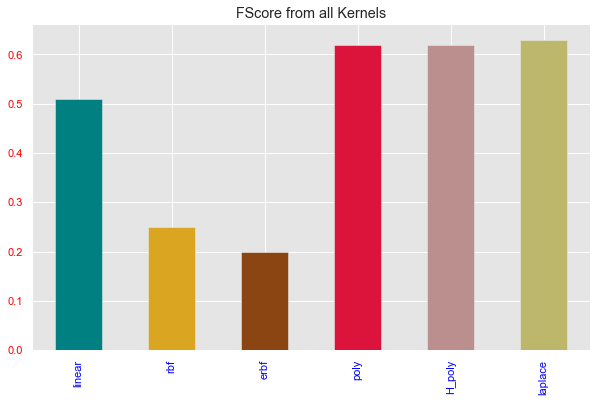

In [82]:
#Set tick colors:
#ax = plt.gca()
fig, ax = plt.subplots()
fig.set_size_inches(10, 6)

ax.tick_params(axis='x', colors='blue')
ax.tick_params(axis='y', colors='red')
c = ['teal', 'goldenrod', 'saddlebrown','crimson','rosybrown','darkkhaki']
All_Res_df.Fscore.plot(kind='bar', color=c);
plt.title('FScore from all Kernels');

In [83]:
#Extract and print the kernel with the best F1 Score
idc   = All_Res_df.reset_index().Fscore.argmax()
score = All_Res_df.Fscore.max()
print(f'{All_Res_df.index[idc]} Kernel had the best F1 Score of {score}')

laplace Kernel had the best F1 Score of 0.63


In [84]:
#Cut down dataframe 
All_Res_df[['Fscore', 'Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
linear,0.51,56.96,0.49,0.64
rbf,0.25,62.03,0.71,0.61
erbf,0.20,60.76,0.67,0.60
poly,0.62,62.03,0.53,0.74
H_poly,0.62,62.03,0.53,0.74
laplace,0.63,69.62,0.65,0.73


# LOOCV - On Binary Bag-Of-Words features

## Linear Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


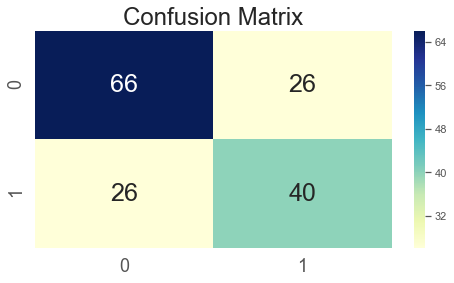

In [85]:
#Fit Cross validation model 
kernel = ['linear']
OUT_linear_b = fitkernelLOOCV(BIN, ytr, kernel, params)

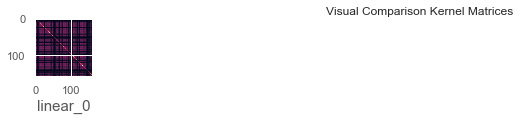

In [86]:
#Analyse performance results
PerfEva_linear_b, KerAna_linear_b, CVPerf_linear_b, CVvalus_linear_b  = Analyse_ResultsLOOCV(OUT_linear_b)

In [87]:
#Extract performance evaluation
PerfEva_linear_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
linear_0,66,92,67.09,0.61,0.72,0.42,0.58,0.39,0.28,0.72,0.61,0.61,0.61


In [88]:
PerfEva_linear_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
linear_0,0.61,67.09,0.61,0.72


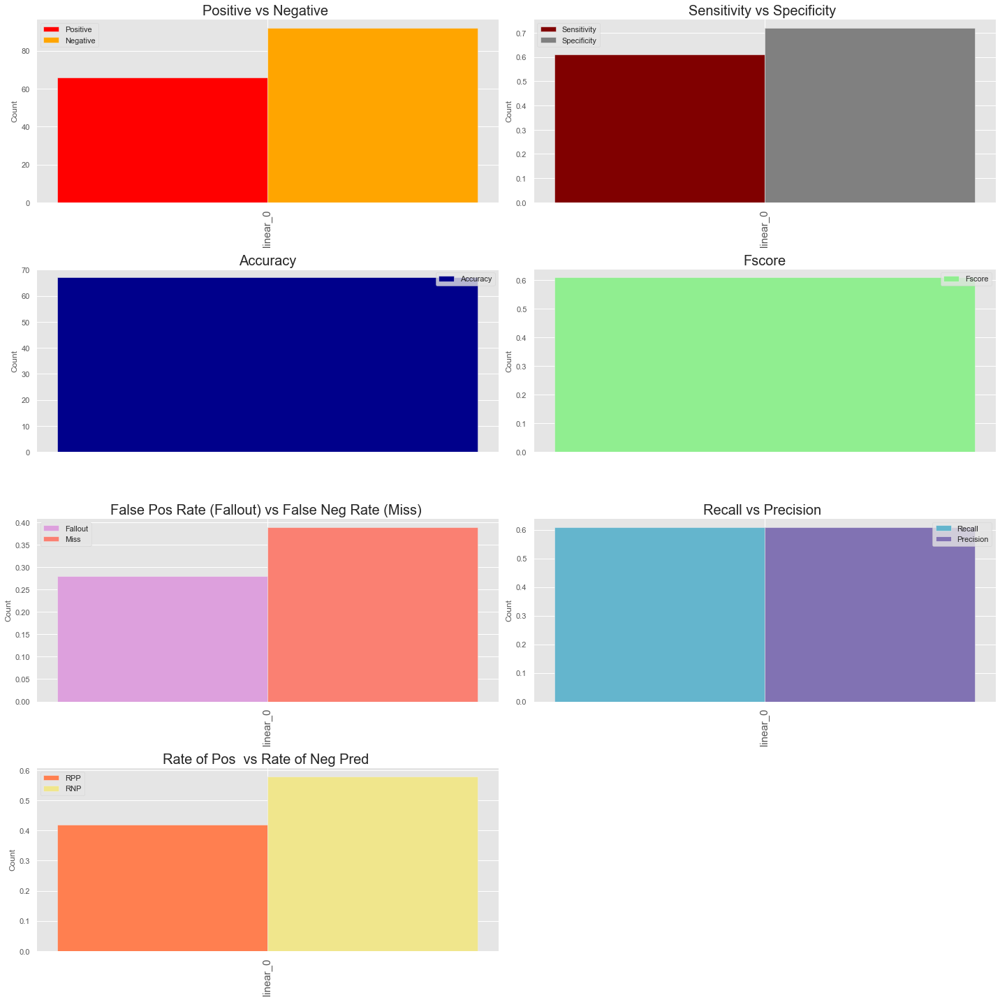

In [89]:
#visualize results
plotResult(PerfEva_linear_b)

In [90]:
#Extract best performing parameter
id_linear_b = PerfEva_linear_b.reset_index().Fscore.argmax()
max_Params_linear_b = params[kernel[0]][id_linear_b]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_linear_b.Fscore[id_linear_b]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_linear_b.Accu[id_linear_b]}')

Best Fscore obtained with linear kernel   - > 0.61
Best Accuracy obtained with linear kernel - > 67.09


In [91]:
#Best result showing the specific kernel
BestRes_linear_b = pd.DataFrame(PerfEva_linear_b.iloc[id_linear_b,:]).T
#index with ref to specific kernel removed. 
BestRes_linear_b = BestRes_linear_b.reset_index().drop(['index'], axis =1)
BestRes_linear_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,66.0,92.0,67.09,0.61,0.72,0.42,0.58,0.39,0.28,0.72,0.61,0.61,0.61


In [92]:
BestRes_linear_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.61,67.09,0.61,0.72


In [93]:
#Perf mean score and std
CVPerf_linear_b.round(4)

,mean score,std
linear_0,0.6709,0.4699


In [94]:
#Extract best score mean/std
Bestscore_linear_b = pd.DataFrame(CVPerf_linear_b.iloc[id_linear_b,:]).T.round(2)
Bestscore_linear_b = Bestscore_linear_b.reset_index().drop(['index'], axis =1)
Bestscore_linear_b

,mean score,std
0,0.67,0.47


In [95]:
#Kernel performance
KerAna_linear_b

,train_kernel_time,diag_Dominance,is_PSD
linear_0,0.00501299,False,True


In [96]:
#Extract best score mean/std
BestAnalysis_linear_b = pd.DataFrame(KerAna_linear_b.iloc[id_linear_b,:]).T
BestAnalysis_linear_b = BestAnalysis_linear_b.reset_index().drop(['index'], axis =1)
BestAnalysis_linear_b

,train_kernel_time,diag_Dominance,is_PSD
0,0.00501299,False,True


## poly Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  68
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  24


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.74
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.59 achieved


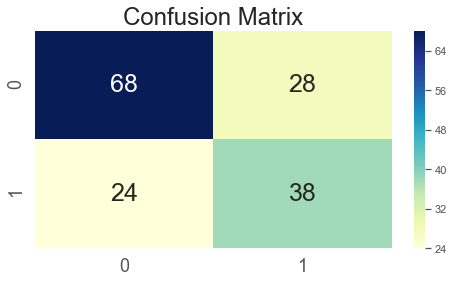

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.658 (0.474)
--> The total of 158 predicted with only 104 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  33
Actual label is False while we predicted False -  True Negatve   =  71
Actual label is False while we predicted True  -  False Positive =  33
Actual label is True while we predicted False  -  False Negative =  21


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 65.82 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.68 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.32 false positve rate (fallout) was achieved
--> Negative predictive value of 0.77
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.5 achieved
--> An Fscore of 0.55 achieved


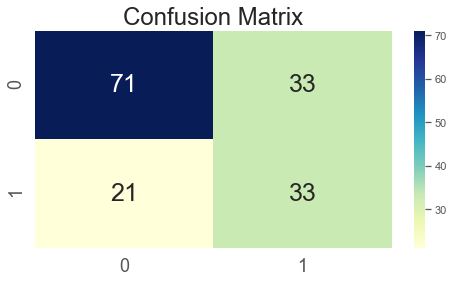

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.608 (0.488)
--> The total of 158 predicted with only 96 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  24
Actual label is False while we predicted False -  True Negatve   =  72
Actual label is False while we predicted True  -  False Positive =  42
Actual label is True while we predicted False  -  False Negative =  20


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 60.76 % was achieved
--> Sensitity of 0.55 was achieved
--> Specificity of 0.63 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.45 false negative rate was achieved
--> 0.37 false positve rate (fallout) was achieved
--> Negative predictive value of 0.78
--> Recall value 0f 0.55 achieved
--> The precision vaue of 0.36 achieved
--> An Fscore of 0.4

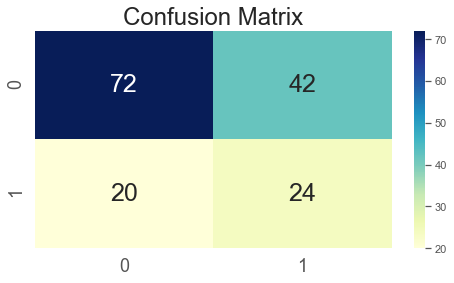

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.519 (0.500)
--> The total of 158 predicted with only 82 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  41
Actual label is False while we predicted False -  True Negatve   =  41
Actual label is False while we predicted True  -  False Positive =  25
Actual label is True while we predicted False  -  False Negative =  51


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 51.9 % was achieved
--> Sensitity of 0.45 was achieved
--> Specificity of 0.62 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.55 false negative rate was achieved
--> 0.38 false positve rate (fallout) was achieved
--> Negative predictive value of 0.45
--> Recall value 0f 0.45 achieved
--> The precision vaue of 0.62 achieved
--> An Fscore of 0.52

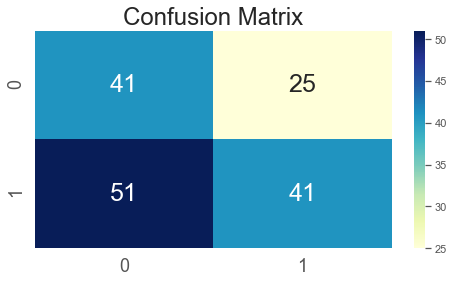

In [97]:
#Fit Cross validation model 
kernel = ['poly']
OUT_poly_b = fitkernelLOOCV(BIN, ytr, kernel, params)

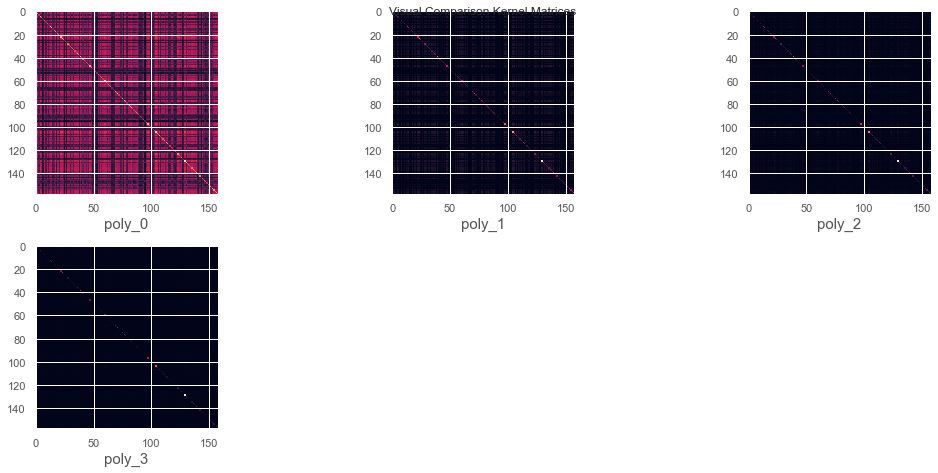

In [98]:
#Analyse performance results
PerfEva_poly_b, KerAna_poly_b, CVPerf_poly_b, CVvalus_poly_b  = Analyse_ResultsLOOCV(OUT_poly_b)

In [99]:
#Extract performance evaluation
PerfEva_poly_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
poly_0,66,92,67.09,0.61,0.71,0.42,0.58,0.39,0.29,0.74,0.61,0.58,0.59
poly_1,66,92,65.82,0.61,0.68,0.42,0.58,0.39,0.32,0.77,0.61,0.50,0.55
poly_2,66,92,60.76,0.55,0.63,0.42,0.58,0.45,0.37,0.78,0.55,0.36,0.44
poly_3,66,92,51.90,0.45,0.62,0.42,0.58,0.55,0.38,0.45,0.45,0.62,0.52


In [100]:
PerfEva_poly_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
poly_0,0.59,67.09,0.61,0.71
poly_1,0.55,65.82,0.61,0.68
poly_2,0.44,60.76,0.55,0.63
poly_3,0.52,51.90,0.45,0.62


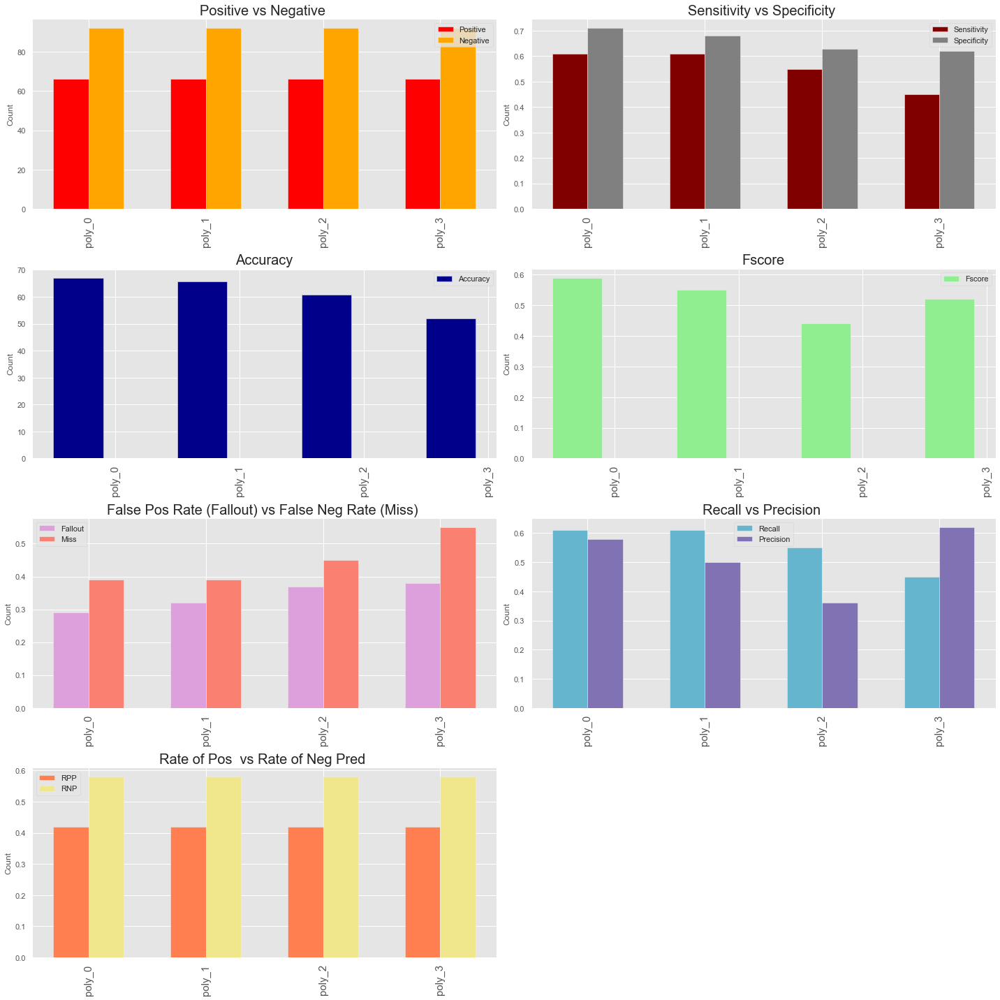

In [101]:
#visualize results
plotResult(PerfEva_poly_b)

In [102]:
#Extract best performing parameter
id_poly_b = PerfEva_poly_b.reset_index().Fscore.argmax()
max_Params_poly_b = params[kernel[0]][id_poly_b]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_poly_b.Fscore[id_poly_b]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_poly_b.Accu[id_poly_b]}')

Best Fscore obtained with poly kernel   - > 0.59
Best Accuracy obtained with poly kernel - > 67.09


In [103]:
#Best result showing the specific kernel
BestRes_poly_b = pd.DataFrame(PerfEva_poly_b.iloc[id_poly_b,:]).T
#index with ref to specific kernel removed. 
BestRes_poly_b = BestRes_poly_b.reset_index().drop(['index'], axis =1)
BestRes_poly_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,66.0,92.0,67.09,0.61,0.71,0.42,0.58,0.39,0.29,0.74,0.61,0.58,0.59


In [104]:
BestRes_poly_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.59,67.09,0.61,0.71


In [105]:
#Perf mean score and std
CVPerf_poly_b.round(2)

,mean score,std
poly_0,0.67,0.47
poly_1,0.66,0.47
poly_2,0.61,0.49
poly_3,0.52,0.50


In [106]:
#Extract best score mean/std
Bestscore_poly_b = pd.DataFrame(CVPerf_poly_b.iloc[id_poly_b,:]).T.round(2)
Bestscore_poly_b = Bestscore_poly_b.reset_index().drop(['index'], axis =1)
Bestscore_poly_b

,mean score,std
0,0.67,0.47


In [107]:
#Kernel performance
KerAna_poly_b

,train_kernel_time,diag_Dominance,is_PSD
poly_0,0.00350857,False,True
poly_1,0.00350952,False,True
poly_2,0.00551558,False,True
poly_3,0.0055151,False,True


In [108]:
#Extract best score mean/std
BestAnalysis_poly_b = pd.DataFrame(KerAna_poly_b.iloc[id_poly_b,:]).T
BestAnalysis_poly_b = BestAnalysis_poly_b.reset_index().drop(['index'], axis =1)
BestAnalysis_poly_b

,train_kernel_time,diag_Dominance,is_PSD
0,0.00350857,False,True


## H_poly Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.639 (0.480)
--> The total of 158 predicted with only 101 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  36
Actual label is False while we predicted False -  True Negatve   =  65
Actual label is False while we predicted True  -  False Positive =  30
Actual label is True while we predicted False  -  False Negative =  27


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 63.92 % was achieved
--> Sensitity of 0.57 was achieved
--> Specificity of 0.68 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.43 false negative rate was achieved
--> 0.32 false positve rate (fallout) was achieved
--> Negative predictive value of 0.71
--> Recall value 0f 0.57 achieved
--> The precision vaue of 0.55 achieved
--> An Fscore of 0.56 achieved


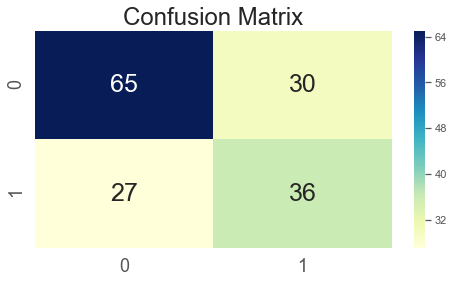

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.665 (0.472)
--> The total of 158 predicted with only 105 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  33
Actual label is False while we predicted False -  True Negatve   =  72
Actual label is False while we predicted True  -  False Positive =  33
Actual label is True while we predicted False  -  False Negative =  20


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 66.46 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.69 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.31 false positve rate (fallout) was achieved
--> Negative predictive value of 0.78
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.5 achieved
--> An Fscore of 0.55 achieved


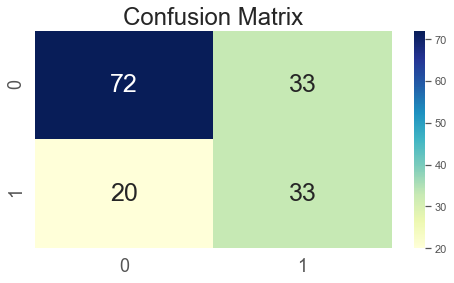

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.601 (0.490)
--> The total of 158 predicted with only 95 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  24
Actual label is False while we predicted False -  True Negatve   =  71
Actual label is False while we predicted True  -  False Positive =  42
Actual label is True while we predicted False  -  False Negative =  21


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 60.13 % was achieved
--> Sensitity of 0.53 was achieved
--> Specificity of 0.63 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.47 false negative rate was achieved
--> 0.37 false positve rate (fallout) was achieved
--> Negative predictive value of 0.77
--> Recall value 0f 0.53 achieved
--> The precision vaue of 0.36 achieved
--> An Fscore of 0.4

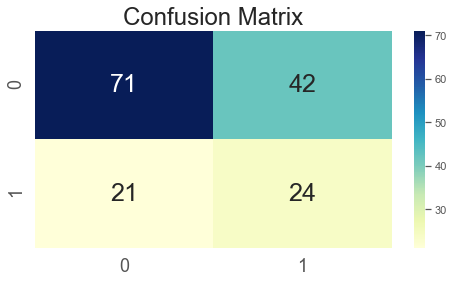

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.500 (0.500)
--> The total of 158 predicted with only 79 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  42
Actual label is False while we predicted False -  True Negatve   =  37
Actual label is False while we predicted True  -  False Positive =  24
Actual label is True while we predicted False  -  False Negative =  55


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 50.0 % was achieved
--> Sensitity of 0.43 was achieved
--> Specificity of 0.61 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.57 false negative rate was achieved
--> 0.39 false positve rate (fallout) was achieved
--> Negative predictive value of 0.4
--> Recall value 0f 0.43 achieved
--> The precision vaue of 0.64 achieved
--> An Fscore of 0.51 

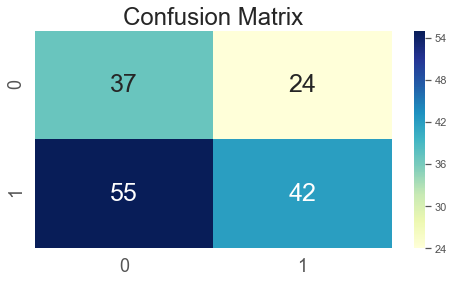

In [109]:
#Fit Cross validation model 
kernel = ['H_poly']
OUT_H_poly_b = fitkernelLOOCV(BIN, ytr, kernel, params)

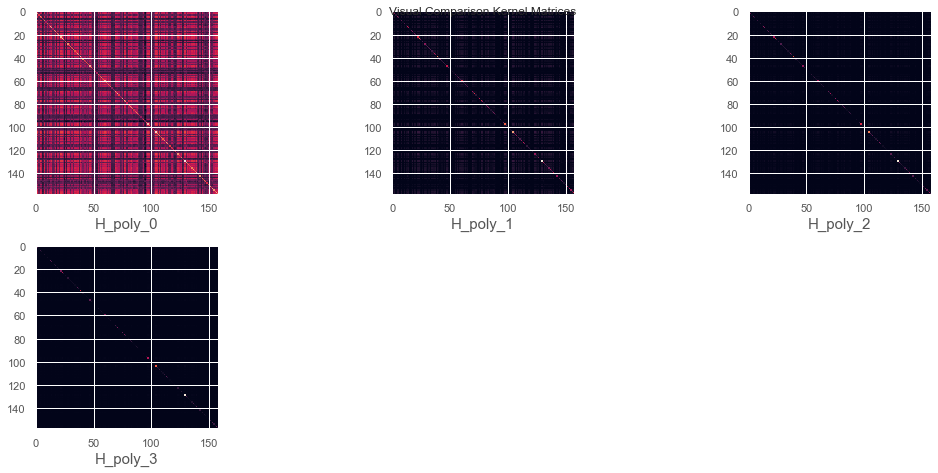

In [110]:
#Analyse performance results
PerfEva_H_poly_b, KerAna_H_poly_b, CVPerf_H_poly_b, CVvalus_H_poly_b  = Analyse_ResultsLOOCV(OUT_H_poly_b)

In [111]:
#Extract performance evaluation
PerfEva_H_poly_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
H_poly_0,66,92,63.92,0.57,0.68,0.42,0.58,0.43,0.32,0.71,0.57,0.55,0.56
H_poly_1,66,92,66.46,0.62,0.69,0.42,0.58,0.38,0.31,0.78,0.62,0.50,0.55
H_poly_2,66,92,60.13,0.53,0.63,0.42,0.58,0.47,0.37,0.77,0.53,0.36,0.43
H_poly_3,66,92,50.00,0.43,0.61,0.42,0.58,0.57,0.39,0.40,0.43,0.64,0.51


In [112]:
PerfEva_H_poly_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
H_poly_0,0.56,63.92,0.57,0.68
H_poly_1,0.55,66.46,0.62,0.69
H_poly_2,0.43,60.13,0.53,0.63
H_poly_3,0.51,50.00,0.43,0.61


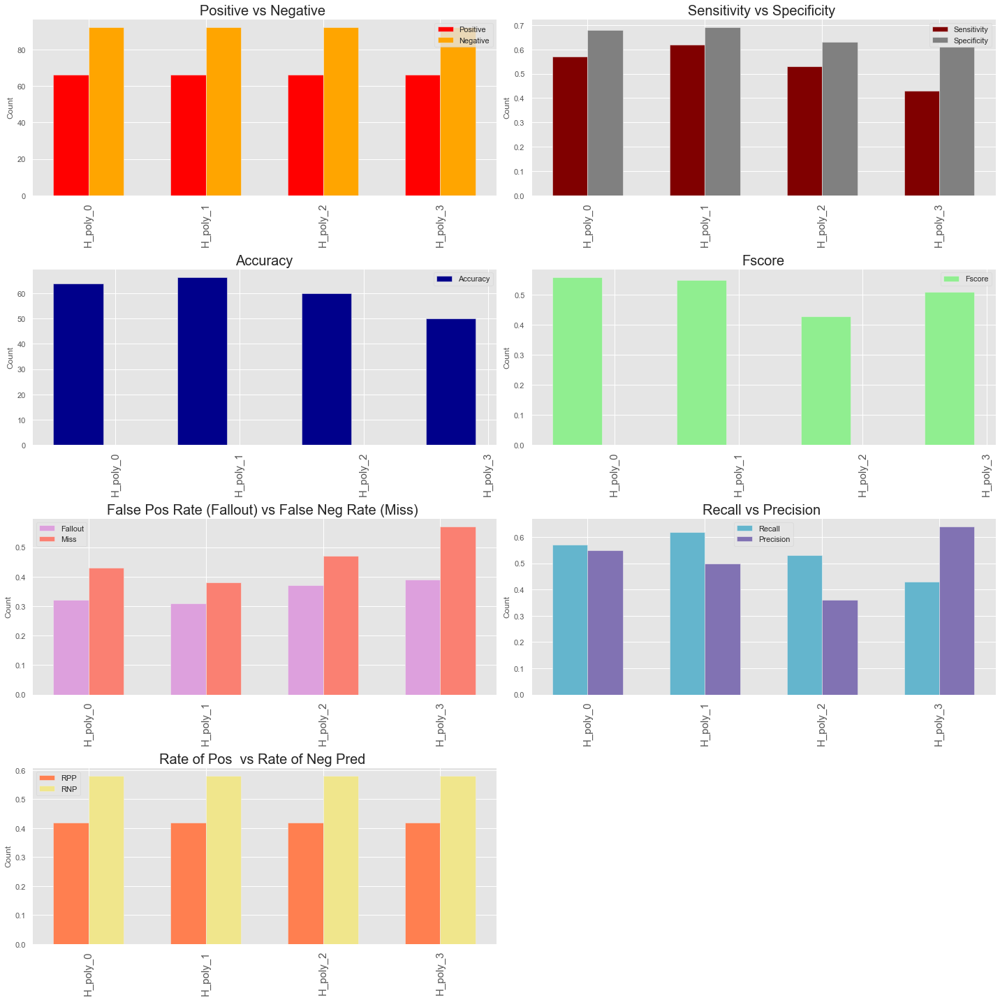

In [113]:
#visualize results
plotResult(PerfEva_H_poly_b)

In [114]:
#Extract best performing parameter
id_H_poly_b = PerfEva_H_poly_b.reset_index().Fscore.argmax()
max_Params_H_poly_b = params[kernel[0]][id_H_poly_b]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_H_poly_b.Fscore[id_H_poly_b]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_H_poly_b.Accu[id_H_poly_b]}')

Best Fscore obtained with H_poly kernel   - > 0.56
Best Accuracy obtained with H_poly kernel - > 63.92


In [115]:
#Best result showing the specific kernel
BestRes_H_poly_b = pd.DataFrame(PerfEva_H_poly_b.iloc[id_H_poly_b,:]).T
#index with ref to specific kernel removed. 
BestRes_H_poly_b = BestRes_H_poly_b.reset_index().drop(['index'], axis =1)
BestRes_H_poly_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,66.0,92.0,63.92,0.57,0.68,0.42,0.58,0.43,0.32,0.71,0.57,0.55,0.56


In [116]:
BestRes_H_poly_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.56,63.92,0.57,0.68


In [117]:
#Perf mean score and std
CVPerf_H_poly_b.round(2)

,mean score,std
H_poly_0,0.64,0.48
H_poly_1,0.66,0.47
H_poly_2,0.60,0.49
H_poly_3,0.50,0.50


In [118]:
#Extract best score mean/std
Bestscore_H_poly_b = pd.DataFrame(CVPerf_H_poly_b.iloc[id_H_poly_b,:]).T.round(2)
Bestscore_H_poly_b = Bestscore_H_poly_b.reset_index().drop(['index'], axis =1)
Bestscore_H_poly_b

,mean score,std
0,0.64,0.48


In [119]:
#Kernel performance
KerAna_H_poly_b

,train_kernel_time,diag_Dominance,is_PSD
H_poly_0,0.00300837,False,True
H_poly_1,0.0030086,False,True
H_poly_2,0.00551343,False,True
H_poly_3,0.00601602,False,True


In [120]:
#Extract best score mean/std
BestAnalysis_H_poly_b = pd.DataFrame(KerAna_H_poly_b.iloc[id_H_poly_b,:]).T
BestAnalysis_H_poly_b = BestAnalysis_H_poly_b.reset_index().drop(['index'], axis =1)
BestAnalysis_H_poly_b

,train_kernel_time,diag_Dominance,is_PSD
0,0.00300837,False,True


## RBF Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

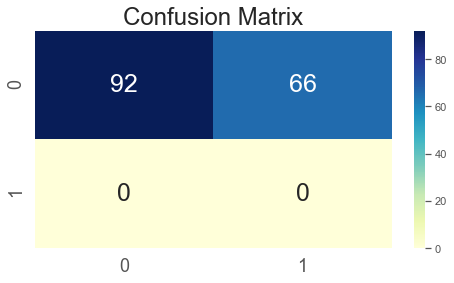

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

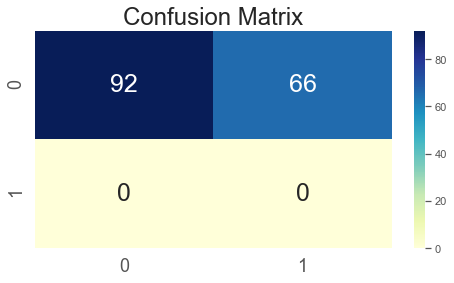

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

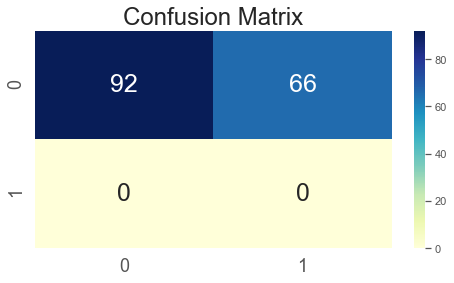

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

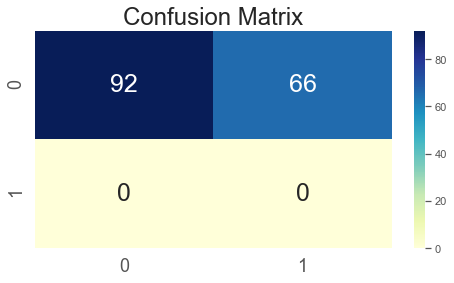

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

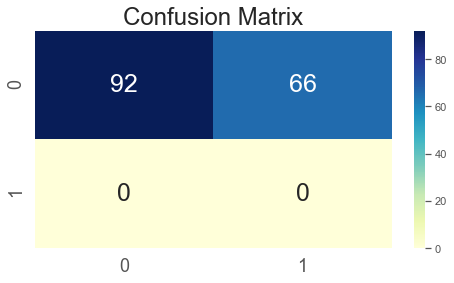

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

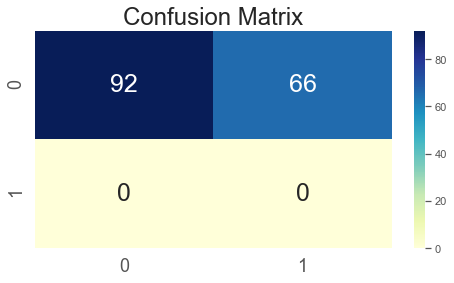

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

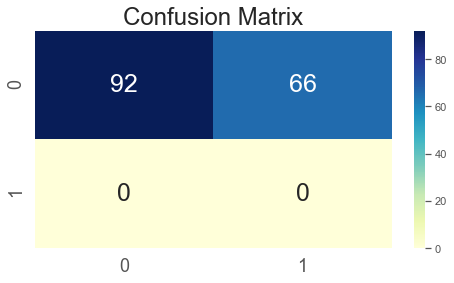

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

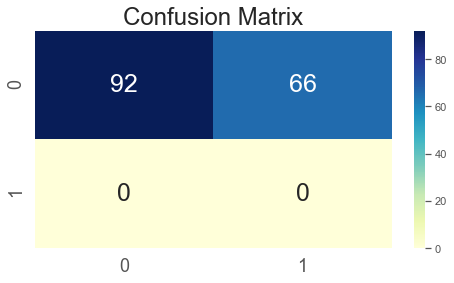

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

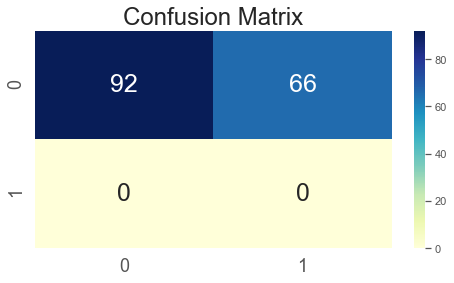

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

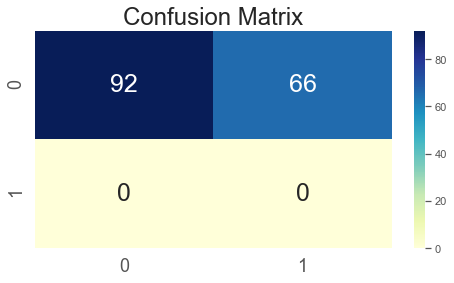

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

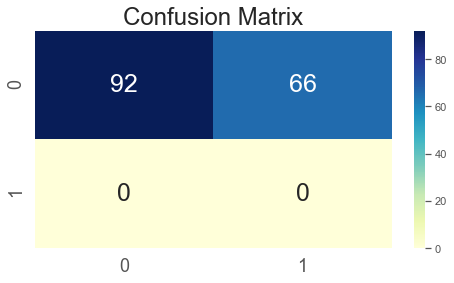

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

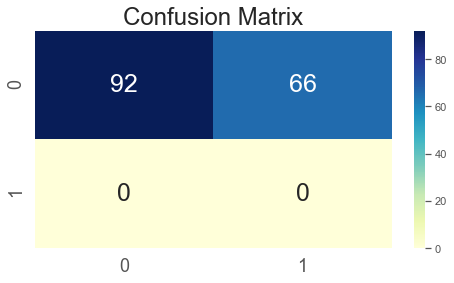

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

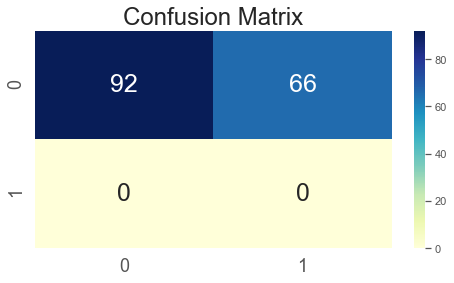

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

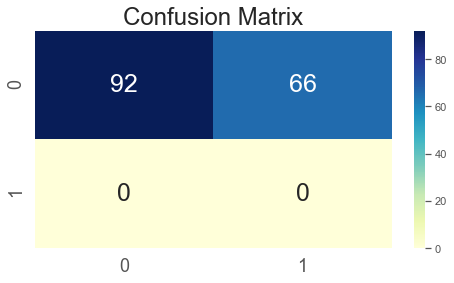

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

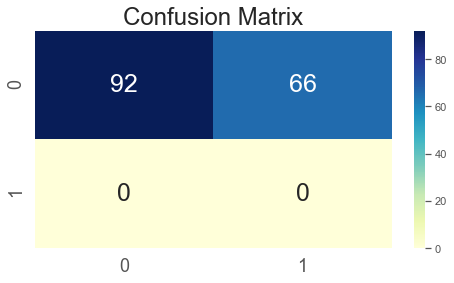

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

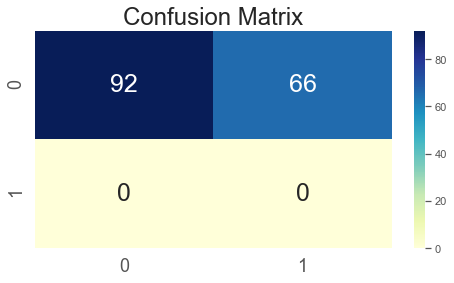

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

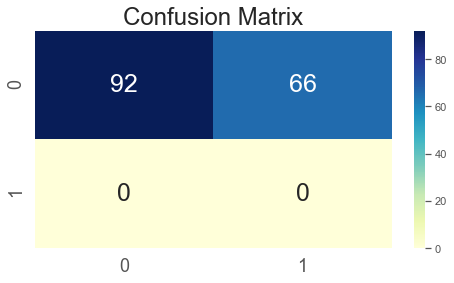

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

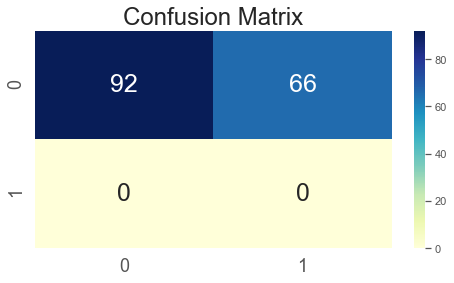

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

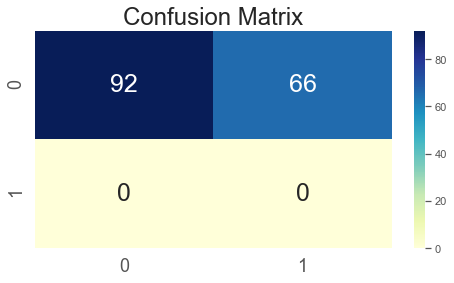

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

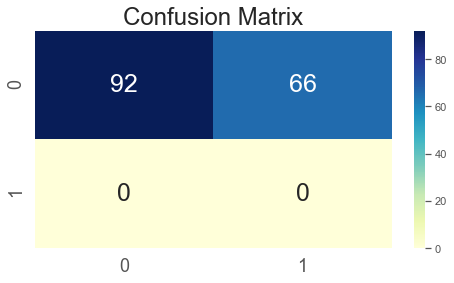

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

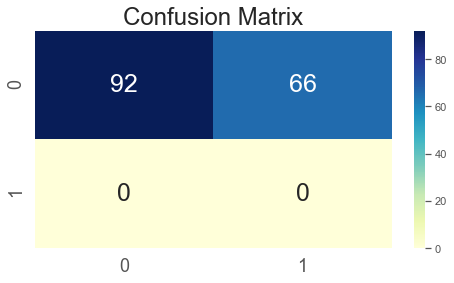

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

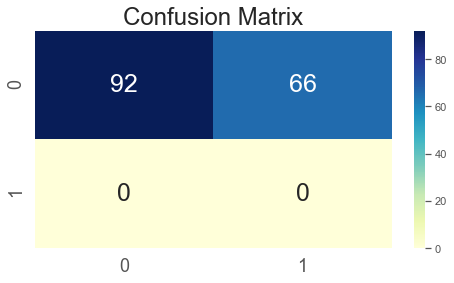

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  18
Actual label is False while we predicted False -  True Negatve   =  74
Actual label is False while we predicted True  -  False Positive =  48
Actual label is True while we predicted False  -  False Negative =  18


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0.61 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0.39 false positve rate (fallout) was achieved
--> Negative predictive value of 0.8
--> Recall value 0f 0.5 achieved
--> The precision vaue of 0.27 achieved
--> An Fscore of 0.35 achieved


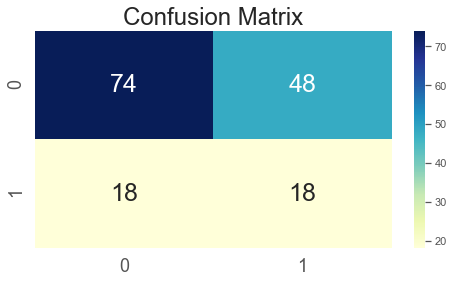

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

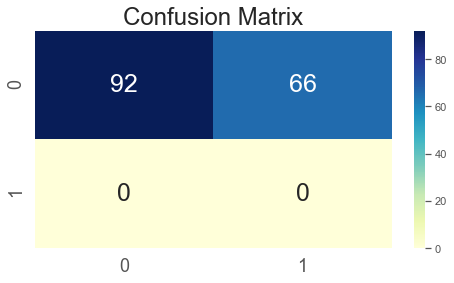

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

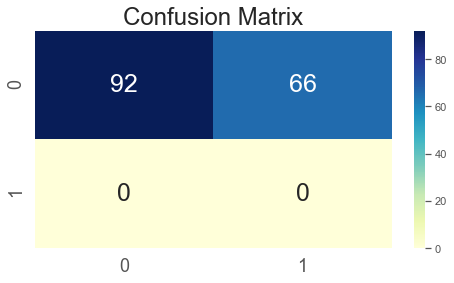

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

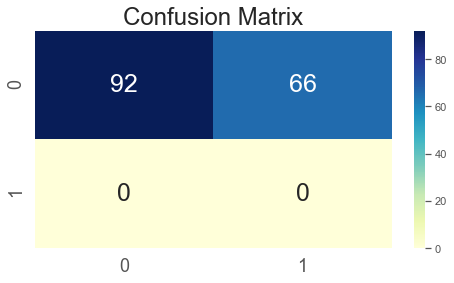

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

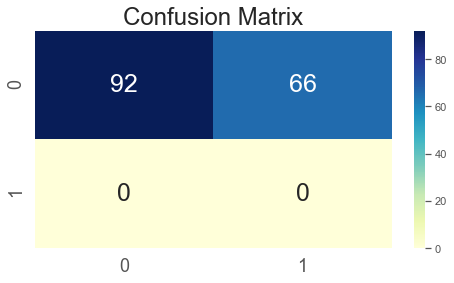

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

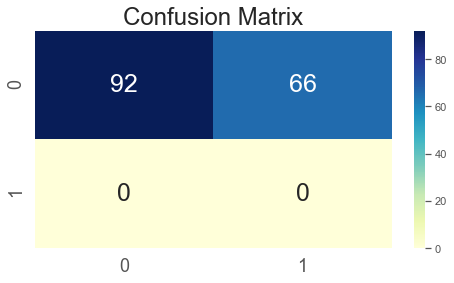

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

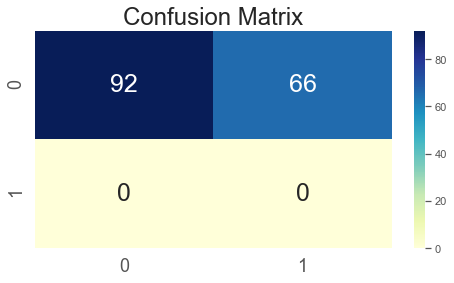

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

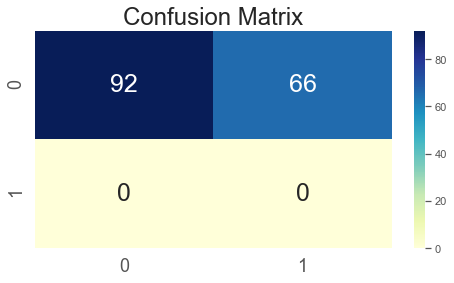

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

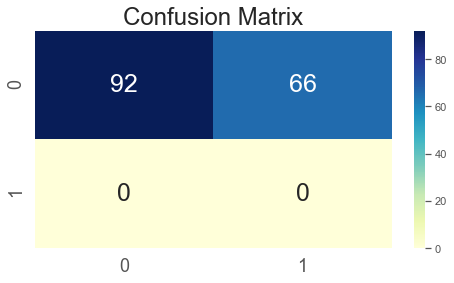

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

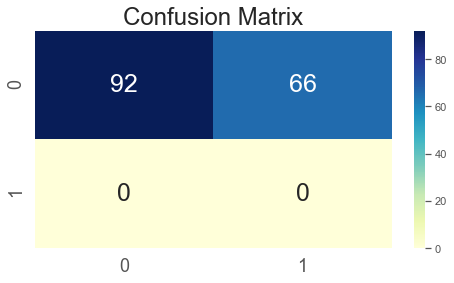

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

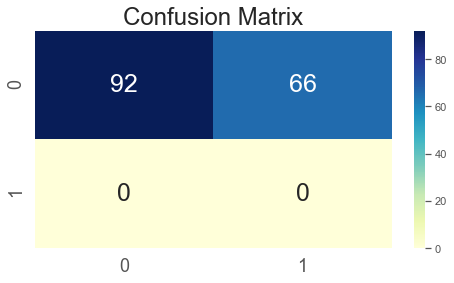

In [121]:
#Fit Cross validation model 
kernel = ['rbf']
OUT_rbf_b = fitkernelLOOCV(BIN, ytr, kernel, params)

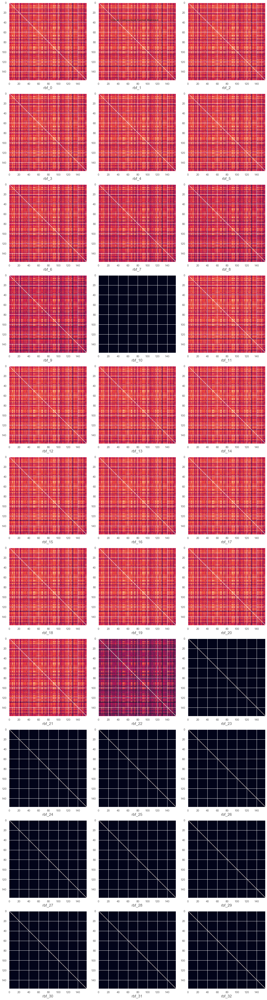

In [122]:
#Analyse performance results
PerfEva_rbf_b, KerAna_rbf_b, CVPerf_rbf_b, CVvalus_rbf_b  = Analyse_ResultsLOOCV(OUT_rbf_b)

In [123]:
#Extract performance evaluation
PerfEva_rbf_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
rbf_0,66,92,58.23,0.0,0.58,0.42,0.58,0.0,0.42,1.0,0.0,0.00,0.00
rbf_1,66,92,58.23,0.0,0.58,0.42,0.58,0.0,0.42,1.0,0.0,0.00,0.00
rbf_2,66,92,58.23,0.0,0.58,0.42,0.58,0.0,0.42,1.0,0.0,0.00,0.00
rbf_3,66,92,58.23,0.0,0.58,0.42,0.58,0.0,0.42,1.0,0.0,0.00,0.00
rbf_4,66,92,58.23,0.0,0.58,0.42,0.58,0.0,0.42,1.0,0.0,0.00,0.00
rbf_5,66,92,58.23,0.0,0.58,0.42,0.58,0.0,0.42,1.0,0.0,0.00,0.00
rbf_6,66,92,58.23,0.0,0.58,0.42,0.58,0.0,0.42,1.0,0.0,0.00,0.00
rbf_7,66,92,58.23,0.0,0.58,0.42,0.58,0.0,0.42,1.0,0.0,0.00,0.00
rbf_8,66,92,58.23,0.0,0.58,0.42,0.58,0.0,0.42,1.0,0.0,0.00,0.00
rbf_9,66,92,58.23,0.0,0.58,0.42,0.58,0.0,0.42,1.0,0.0,0.00,0.00


In [124]:
PerfEva_rbf_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
rbf_0,0.00,58.23,0.0,0.58
rbf_1,0.00,58.23,0.0,0.58
rbf_2,0.00,58.23,0.0,0.58
rbf_3,0.00,58.23,0.0,0.58
rbf_4,0.00,58.23,0.0,0.58
rbf_5,0.00,58.23,0.0,0.58
rbf_6,0.00,58.23,0.0,0.58
rbf_7,0.00,58.23,0.0,0.58
rbf_8,0.00,58.23,0.0,0.58
rbf_9,0.00,58.23,0.0,0.58


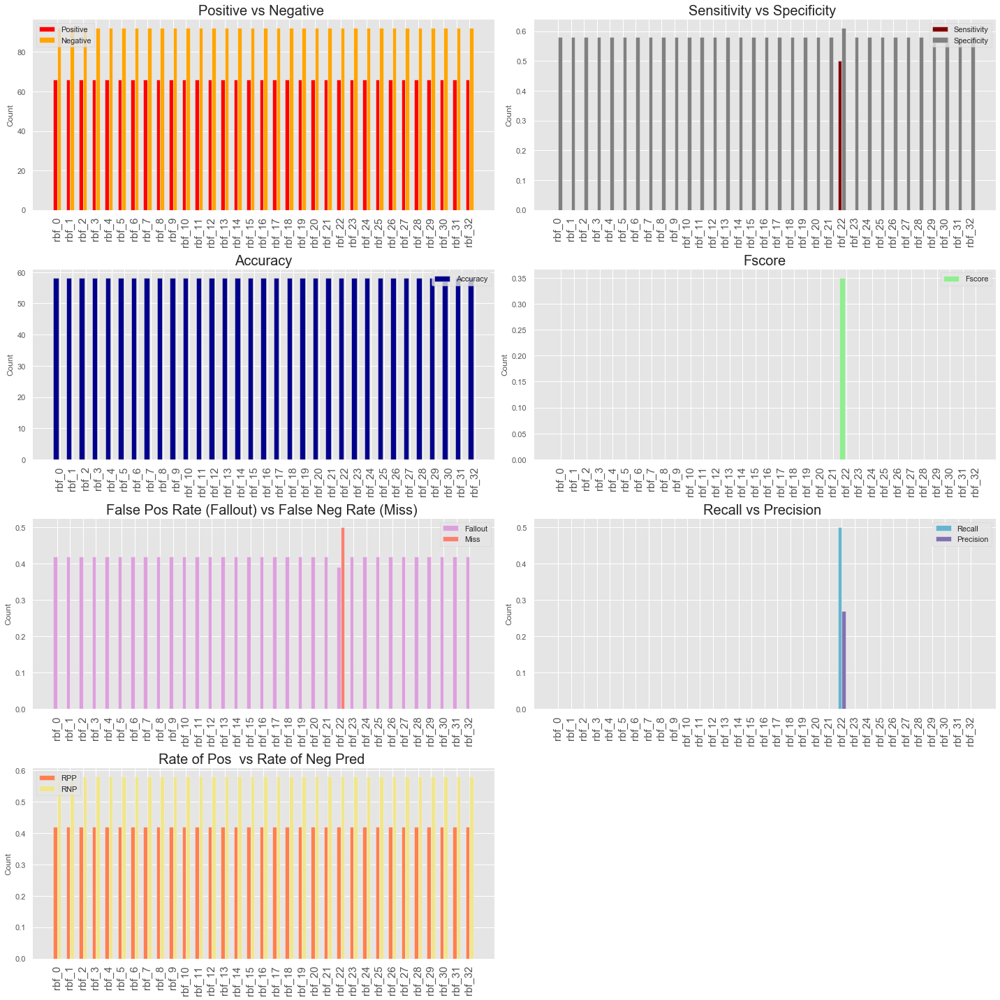

In [125]:
#visualize results
plotResult(PerfEva_rbf_b)

In [126]:
#Extract best performing parameter
id_rbf_b = PerfEva_rbf_b.reset_index().Fscore.argmax()
max_Params_rbf_b = params[kernel[0]][id_rbf_b]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_rbf_b.Fscore[id_rbf_b]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_rbf_b.Accu[id_rbf_b]}')

Best Fscore obtained with rbf kernel   - > 0.35
Best Accuracy obtained with rbf kernel - > 58.23


In [127]:
#Best result showing the specific kernel
BestRes_rbf_b = pd.DataFrame(PerfEva_rbf_b.iloc[id_rbf_b,:]).T
#index with ref to specific kernel removed. 
BestRes_rbf_b = BestRes_rbf_b.reset_index().drop(['index'], axis =1)
BestRes_rbf_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,66.0,92.0,58.23,0.5,0.61,0.42,0.58,0.5,0.39,0.8,0.5,0.27,0.35


In [128]:
BestRes_rbf_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.35,58.23,0.5,0.61


In [129]:
#Perf mean score and std
CVPerf_rbf_b.round(2)

,mean score,std
rbf_0,0.58,0.49
rbf_1,0.58,0.49
rbf_2,0.58,0.49
rbf_3,0.58,0.49
rbf_4,0.58,0.49
rbf_5,0.58,0.49
rbf_6,0.58,0.49
rbf_7,0.58,0.49
rbf_8,0.58,0.49
rbf_9,0.58,0.49


In [130]:
#Extract best score mean/std
Bestscore_rbf_b = pd.DataFrame(CVPerf_rbf_b.iloc[id_rbf_b,:]).T.round(2)
Bestscore_rbf_b = Bestscore_rbf_b.reset_index().drop(['index'], axis =1)
Bestscore_rbf_b

,mean score,std
0,0.58,0.49


In [131]:
#Kernel performance
KerAna_rbf_b

,train_kernel_time,diag_Dominance,is_PSD
rbf_0,1.92662,False,True
rbf_1,2.06199,False,True
rbf_2,2.00383,False,True
rbf_3,1.88501,False,True
rbf_4,1.85544,False,True
rbf_5,1.97024,False,True
rbf_6,2.07853,False,True
rbf_7,1.96723,False,True
rbf_8,2.01235,False,True
rbf_9,1.93314,False,True


In [132]:
#Extract best score mean/std
BestAnalysis_rbf_b = pd.DataFrame(KerAna_rbf_b.iloc[id_rbf_b,:]).T
BestAnalysis_rbf_b = BestAnalysis_rbf_b.reset_index().drop(['index'], axis =1)
BestAnalysis_rbf_b

,train_kernel_time,diag_Dominance,is_PSD
0,1.99681,False,True


## erbf Kernel

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

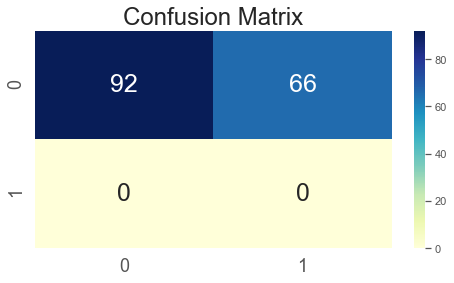

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

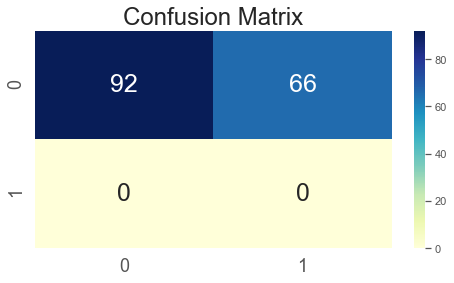

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

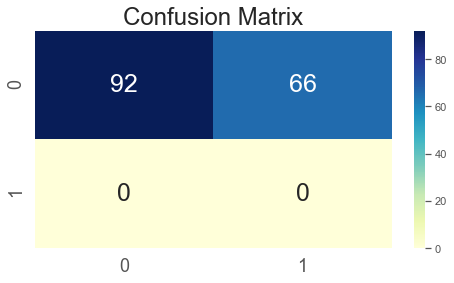

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

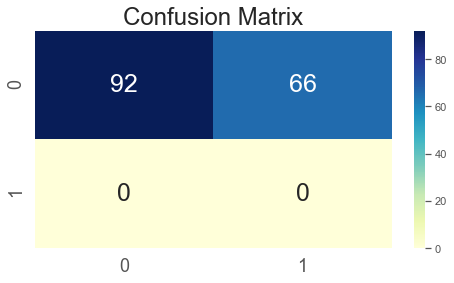

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

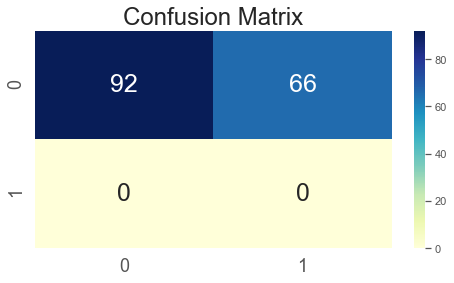

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

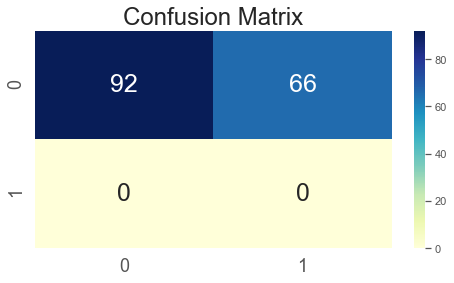

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

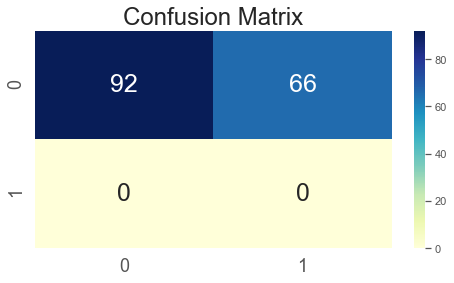

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

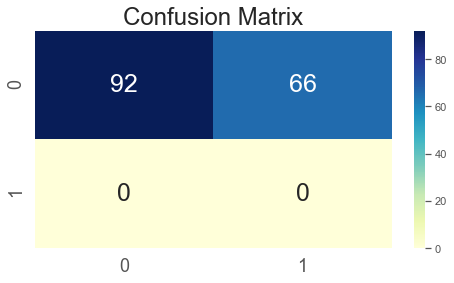

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

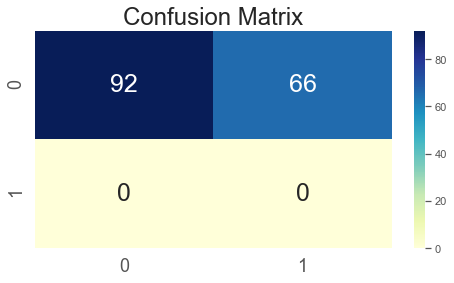

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

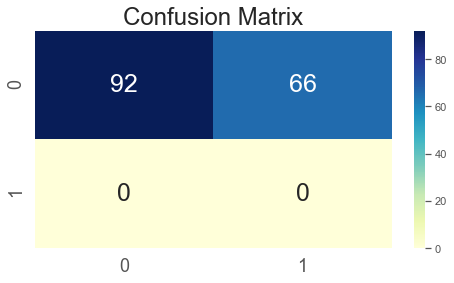

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

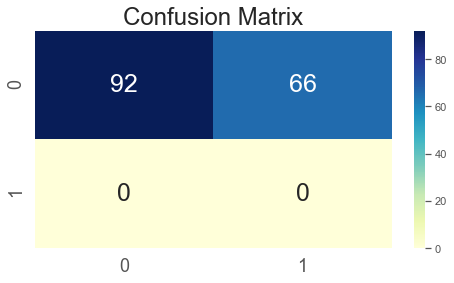

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

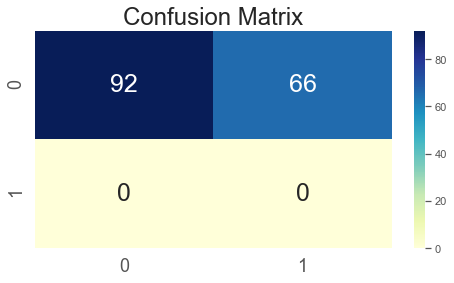

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

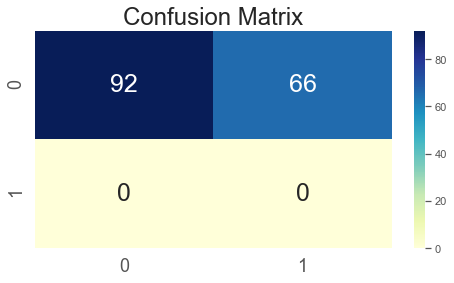

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

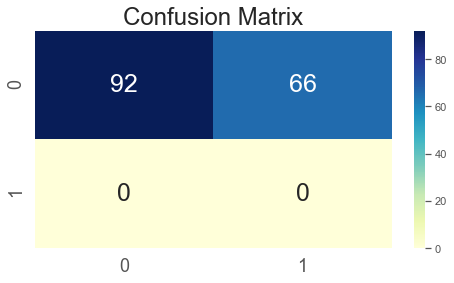

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

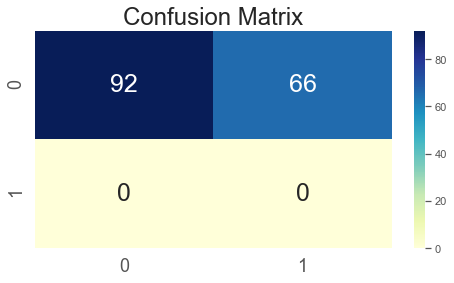

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

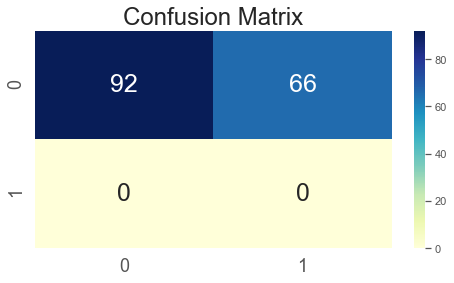

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

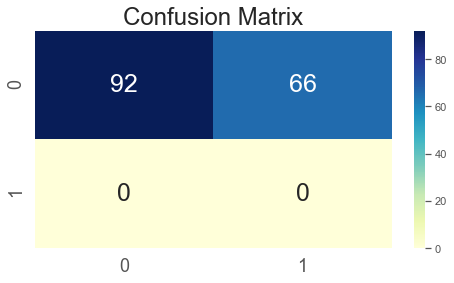

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

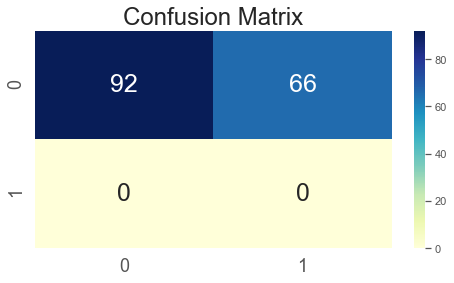

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

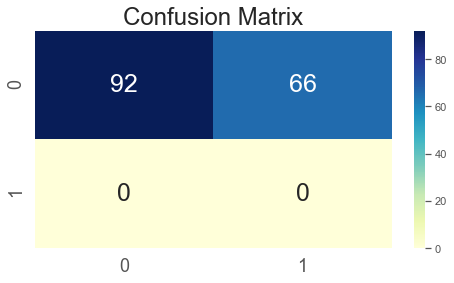

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

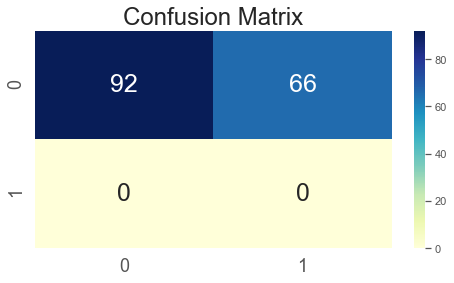

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

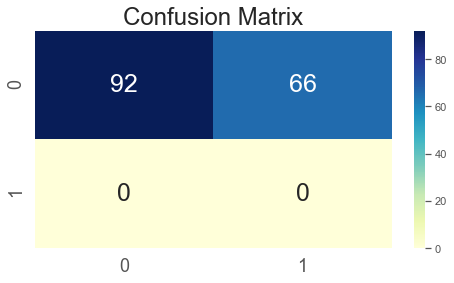

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

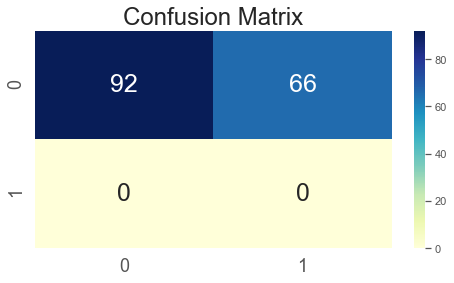

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

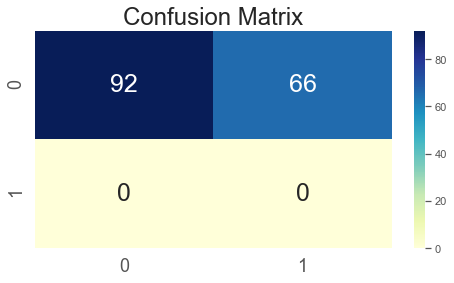

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 fal

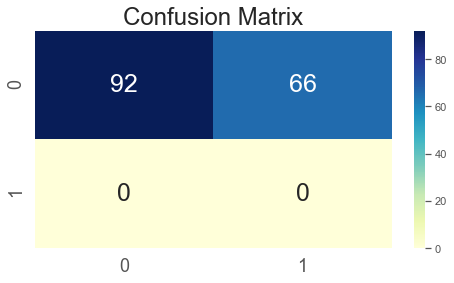

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.576 (0.494)
--> The total of 158 predicted with only 91 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  7
Actual label is False while we predicted False -  True Negatve   =  84
Actual label is False while we predicted True  -  False Positive =  59
Actual label is True while we predicted False  -  False Negative =  8


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 57.59 % was achieved
--> Sensitity of 0.47 was achieved
--> Specificity of 0.59 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.53 false negative rate was achieved
--> 0.41 false positve rate (fallout) was achieved
--> Negative predictive value of 0.91
--> Recall value 0f 0.47 achieved
--> The precision vaue of 0.11 achieved
--> An Fscore of 0.18 achieved


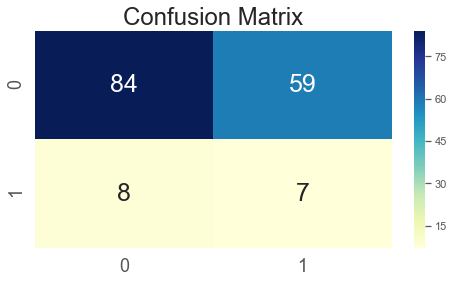

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

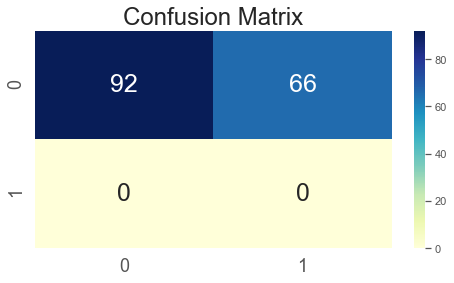

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

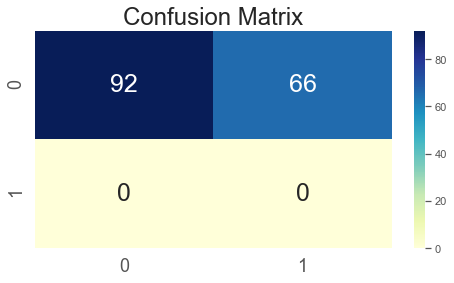

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

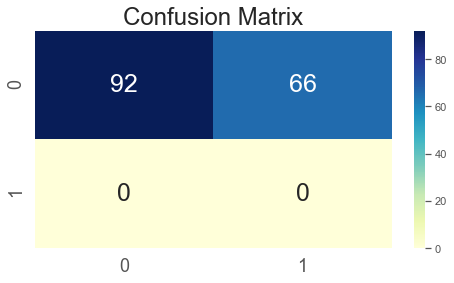

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

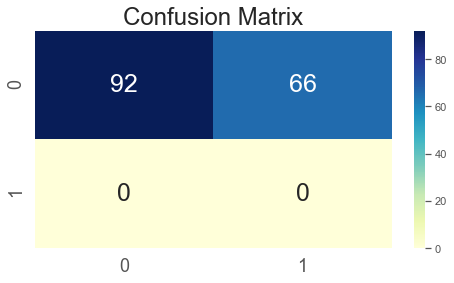

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

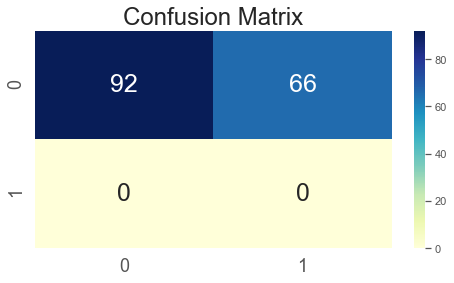

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

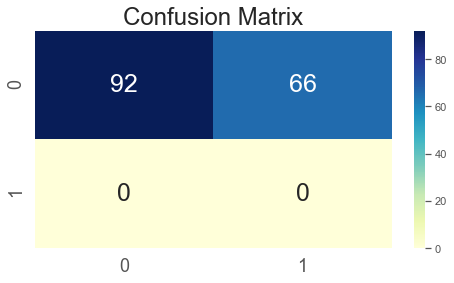

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

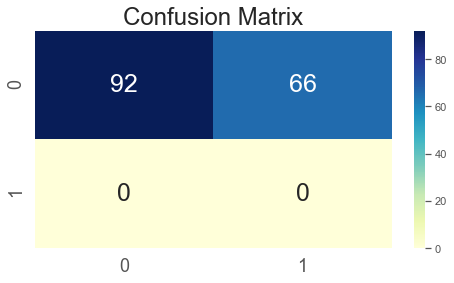

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

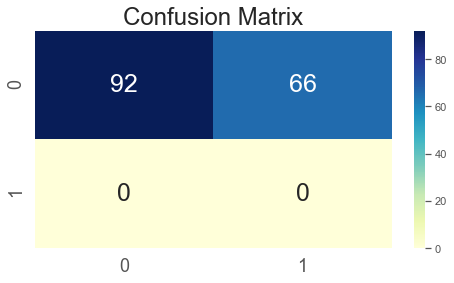

In [133]:
#Fit Cross validation model 
kernel = ['erbf']
OUT_erbf_b = fitkernelLOOCV(BIN, ytr, kernel, params)

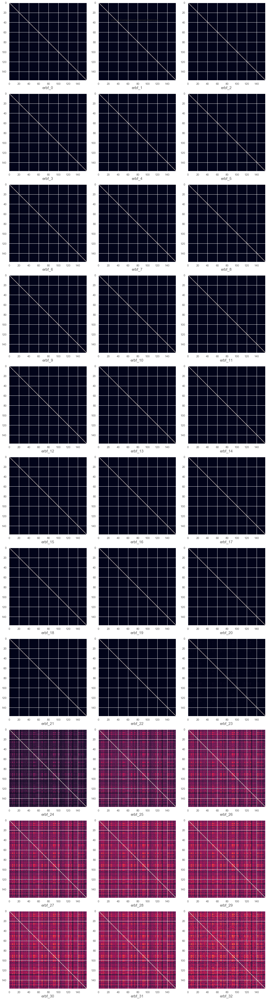

In [134]:
#Analyse performance results
PerfEva_erbf_b, KerAna_erbf_b, CVPerf_erbf_b, CVvalus_erbf_b  = Analyse_ResultsLOOCV(OUT_erbf_b)

In [135]:
#Extract performance evaluation
PerfEva_erbf_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
erbf_0,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00
erbf_1,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00
erbf_2,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00
erbf_3,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00
erbf_4,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00
erbf_5,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00
erbf_6,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00
erbf_7,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00
erbf_8,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00
erbf_9,66,92,58.23,0.00,0.58,0.42,0.58,0.00,0.42,1.00,0.00,0.00,0.00


In [136]:
PerfEva_erbf_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
erbf_0,0.00,58.23,0.00,0.58
erbf_1,0.00,58.23,0.00,0.58
erbf_2,0.00,58.23,0.00,0.58
erbf_3,0.00,58.23,0.00,0.58
erbf_4,0.00,58.23,0.00,0.58
erbf_5,0.00,58.23,0.00,0.58
erbf_6,0.00,58.23,0.00,0.58
erbf_7,0.00,58.23,0.00,0.58
erbf_8,0.00,58.23,0.00,0.58
erbf_9,0.00,58.23,0.00,0.58


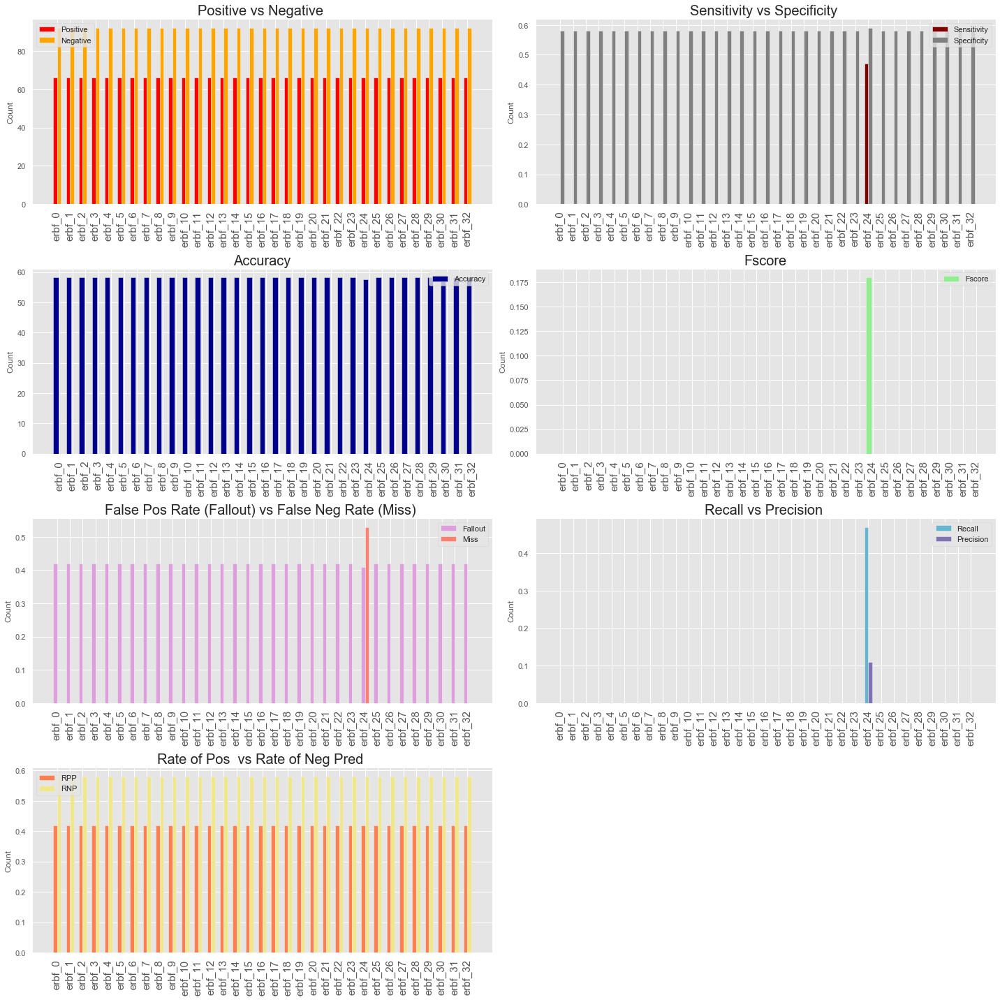

In [137]:
#visualize results
plotResult(PerfEva_erbf_b)

In [138]:
#Extract best performing parameter
id_erbf_b = PerfEva_erbf_b.reset_index().Fscore.argmax()
max_Params_erbf_b = params[kernel[0]][id_erbf_b]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_erbf_b.Fscore[id_erbf_b]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_erbf_b.Accu[id_erbf_b]}')

Best Fscore obtained with erbf kernel   - > 0.18
Best Accuracy obtained with erbf kernel - > 57.59


In [139]:
#Best result showing the specific kernel
BestRes_erbf_b = pd.DataFrame(PerfEva_erbf_b.iloc[id_erbf_b,:]).T
#index with ref to specific kernel removed. 
BestRes_erbf_b = BestRes_erbf_b.reset_index().drop(['index'], axis =1)
BestRes_erbf_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,66.0,92.0,57.59,0.47,0.59,0.42,0.58,0.53,0.41,0.91,0.47,0.11,0.18


In [140]:
BestRes_erbf_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.18,57.59,0.47,0.59


In [141]:
#Perf mean score and std
CVPerf_erbf_b.round(2)

,mean score,std
erbf_0,0.58,0.49
erbf_1,0.58,0.49
erbf_2,0.58,0.49
erbf_3,0.58,0.49
erbf_4,0.58,0.49
erbf_5,0.58,0.49
erbf_6,0.58,0.49
erbf_7,0.58,0.49
erbf_8,0.58,0.49
erbf_9,0.58,0.49


In [142]:
#Extract best score mean/std
Bestscore_erbf_b = pd.DataFrame(CVPerf_erbf_b.iloc[id_erbf_b,:]).T.round(2)
Bestscore_erbf_b = Bestscore_erbf_b.reset_index().drop(['index'], axis =1)
Bestscore_erbf_b

,mean score,std
0,0.58,0.49


In [143]:
#Kernel performance
KerAna_erbf_b

,train_kernel_time,diag_Dominance,is_PSD
erbf_0,2.08154,False,True
erbf_1,2.12064,False,True
erbf_2,2.12816,False,True
erbf_3,2.11412,False,True
erbf_4,2.1066,False,True
erbf_5,2.15724,False,True
erbf_6,2.12716,False,True
erbf_7,2.00433,False,True
erbf_8,1.9918,False,True
erbf_9,2.11212,False,True


In [144]:
#Extract best score mean/std
BestAnalysis_erbf_b = pd.DataFrame(KerAna_erbf_b.iloc[id_erbf_b,:]).T
BestAnalysis_erbf_b = BestAnalysis_erbf_b.reset_index().drop(['index'], axis =1)
BestAnalysis_erbf_b

,train_kernel_time,diag_Dominance,is_PSD
0,2.10811,False,True


## laplace Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


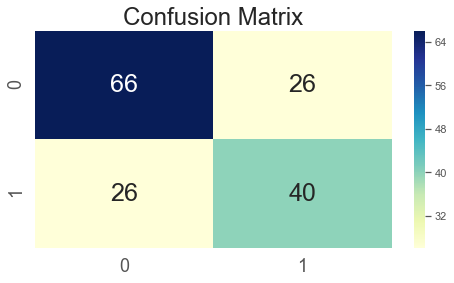

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


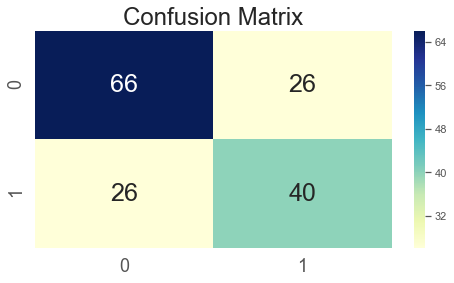

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


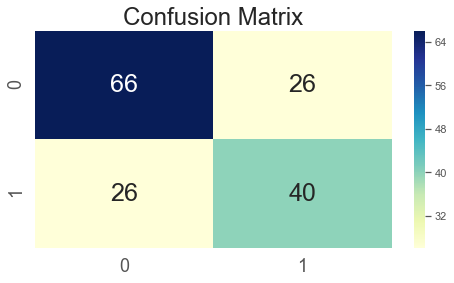

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


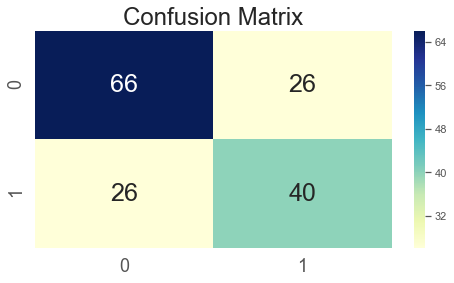

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


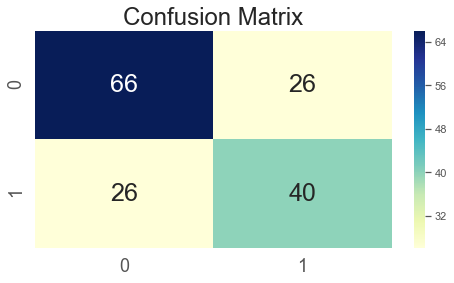

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


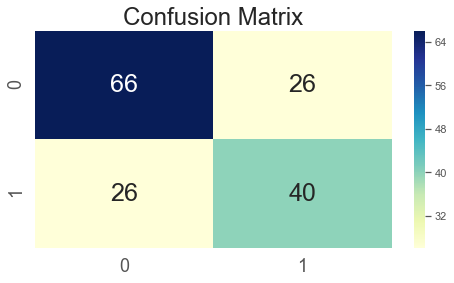

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


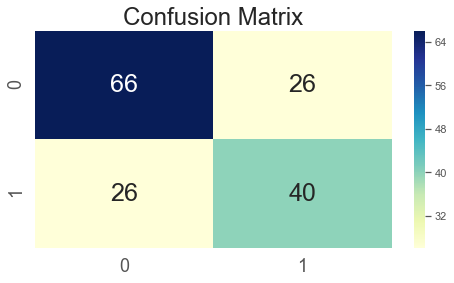

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


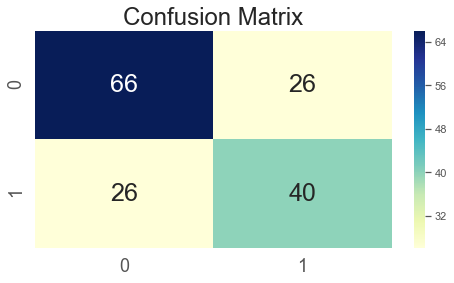

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


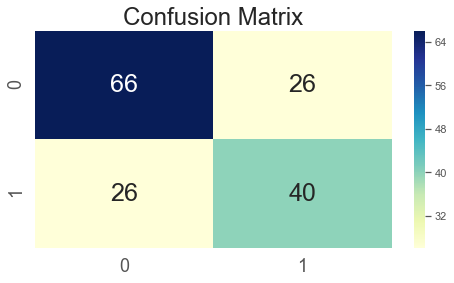

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


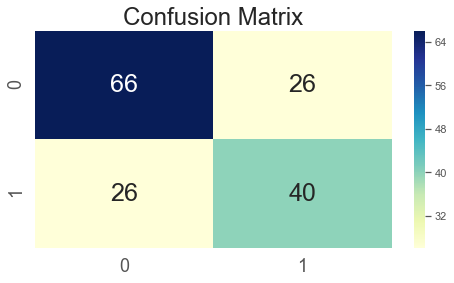

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


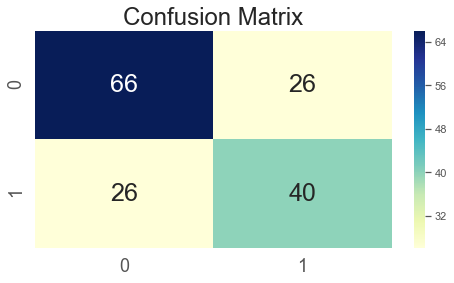

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


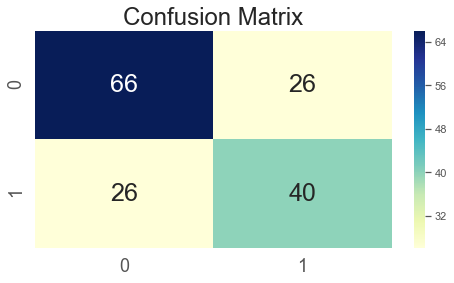

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


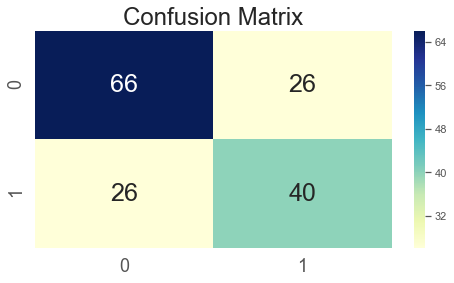

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


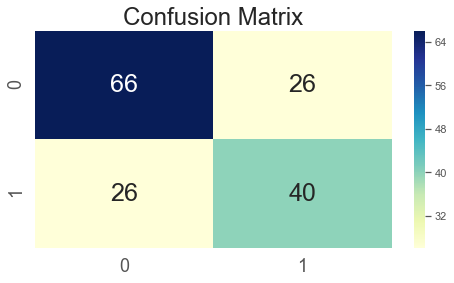

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


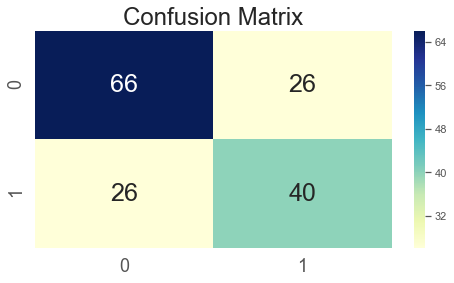

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


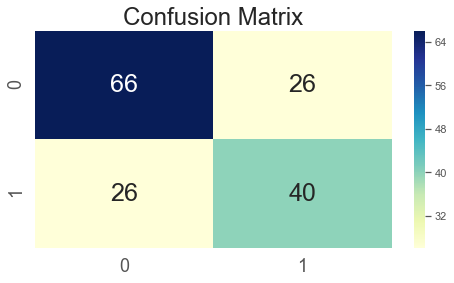

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


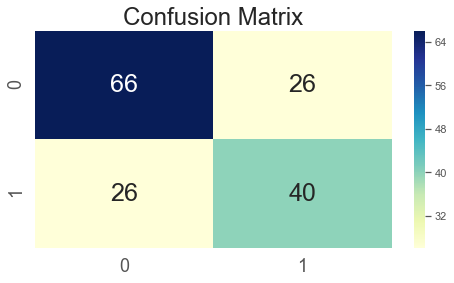

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


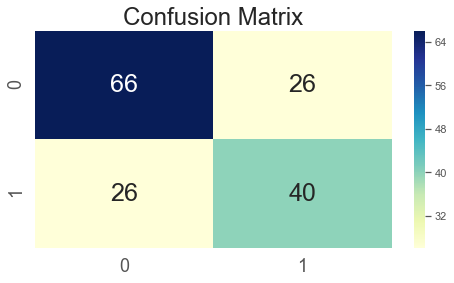

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


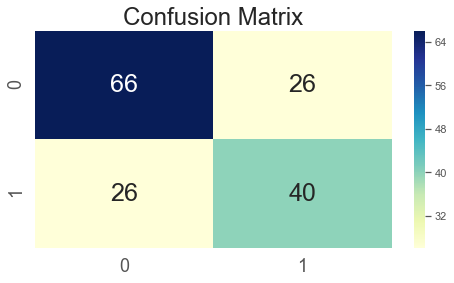

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


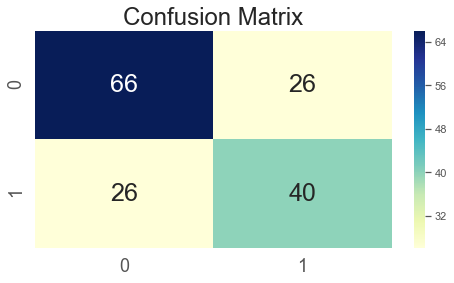

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


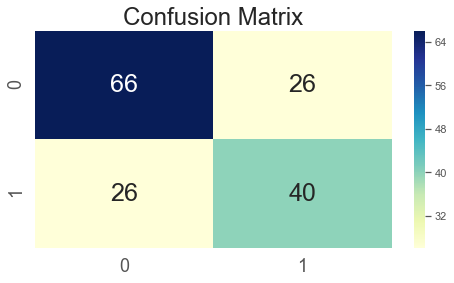

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


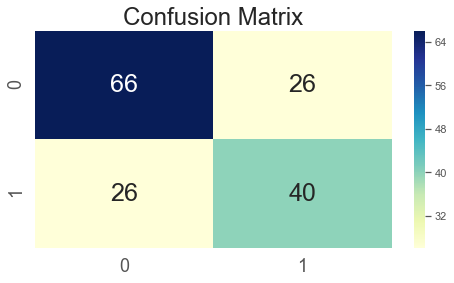

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


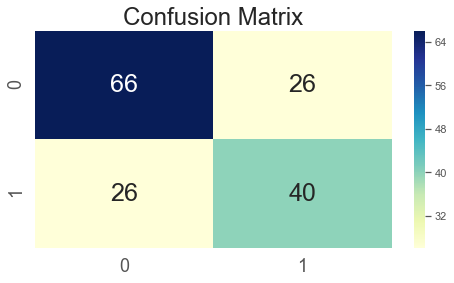

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


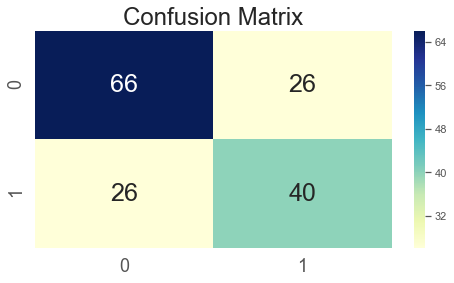

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


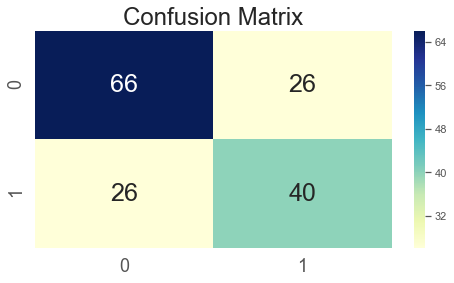

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


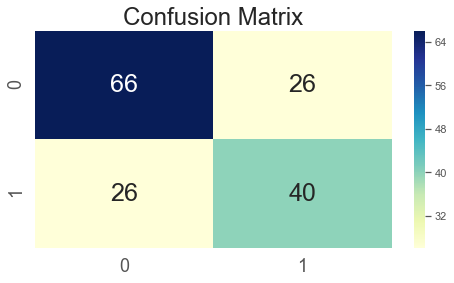

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


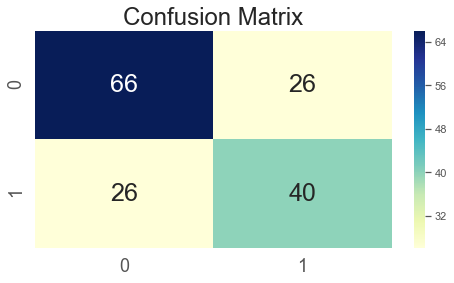

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


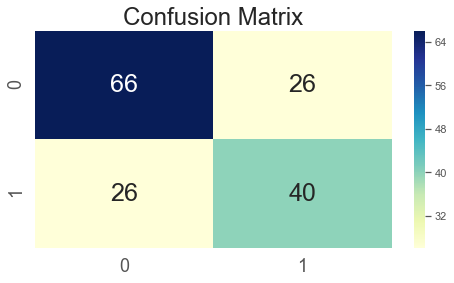

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.671 (0.470)
--> The total of 158 predicted with only 106 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  66
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  26


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.09 % was achieved
--> Sensitity of 0.61 was achieved
--> Specificity of 0.72 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.39 false negative rate was achieved
--> 0.28 false positve rate (fallout) was achieved
--> Negative predictive value of 0.72
--> Recall value 0f 0.61 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.61 achieved


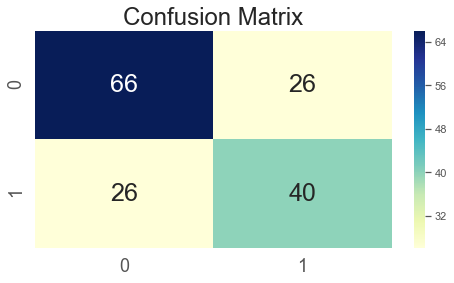

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.690 (0.463)
--> The total of 158 predicted with only 109 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  40
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  26
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 68.99 % was achieved
--> Sensitity of 0.63 was achieved
--> Specificity of 0.73 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.37 false negative rate was achieved
--> 0.27 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.63 achieved
--> The precision vaue of 0.61 achieved
--> An Fscore of 0.62 achieved


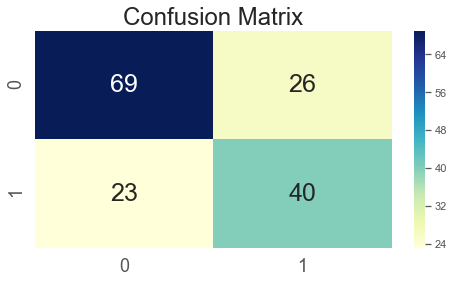

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.677 (0.468)
--> The total of 158 predicted with only 107 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  38
Actual label is False while we predicted False -  True Negatve   =  69
Actual label is False while we predicted True  -  False Positive =  28
Actual label is True while we predicted False  -  False Negative =  23


--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 67.72 % was achieved
--> Sensitity of 0.62 was achieved
--> Specificity of 0.71 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0.38 false negative rate was achieved
--> 0.29 false positve rate (fallout) was achieved
--> Negative predictive value of 0.75
--> Recall value 0f 0.62 achieved
--> The precision vaue of 0.58 achieved
--> An Fscore of 0.6 achieved


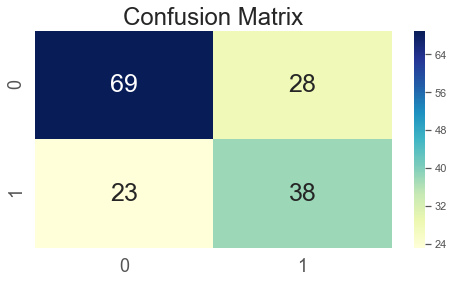

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

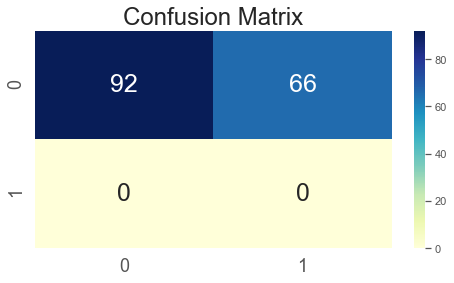

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.582 (0.493)
--> The total of 158 predicted with only 92 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  0
Actual label is False while we predicted False -  True Negatve   =  92
Actual label is False while we predicted True  -  False Positive =  66
Actual label is True while we predicted False  -  False Negative =  0

No True positives or False negatives predicted
Sensitivity set to zero 0
Miss (false negative rate) set to 0
Recall value set to 0
Fscore cannot be calculated as denominator is 0

--> 66 positive outcomes predicted
--> 92 negative outcomes predicted
--> An accuracy of 58.23 % was achieved
--> Sensitity of 0 was achieved
--> Specificity of 0.58 was achieved 
--> 0.42 rate of positive prediction
--> 0.58 rate of negative prediction
--> 0 false negative rate was achieved
--> 0.42 false positve rate (fallout) was achi

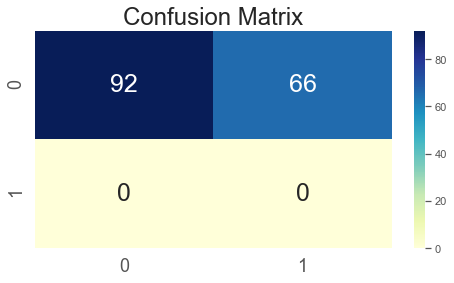

In [145]:
#Fit Cross validation model 
kernel = ['laplace']
OUT_laplace_b = fitkernelLOOCV(BIN, ytr, kernel, params)

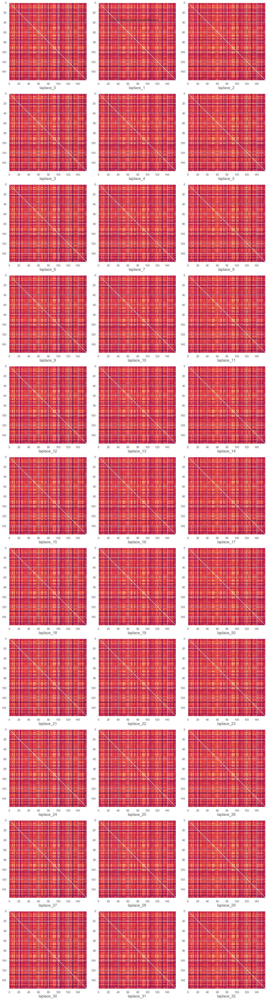

In [146]:
#Analyse performance results
PerfEva_laplace_b, KerAna_laplace_b, CVPerf_laplace_b, CVvalus_laplace_b  = Analyse_ResultsLOOCV(OUT_laplace_b)

In [147]:
#Extract performance evaluation
PerfEva_laplace_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
laplace_0,66,92,67.09,0.61,0.72,0.42,0.58,0.39,0.28,0.72,0.61,0.61,0.61
laplace_1,66,92,67.09,0.61,0.72,0.42,0.58,0.39,0.28,0.72,0.61,0.61,0.61
laplace_2,66,92,67.09,0.61,0.72,0.42,0.58,0.39,0.28,0.72,0.61,0.61,0.61
laplace_3,66,92,67.09,0.61,0.72,0.42,0.58,0.39,0.28,0.72,0.61,0.61,0.61
laplace_4,66,92,67.09,0.61,0.72,0.42,0.58,0.39,0.28,0.72,0.61,0.61,0.61
laplace_5,66,92,67.09,0.61,0.72,0.42,0.58,0.39,0.28,0.72,0.61,0.61,0.61
laplace_6,66,92,67.09,0.61,0.72,0.42,0.58,0.39,0.28,0.72,0.61,0.61,0.61
laplace_7,66,92,67.09,0.61,0.72,0.42,0.58,0.39,0.28,0.72,0.61,0.61,0.61
laplace_8,66,92,67.09,0.61,0.72,0.42,0.58,0.39,0.28,0.72,0.61,0.61,0.61
laplace_9,66,92,67.09,0.61,0.72,0.42,0.58,0.39,0.28,0.72,0.61,0.61,0.61


In [148]:
PerfEva_laplace_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
laplace_0,0.61,67.09,0.61,0.72
laplace_1,0.61,67.09,0.61,0.72
laplace_2,0.61,67.09,0.61,0.72
laplace_3,0.61,67.09,0.61,0.72
laplace_4,0.61,67.09,0.61,0.72
laplace_5,0.61,67.09,0.61,0.72
laplace_6,0.61,67.09,0.61,0.72
laplace_7,0.61,67.09,0.61,0.72
laplace_8,0.61,67.09,0.61,0.72
laplace_9,0.61,67.09,0.61,0.72


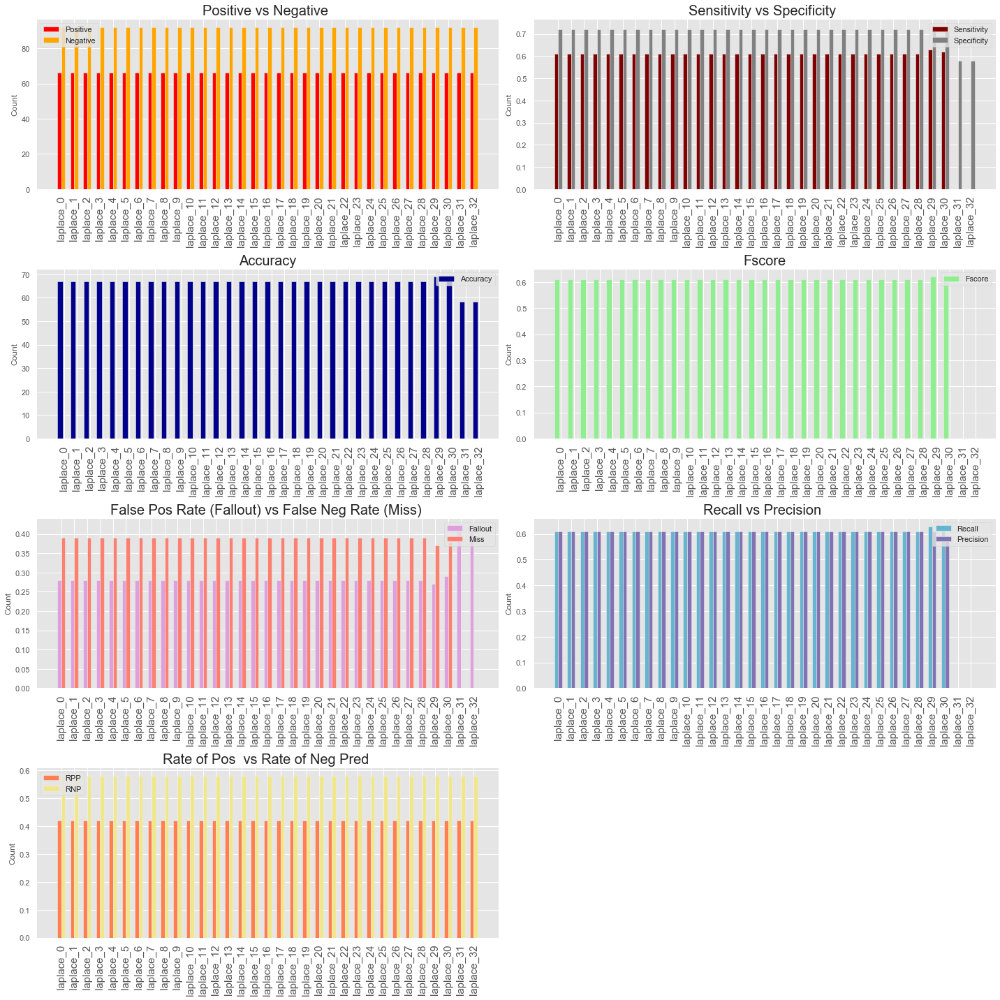

In [149]:
#visualize results
plotResult(PerfEva_laplace_b)

In [150]:
#Extract best performing parameter
id_laplace_b = PerfEva_laplace_b.reset_index().Fscore.argmax()
max_Params_laplace_b = params[kernel[0]][id_laplace_b]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_laplace_b.Fscore[id_laplace_b]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_laplace_b.Accu[id_laplace_b]}')

Best Fscore obtained with laplace kernel   - > 0.62
Best Accuracy obtained with laplace kernel - > 68.99


In [151]:
#Best result showing the specific kernel
BestRes_laplace_b = pd.DataFrame(PerfEva_laplace_b.iloc[id_laplace_b,:]).T
#index with ref to specific kernel removed. 
BestRes_laplace_b = BestRes_laplace_b.reset_index().drop(['index'], axis =1)
BestRes_laplace_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,66.0,92.0,68.99,0.63,0.73,0.42,0.58,0.37,0.27,0.75,0.63,0.61,0.62


In [152]:
BestRes_laplace_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.62,68.99,0.63,0.73


In [153]:
#Perf mean score and std
CVPerf_laplace_b.round(2)

,mean score,std
laplace_0,0.67,0.47
laplace_1,0.67,0.47
laplace_2,0.67,0.47
laplace_3,0.67,0.47
laplace_4,0.67,0.47
laplace_5,0.67,0.47
laplace_6,0.67,0.47
laplace_7,0.67,0.47
laplace_8,0.67,0.47
laplace_9,0.67,0.47


In [154]:
#Extract best score mean/std
Bestscore_laplace_b = pd.DataFrame(CVPerf_laplace_b.iloc[id_laplace_b,:]).T.round(2)
Bestscore_laplace_b = Bestscore_laplace_b.reset_index().drop(['index'], axis =1)
Bestscore_laplace_b

,mean score,std
0,0.69,0.46


In [155]:
#Kernel performance
KerAna_laplace_b

,train_kernel_time,diag_Dominance,is_PSD
laplace_0,2.43648,False,True
laplace_1,2.43047,False,True
laplace_2,2.41543,False,True
laplace_3,2.43447,False,True
laplace_4,2.49965,False,True
laplace_5,2.45403,False,True
laplace_6,2.4821,False,True
laplace_7,2.47408,False,True
laplace_8,2.44552,False,True
laplace_9,2.41994,False,True


In [156]:
#Extract best score mean/std
BestAnalysis_laplace_b = pd.DataFrame(KerAna_laplace_b.iloc[id_laplace_b,:]).T
BestAnalysis_laplace_b = BestAnalysis_laplace_b.reset_index().drop(['index'], axis =1)
BestAnalysis_laplace_b

,train_kernel_time,diag_Dominance,is_PSD
0,2.3658,False,True


## Compare Results from all Kernels

In [157]:
#Combine all result dataFrames
framesAll = [BestRes_linear_b,BestRes_rbf,BestRes_erbf_b, BestRes_poly_b,BestRes_H_poly_b,BestRes_laplace_b]
All_Res_df_b = pd.concat(framesAll)
All_Res_df_b.index = ['linear_b','rbf_b','erbf_b','poly_b','H_poly_b','laplace_b']
All_Res_df_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
linear_b,66.0,92.0,67.09,0.61,0.72,0.42,0.58,0.39,0.28,0.72,0.61,0.61,0.61
rbf_b,66.0,92.0,62.03,0.71,0.61,0.42,0.58,0.29,0.39,0.96,0.71,0.15,0.25
erbf_b,66.0,92.0,57.59,0.47,0.59,0.42,0.58,0.53,0.41,0.91,0.47,0.11,0.18
poly_b,66.0,92.0,67.09,0.61,0.71,0.42,0.58,0.39,0.29,0.74,0.61,0.58,0.59
H_poly_b,66.0,92.0,63.92,0.57,0.68,0.42,0.58,0.43,0.32,0.71,0.57,0.55,0.56
laplace_b,66.0,92.0,68.99,0.63,0.73,0.42,0.58,0.37,0.27,0.75,0.63,0.61,0.62


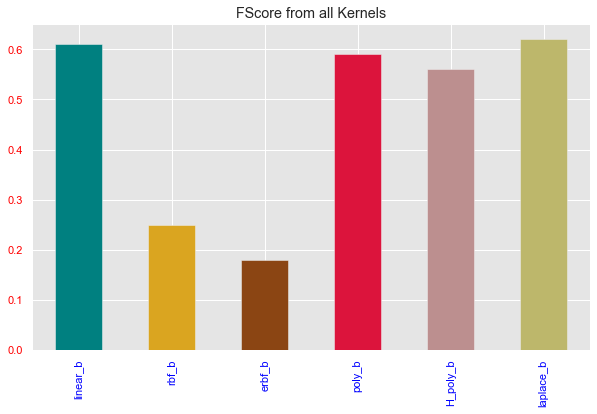

In [158]:
#Set tick colors:
#ax = plt.gca()
fig, ax = plt.subplots()
fig.set_size_inches(10, 6)

ax.tick_params(axis='x', colors='blue')
ax.tick_params(axis='y', colors='red')
c = ['teal', 'goldenrod', 'saddlebrown','crimson','rosybrown','darkkhaki']
All_Res_df_b.Fscore.plot(kind='bar', color=c);
plt.title('FScore from all Kernels');

In [159]:
#Extract and print the kernel with the best F1 Score
idc   = All_Res_df_b.reset_index().Fscore.argmax()
score = All_Res_df_b.Fscore.max()
print(f'{All_Res_df_b.index[idc]} Kernel had the best F1 Score of {score}')

laplace_b Kernel had the best F1 Score of 0.62


In [160]:
#Cut down dataframe 
All_Res_df_b[['Fscore', 'Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
linear_b,0.61,67.09,0.61,0.72
rbf_b,0.25,62.03,0.71,0.61
erbf_b,0.18,57.59,0.47,0.59
poly_b,0.59,67.09,0.61,0.71
H_poly_b,0.56,63.92,0.57,0.68
laplace_b,0.62,68.99,0.63,0.73


# Compare Binary vs Bag of Words

In [161]:
Frames_all = [All_Res_df, All_Res_df_b]

In [162]:
ViewAll = pd.concat(Frames_all)
ViewAll

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
linear,66.0,92.0,56.96,0.49,0.64,0.42,0.58,0.51,0.36,0.60,0.49,0.53,0.51
rbf,66.0,92.0,62.03,0.71,0.61,0.42,0.58,0.29,0.39,0.96,0.71,0.15,0.25
erbf,66.0,92.0,60.76,0.67,0.60,0.42,0.58,0.33,0.40,0.96,0.67,0.12,0.20
poly,66.0,92.0,62.03,0.53,0.74,0.42,0.58,0.47,0.26,0.53,0.53,0.74,0.62
H_poly,66.0,92.0,62.03,0.53,0.74,0.42,0.58,0.47,0.26,0.53,0.53,0.74,0.62
laplace,66.0,92.0,69.62,0.65,0.73,0.42,0.58,0.35,0.27,0.76,0.65,0.61,0.63
linear_b,66.0,92.0,67.09,0.61,0.72,0.42,0.58,0.39,0.28,0.72,0.61,0.61,0.61
rbf_b,66.0,92.0,62.03,0.71,0.61,0.42,0.58,0.29,0.39,0.96,0.71,0.15,0.25
erbf_b,66.0,92.0,57.59,0.47,0.59,0.42,0.58,0.53,0.41,0.91,0.47,0.11,0.18
poly_b,66.0,92.0,67.09,0.61,0.71,0.42,0.58,0.39,0.29,0.74,0.61,0.58,0.59


In [163]:
#Cut down dataframe 
ViewAll[['Fscore', 'Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
linear,0.51,56.96,0.49,0.64
rbf,0.25,62.03,0.71,0.61
erbf,0.20,60.76,0.67,0.60
poly,0.62,62.03,0.53,0.74
H_poly,0.62,62.03,0.53,0.74
laplace,0.63,69.62,0.65,0.73
linear_b,0.61,67.09,0.61,0.72
rbf_b,0.25,62.03,0.71,0.61
erbf_b,0.18,57.59,0.47,0.59
poly_b,0.59,67.09,0.61,0.71


In [164]:
#Extract best performing parameter
id_ = ViewAll.reset_index().Fscore.argmax()
max_Params= params[kernel[0]][id_]
print(f'Best Fscore obtained with {ViewAll.index[id_]} kernel   - > {ViewAll.Fscore[id_]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {ViewAll.Accu[id_]}')

Best Fscore obtained with laplace kernel   - > 0.63
Best Accuracy obtained with laplace kernel - > 69.62


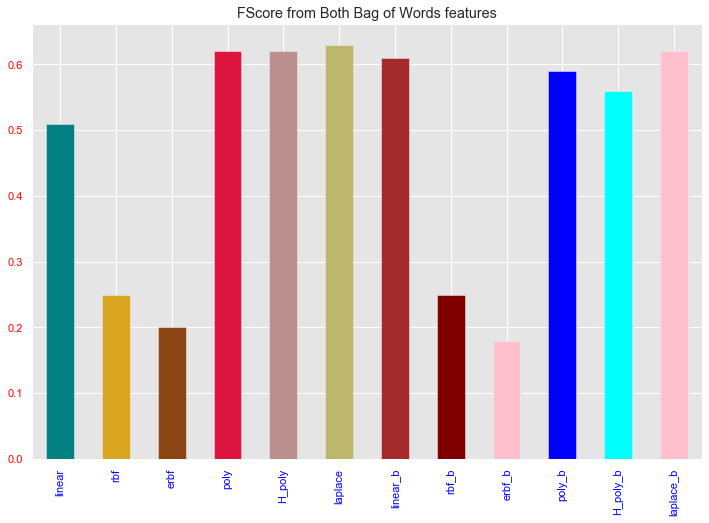

In [165]:
#Set tick colors:
#ax = plt.gca()
fig, ax = plt.subplots()
fig.set_size_inches(12, 8)

c = ['teal', 'goldenrod', 'saddlebrown','crimson','rosybrown','darkkhaki','brown','maroon','pink','blue','aqua','pink']

ax.tick_params(axis='x', colors='blue')
ax.tick_params(axis='y', colors='red')
ViewAll.Fscore.plot(kind='bar', color=c);
plt.title('FScore from Both Bag of Words features');

## Conclusion